In [1]:
%load_ext autoreload
%autoreload 2

# Import libraries

In [2]:
import numpy as np
import numpy.matlib
import pandas as pd
import scanpy as sc
from scanpy.external.pp import magic
import scipy
from sklearn.metrics import adjusted_rand_score
from scipy.stats.mstats import zscore
from scipy.stats import pearsonr
import csv
import os
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from copy import deepcopy
import timeit
from joblib import Parallel, delayed
from collections import Counter
np.random.seed(0)



In [3]:
def qc_metrics(adata, path_RB=''):
    mito_genes = adata.var_names.str.startswith('MT-')
    adata.var['mito'] = mito_genes
    mito_genes = np.array(adata.var.index)[mito_genes]
    
    path_RB = path_RB+'RB_genes_human'
    with open(path_RB,'r') as file:
        lines = file.readlines()
    RB_genes = [x.rstrip('\n') for x in lines]
    data_genes = list(adata.var.index)
    RB_genes_in_data = set(data_genes).intersection(RB_genes)
    RB_genes_in_data = list(RB_genes_in_data)
    
    adata.var['ribo'] = False
    adata.var.loc[RB_genes_in_data, 'ribo'] = True
    
    sc.pp.calculate_qc_metrics(adata, qc_vars=('mito', 'ribo'), inplace=True)
    adata.obs['original_total_counts'] = adata.obs['total_counts']
    adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])
    print('QC metrics calculated.')
    
    return adata, mito_genes, RB_genes_in_data


def norm_filter(adata, mito_genes, RB_genes_in_data, log=True, 
                remove_ribo=True, remove_mito=True, highly_var=False, markers=[]):
    
    # filter genes expressed in few cells
    print(adata.shape)
    sc.pp.filter_genes(adata, min_cells = 10)
    print(adata.shape)
    
    # libsize normalize
    if type(adata.X)==np.ndarray:
        med_libsize = np.median(np.sum(adata.X, axis=1))
    else:
        sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        #med_libsize = np.median(sums)
        if min(sums) == 0:
            empty_cells = set(np.where(sums==0)[0])
            print('# of 0-count droplets: '+str(len(empty_cells)))
            all_cells = set(adata.obs.index)
            keep_cells = all_cells-empty_cells
            adata = adata[keep_cells, :]
            sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        med_libsize = np.median(sums)
            
    print('Median library size: ' + str(med_libsize))
    
    sc.pp.normalize_total(adata)
    adata_unlog = deepcopy(adata)
    
    # log transform
    if log:
        adata.X = np.log2(adata.X+0.1)
        
        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = adata[:,i].X
            except:
                markers.remove(i)
                print(i)
        
    else:
        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = np.log2(adata[:,i].X+1)
            except:
                markers.remove(i)
                print(i)
                
    # remove ribosomal genes            
    if remove_ribo:
        RB_genes_in_data.append('MALAT1')
        adata = adata[:,[x not in RB_genes_in_data for x in adata.var.index]]
        print(adata.shape)
    
    # remove mitochondrial genes
    if remove_mito:
        adata = adata[:,[x not in mito_genes for x in adata.var.index]]
        print(adata.shape)
    
    # highly variable gene selection
    if highly_var:
        sc.pp.highly_variable_genes(adata, flavor='seurat', max_mean=np.inf, batch_key='Sample ID')
        print(sum(adata.var['highly_variable']))
        print(adata.shape)
        
    
    adata_unlog = adata_unlog[:,adata.var.index] # this may not work with highly variable genes? check layers
    
    adata.layers['unlog'] = adata_unlog.X
    del adata_unlog

    return adata, markers#adata_unlog, markers
    
    
    
def plot_pca(adata):
    #print("I am in here 1")
    
    print(adata.X)
    try:
        print(adata.shape)
        N = 1000
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    except:
        print(adata.shape) 
        N = min(adata.shape) - 1
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    
    #Plot variance explained
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = adata_new.uns['pca']['variance_ratio']
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Fraction of variance explained')
    plt.title('Fraction of variance explained per PC')
    plt.show()
    
    #Plot cumulative variance
    cml_var_explained = np.cumsum(adata_new.uns['pca']['variance_ratio'])
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = cml_var_explained
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Cumulative fraction of variance explained')
    plt.title('Cumulative fraction of variance explained by PCs')
    plt.show()
    
    return cml_var_explained, adata_new.uns['pca']['variance_ratio']
    
def kneepoint(vec):
    #print("I am in here 4")
    curve =  [1-x for x in vec]
    nPoints = len(curve)
    allCoord = np.vstack((range(nPoints), curve)).T
    np.array([range(nPoints), curve])
    firstPoint = allCoord[0]
    lineVec = allCoord[-1] - allCoord[0]
    lineVecNorm = lineVec / np.sqrt(np.sum(lineVec**2))
    vecFromFirst = allCoord - firstPoint
    scalarProduct = np.sum(vecFromFirst * numpy.matlib.repmat(lineVecNorm, nPoints, 1), axis=1)
    vecFromFirstParallel = np.outer(scalarProduct, lineVecNorm)
    vecToLine = vecFromFirst - vecFromFirstParallel
    distToLine = np.sqrt(np.sum(vecToLine ** 2, axis=1))
    idxOfBestPoint = np.argmax(distToLine)
    
    return idxOfBestPoint
    
def run_pca_knee(adata):
    cml, var = plot_pca(adata)

    knee = kneepoint(var)
    
    print("Knee point: "+str(knee))
    print("Explained variance: " + str(cml[knee]))

    x=list(range(len(cml)))
    plt.plot(x[:5*knee],cml[:5*knee])
    plt.show()

    adata_new = sc.tl.pca(adata, n_comps=knee+1, copy=True)
    sc.pl.pca_loadings(adata_new, components=range(1,4))
    
    return adata_new

In [4]:
godsnot_64 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    "#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
    "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
    "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
    "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
    "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
    "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
    "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
    "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
    "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
    "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
    "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72"]

# Populate input parameters

In [5]:
# populate from command line
samples = ['1819_C1029_Ctrl_ES_Cort_IGO_10837_23', '1820_C1029_Ctrl_ES_BS_IGO_10856_3', '1821_996_VE_ES_Cort_IGO_10875_6', '1822_996_VE_ES_BS_IGO_10875_7']
indir = './input/'
outdir = './output_Nov/'
figures = './figures/'

In [6]:
adata_final = sc.read_h5ad(outdir+'adata_final_clusters.h5ad')

In [7]:
#adata_final = sc.read_h5ad('adata_final_clusters.h5ad')

In [8]:
# Add a new column describing the sample condition
adata_final.obs['B_region'] = np.where(adata_final.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Cortex", "NA")
adata_final.obs['B_region'] = np.where(adata_final.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "BrainStem", adata_final.obs['B_region'])
adata_final.obs['B_region'] = np.where(adata_final.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "Cortex", adata_final.obs['B_region'])
adata_final.obs['B_region'] = np.where(adata_final.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "BrainStem", adata_final.obs['B_region'])


adata_final.obs
# count the number of NAs
sum(pd.isna(adata_final.obs['B_region']))

0

In [8]:
adata_final.obs['final_subclusters'].value_counts()

Excitatory_neurons    7712
Oligodendrocytes      6050
Interneurons          5034
Astrocytes            1782
Fibroblast_like        710
microglia              678
OPC                    622
Vascular_cells         347
MAC_MONO                47
Epithelial_cells        44
Ependyma                34
Name: final_subclusters, dtype: int64

## Oligodendrocytes

In [9]:
adata_oligo = deepcopy(adata_final)
adata_oligo = adata_oligo[adata_oligo.obs['final_subclusters'].isin(['Oligodendrocytes']),:]
adata_oligo.shape

/Users/fragkogs/opt/anaconda3/envs/my_braf/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(6050, 18947)

In [10]:
adata_oligo.obs.Condition.value_counts()

VE         3943
Control    2107
Name: Condition, dtype: int64

In [49]:
broad_clusters = adata_oligo.obs['Condition']
unique_clusters = np.unique(broad_clusters.values)
samples = adata_oligo.obs['Sample ID']
print('Cell counts in each cluster for each sample: ')

for cluster in unique_clusters:
    print('Cluster: '+str(cluster))
    index = broad_clusters[broad_clusters==cluster].index
    count = Counter(samples[index].values)
    print(count)

Cell counts in each cluster for each sample: 
Cluster: Control
Counter({'1820_C1029_Ctrl_ES_BS_IGO_10856_3': 1733, '1819_C1029_Ctrl_ES_Cort_IGO_10837_23': 374})
Cluster: VE
Counter({'1822_996_VE_ES_BS_IGO_10875_7': 3625, '1821_996_VE_ES_Cort_IGO_10875_6': 318})


# Re-clustering

In [11]:
path_to_h5ad_file = outdir+'adata.h5ad'
adata = sc.read_h5ad(path_to_h5ad_file)
print(adata)
# Add a new column describing the sample condition
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Control", "NA")
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "Control", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "VE", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "VE", adata.obs['Condition'])


adata.obs.head()


AnnData object with n_obs × n_vars = 26101 × 22292
    obs: 'Sample ID'


,Sample ID,Condition
cell_barcodes,,
120703436570020_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455227244_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455251884_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455704877_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120718441244516_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control


In [12]:
adata_oligo = adata[adata_oligo.obs.index, :]
adata_oligo.shape

/Users/fragkogs/opt/anaconda3/envs/my_braf/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(6050, 22292)

## QC

In [13]:
adata_oligo, mito_genes, RB_genes_in_data = qc_metrics(adata_oligo)
markers = []
if type(adata_oligo.X)==np.ndarray:
    pass
else:
    print(type(adata_oligo.X))
    #print(adata_norm.X.shape)
    adata_oligo.X = adata_oligo.X.toarray()
    #print(adata_norm.X.shape)
adata_oligo.X = pd.DataFrame(data=adata_oligo.X).fillna(0).values

Trying to set attribute `.var` of view, copying.


QC metrics calculated.
<class 'scipy.sparse.csr.csr_matrix'>


In [14]:
adata_oligo.shape

(6050, 22292)

## Normalization

In [15]:
markers = []
adata_oligo, markers = norm_filter(adata_oligo, mito_genes, RB_genes_in_data, markers=markers)#, highly_var=True)
adata_oligo.obs.head()

(6050, 22292)


/Users/fragkogs/opt/anaconda3/envs/my_braf/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(6050, 16057)
Median library size: 2051.5
(6050, 15875)
(6050, 15862)


,Sample ID,Condition,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,original_total_counts,log10_original_total_counts
cell_barcodes,,,,,,,,,,,,,,,,,,
192797300387174_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,1369,7.222566,2534.0,7.837949,24.546172,33.307024,45.027624,65.706393,0.0,0.000000,0.000000,10.0,2.397895,0.394633,2534.0,3.403807
192104046123877_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,832,6.725034,1153.0,7.050990,22.202949,31.049436,45.186470,71.205551,33.0,3.526361,2.862099,19.0,2.995732,1.647875,1153.0,3.061829
135475976595875_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,1023,6.931472,1589.0,7.371490,23.033354,32.850850,45.437382,67.086218,16.0,2.833213,1.006923,14.0,2.708050,0.881057,1589.0,3.201124
170755616364893_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,2417,7.790696,4857.0,8.488382,19.044678,25.983117,35.577517,53.180976,47.0,3.871201,0.967676,32.0,3.496508,0.658843,4857.0,3.686368
240550847822262_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,905,6.809039,1340.0,7.201171,25.597015,34.029851,47.388060,69.776119,14.0,2.708050,1.044776,23.0,3.178054,1.716418,1340.0,3.127105


## PCA

In [ ]:
sc.set_figure_params(figsize=(5, 5))
adata_oligo = run_pca_knee(adata_oligo)#, 0.5)
adata_oligo.obs['PC 1'] = adata_oligo.obsm['X_pca'][:,0] # optional
adata_oligo.obs['PC 2'] = adata_oligo.obsm['X_pca'][:,1]
adata_oligo.obs['PC 3'] = adata_oligo.obsm['X_pca'][:,2]

print(adata_oligo.shape)
adata_oligo.X = pd.DataFrame(adata_oligo.X).fillna(0).values
index_list = np.arange(adata_oligo.shape[0])
np.random.shuffle(index_list)
adata_oligo = adata_oligo[index_list,:]

[[-0.13569841 -3.321928   -3.321928   ... -3.321928   -3.321928
  -3.321928  ]
 [-3.321928   -3.321928   -3.321928   ... -3.321928   -3.321928
  -3.321928  ]
 [-3.321928   -3.321928   -3.321928   ... -3.321928   -3.321928
  -3.321928  ]
 ...
 [-3.321928   -3.321928   -3.321928   ... -3.321928   -3.321928
  -3.321928  ]
 [-3.321928   -3.321928   -3.321928   ... -3.321928   -3.321928
  -3.321928  ]
 [-3.321928   -3.321928   -3.321928   ... -3.321928   -3.321928
  -3.321928  ]]
(6050, 15862)


In [ ]:
print(adata_oligo.shape)
adata_oligo.X = pd.DataFrame(adata_oligo.X).fillna(0).values
index_list = np.arange(adata_oligo.shape[0])
np.random.shuffle(index_list)
adata_oligo = adata_oligo[index_list,:]

## Phenograph

In [21]:
k_list = list(range(10, 55, 5))
n_clusters = []
for k in k_list:
    communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_oligo.obsm['X_pca']),k=k)
    n_clusters.append(len(np.unique(communities)))
    adata_oligo.obs['PhenoGraph_clusters_oligo'+str(k)] = pd.Categorical(communities)
    adata_oligo.uns['PhenoGraph_Q_'+str(k)] = Q
    adata_oligo.uns['PhenoGraph_k_'+str(k)] = k
plt.plot(k_list,n_clusters)
plt.ylabel("Number of clusters")
plt.xlabel("k")

ImportError: please install the latest release of phenograph:
	pip install -U PhenoGraph

In [21]:
pip install -U PhenoGraph

Note: you may need to restart the kernel to use updated packages.


In [ ]:
Rand_index_df = pd.DataFrame(np.zeros((len(k_list), len(k_list))),index=k_list,columns=k_list)
Rand_index_df.index.name='k1'
Rand_index_df.columns.name='k2'
row_ind = 0
for run1 in range(len(k_list)):
    col_ind = 0
    for run2 in range(len(k_list)):
        Rand_index_df.iloc[row_ind,col_ind] = adjusted_rand_score(
            adata_oligo.obs['PhenoGraph_clusters_oligo'+str(k_list[run1])].values,
            adata_oligo.obs['PhenoGraph_clusters_oligo'+str(k_list[run2])].values)
        col_ind = col_ind+1
    row_ind = row_ind+1
    

In [ ]:
Rand_fig = plt.figure(figsize = (10,10))
plt.xlabel('k1')
plt.ylabel('k2')
plt.title('Adjusted Rand Score',fontsize=15)
sns.set(font_scale=1)
sns.heatmap(Rand_index_df, cmap=('coolwarm'), square=True, vmin=0, vmax=1)
# plt.colorbar(vmin=0)
plt.show();plt.close()


In [ ]:
k = 35 # choose k
communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_oligo.obsm['X_pca']),k=k) # run PhenoGraph
adata_oligo.obs['PhenoGraph_clusters_oligo'] = pd.Categorical(communities)
adata_oligo.uns['PhenoGraph_Q'] = Q
adata_oligo.uns['PhenoGraph_k'] = k

In [ ]:
sc.set_figure_params(figsize=(8, 8))
sc.pp.neighbors(adata_oligo, method='umap', use_rep='X_pca')
sc.tl.umap(adata_oligo, random_state=None)
#adata_oligo_VE = adata_oligo.copy()
#adata_oligo_VE = adata_oligo_VE[adata_oligo_VE.obs.Condition == 'VE']

adata_oligo_WT = adata_oligo.copy()
adata_oligo_WT = adata_oligo_WT[adata_oligo_WT.obs.Condition != 'VE']

sc.pl.umap(adata_final, 
           color= ['final_subclusters'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["All samples"])

sc.pl.umap(adata_oligo, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,#['#0E8CB8', '#E52DC4'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligo Sample ID"])


In [ ]:

sc.pl.umap(adata_oligo, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligo Condition"])

sc.pl.umap(adata_oligo, 
           color= ['B_region'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#FF34FF", "#FF4A46"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligo Brain Region"])

sc.pl.umap(adata_oligo_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligo WT"])

sc.pl.umap(adata_oligo_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligo VE"])

## Cortex

In [9]:
adata_oligo_cortex = adata_oligo.copy()
adata_oligo_cortex = adata_oligo_cortex[adata_oligo_cortex.obs['B_region'].isin(['Cortex']),:]
adata_oligo_cortex.shape

(692, 18947)

In [10]:
adata_oligo_cortex.obs.Condition.value_counts()

Control    374
VE         318
Name: Condition, dtype: int64

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


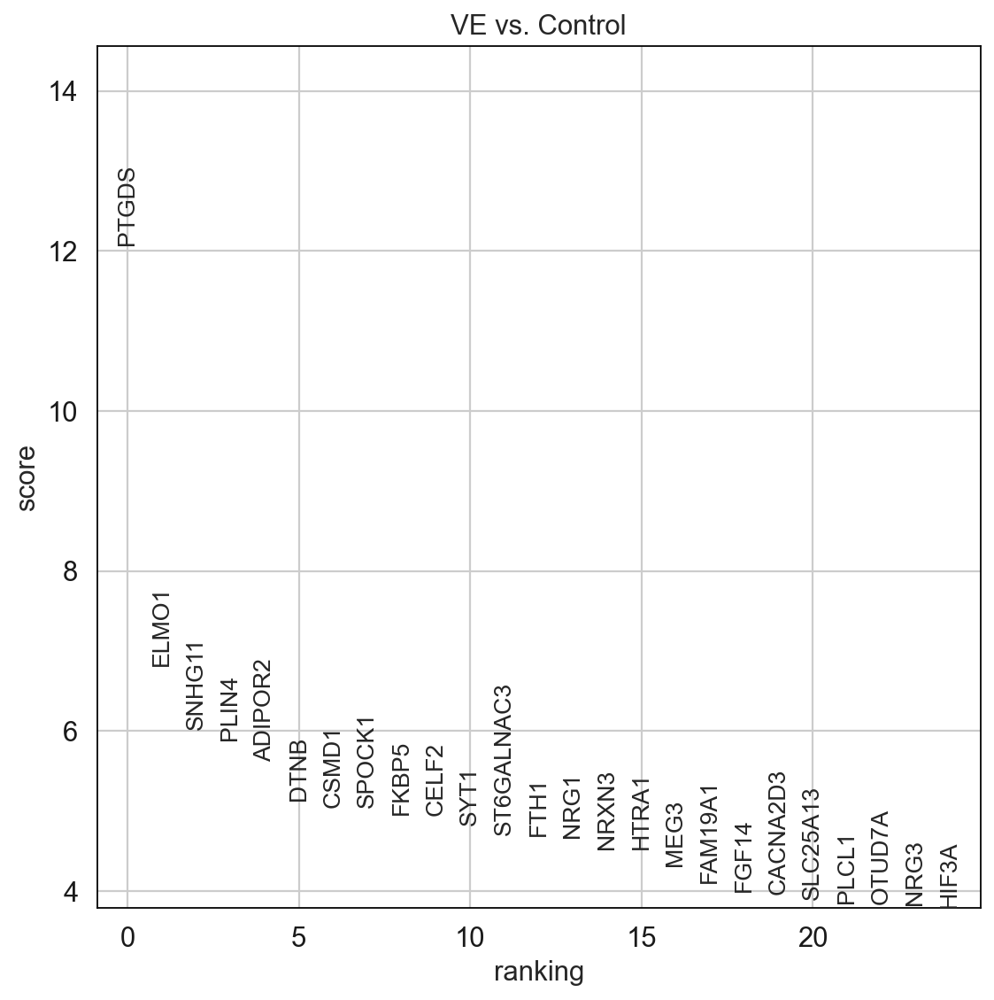

In [38]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Oligo_CORT_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_oligo_cortex, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_oligo_cortex, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_oligo_cortex.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join('/Users/fragkogs/Desktop/', key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

## BrainStem

In [38]:
adata_oligo_BS = adata_oligo.copy()
adata_oligo_BS = adata_oligo_BS[adata_oligo_BS.obs['B_region'].isin(['BrainStem']),:]
adata_oligo_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


(5358, 18947)

In [23]:
adata_oligo_BS.obs.Condition.value_counts()

VE         3625
Control    1733
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


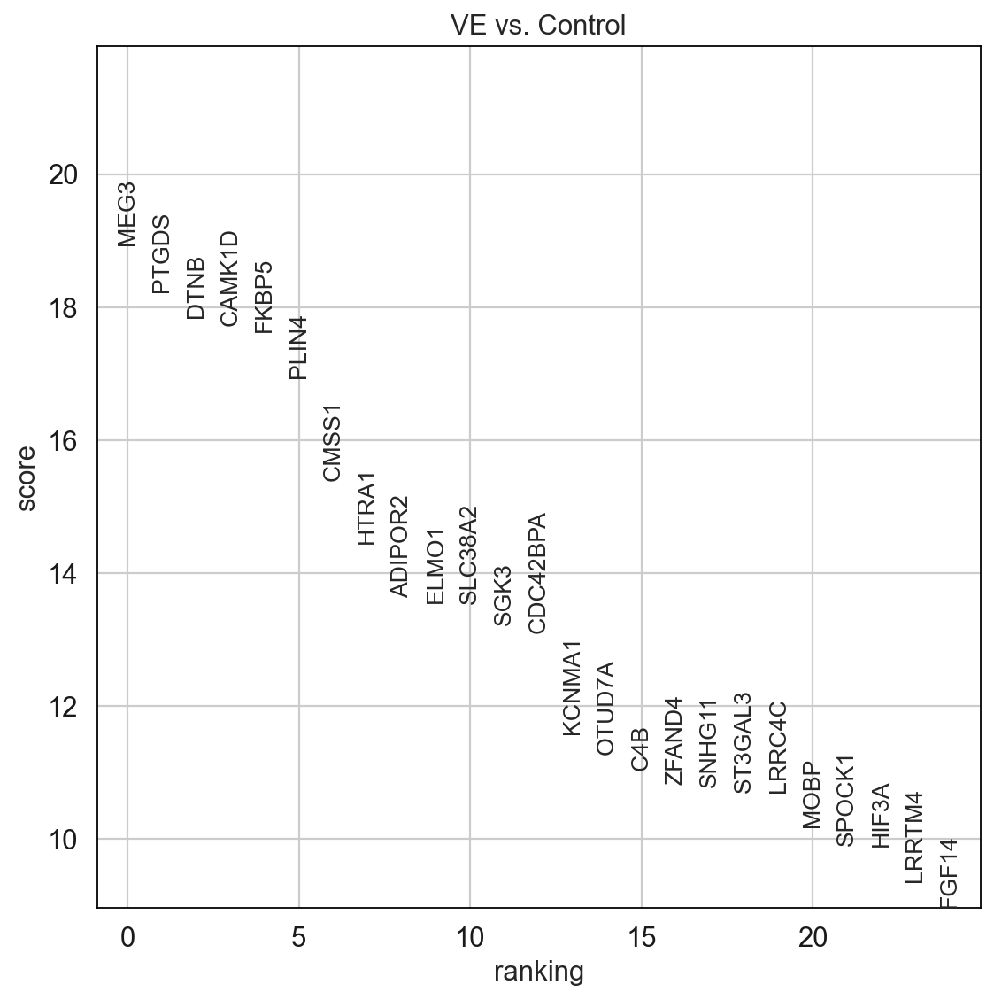

In [24]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Oligo_BS_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_oligo_BS, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_oligo_BS, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_oligo_BS.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join("/Users/fragkogs/Desktop/", key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

## Microglia

In [54]:
adata_microglia = deepcopy(adata_final)
adata_microglia = adata_microglia[adata_microglia.obs['final_subclusters'].isin(['microglia']),:]
adata_microglia.shape

/Users/fragkogs/opt/anaconda3/envs/braf_env/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(678, 18947)

In [55]:
adata_microglia.obs.Condition.value_counts()

VE         510
Control    168
Name: Condition, dtype: int64

... storing 'B_region' as categorical


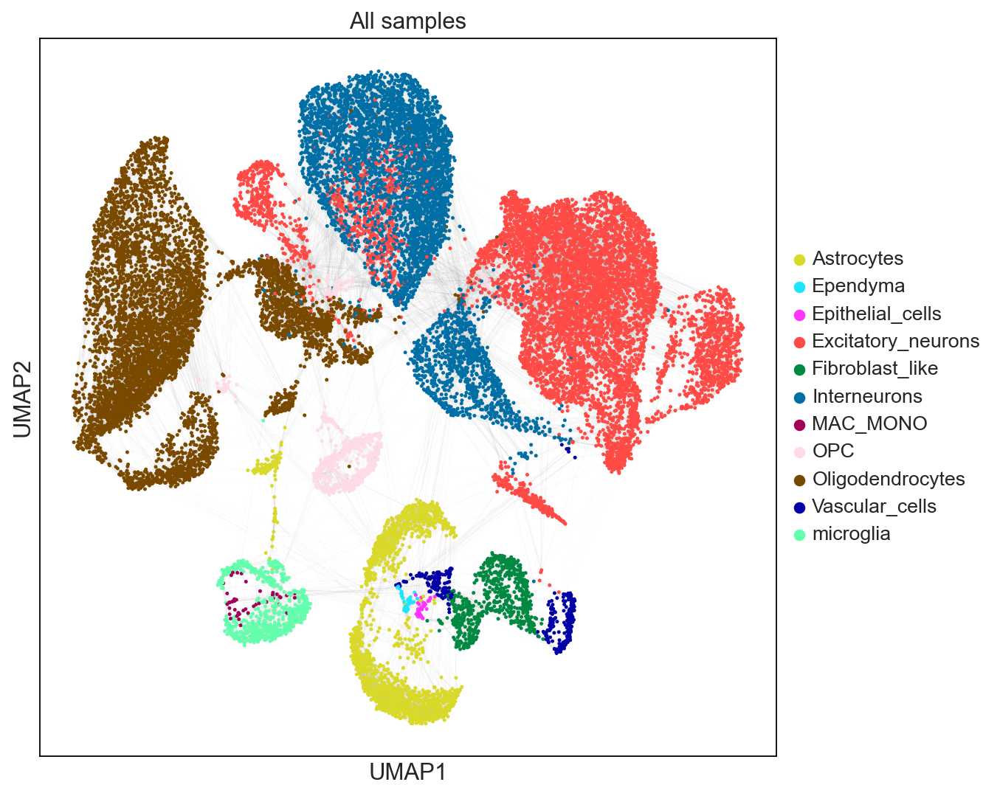

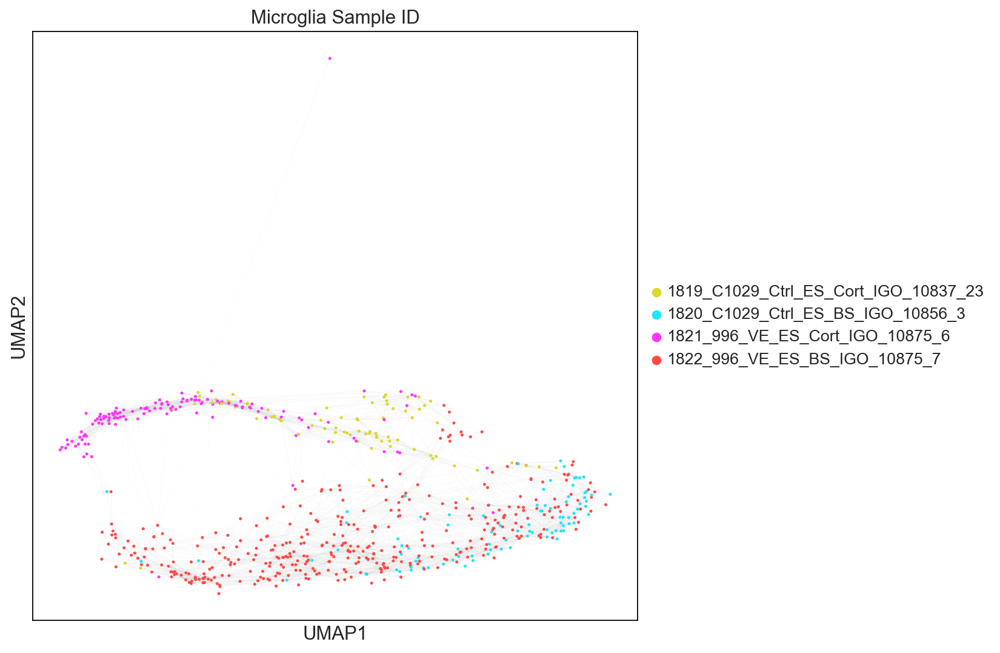

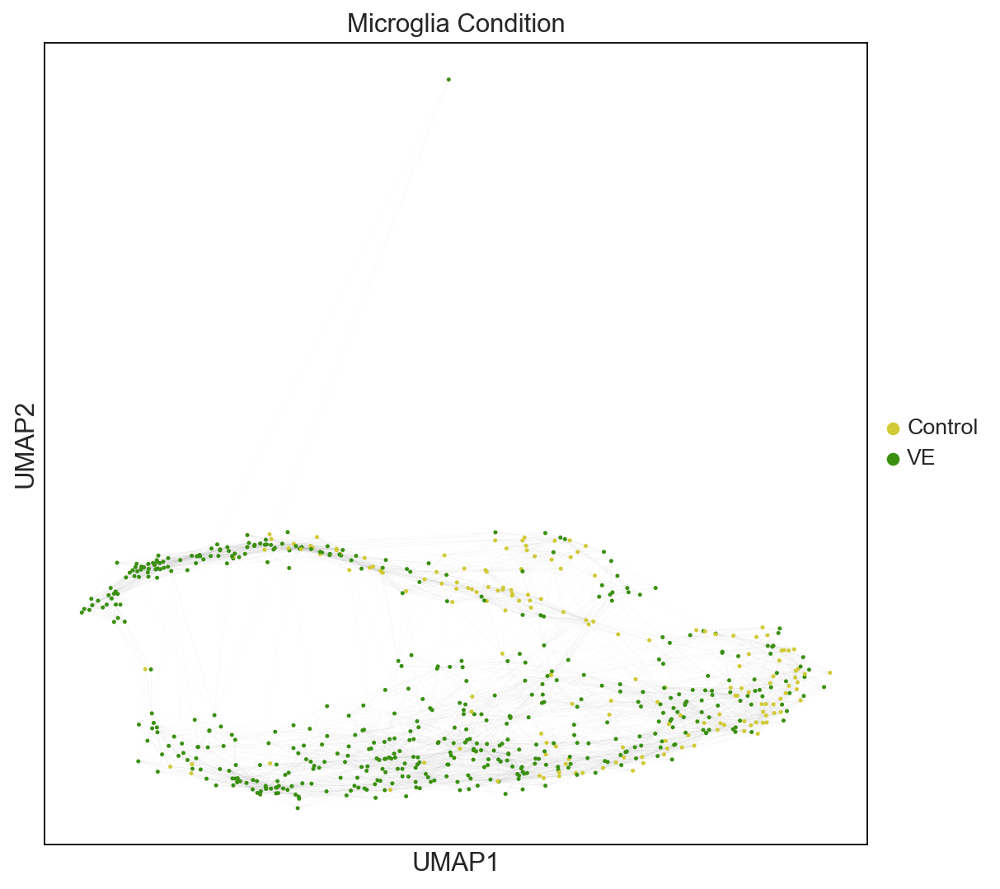

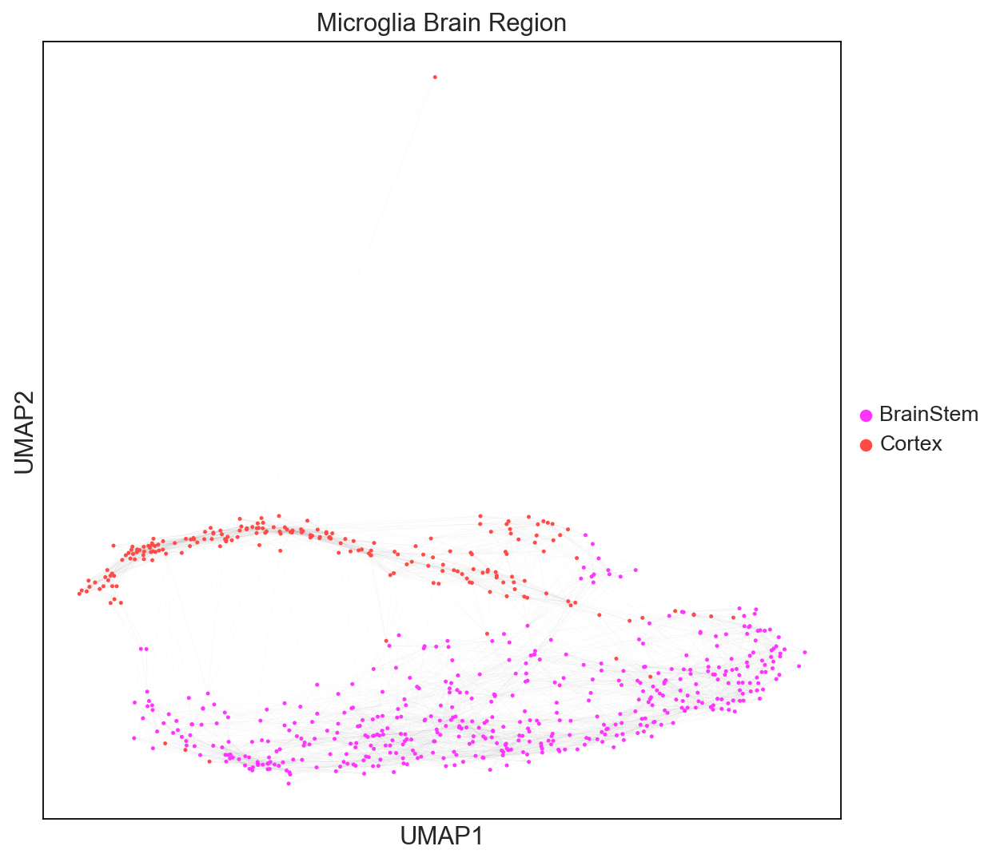

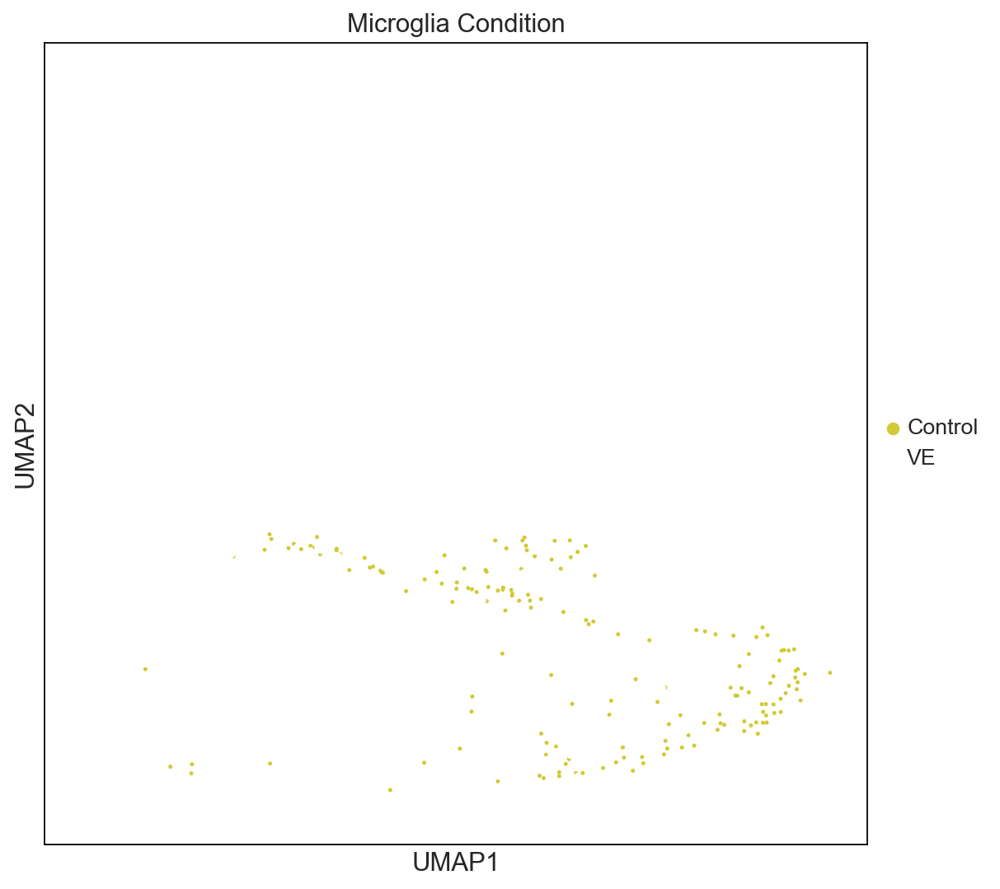

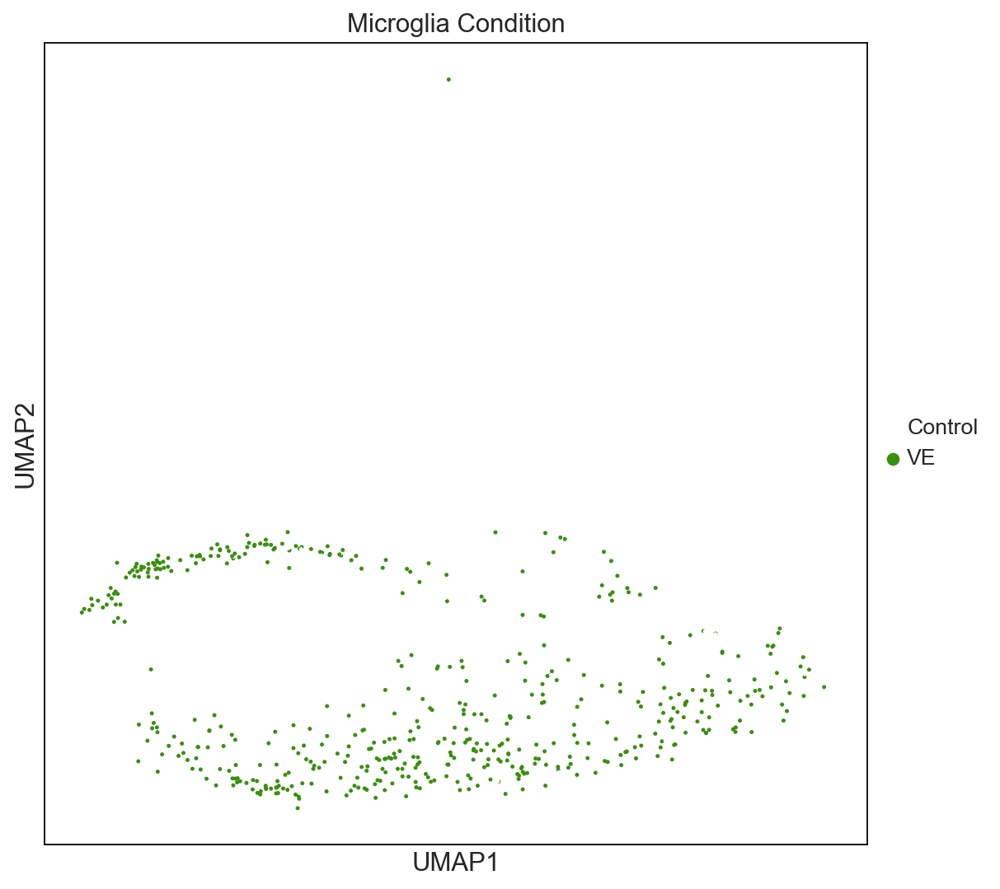

In [26]:
sc.set_figure_params(figsize=(8, 8))
adata_microglia_VE = adata_microglia.copy()
adata_microglia_VE = adata_microglia_VE[adata_microglia_VE.obs.Condition == 'VE']

adata_microglia_WT = adata_microglia.copy()
adata_microglia_WT = adata_microglia_WT[adata_microglia_WT.obs.Condition == 'Control']

sc.pl.umap(adata_final, 
           color= ['final_subclusters'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["All samples"])

sc.pl.umap(adata_microglia, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,#['#0E8CB8', '#E52DC4'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Sample ID"])

sc.pl.umap(adata_microglia, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Condition"])

sc.pl.umap(adata_microglia, 
           color= ['B_region'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#FF34FF", "#FF4A46"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Brain Region"])

sc.pl.umap(adata_microglia, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette= ['#D1CA35','#FFFFFFFF'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Condition"])


sc.pl.umap(adata_microglia, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette= ['#FFFFFFFF','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Condition"])

### Cortex

In [29]:
adata_microglia_cortex = adata_microglia.copy()
adata_microglia_cortex = adata_microglia_cortex[adata_microglia_cortex.obs['B_region'].isin(['Cortex']),:]
adata_microglia_cortex.shape

/Users/fragkogs/opt/anaconda3/envs/braf_env/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(208, 18947)

Trying to set attribute `.uns` of view, copying.


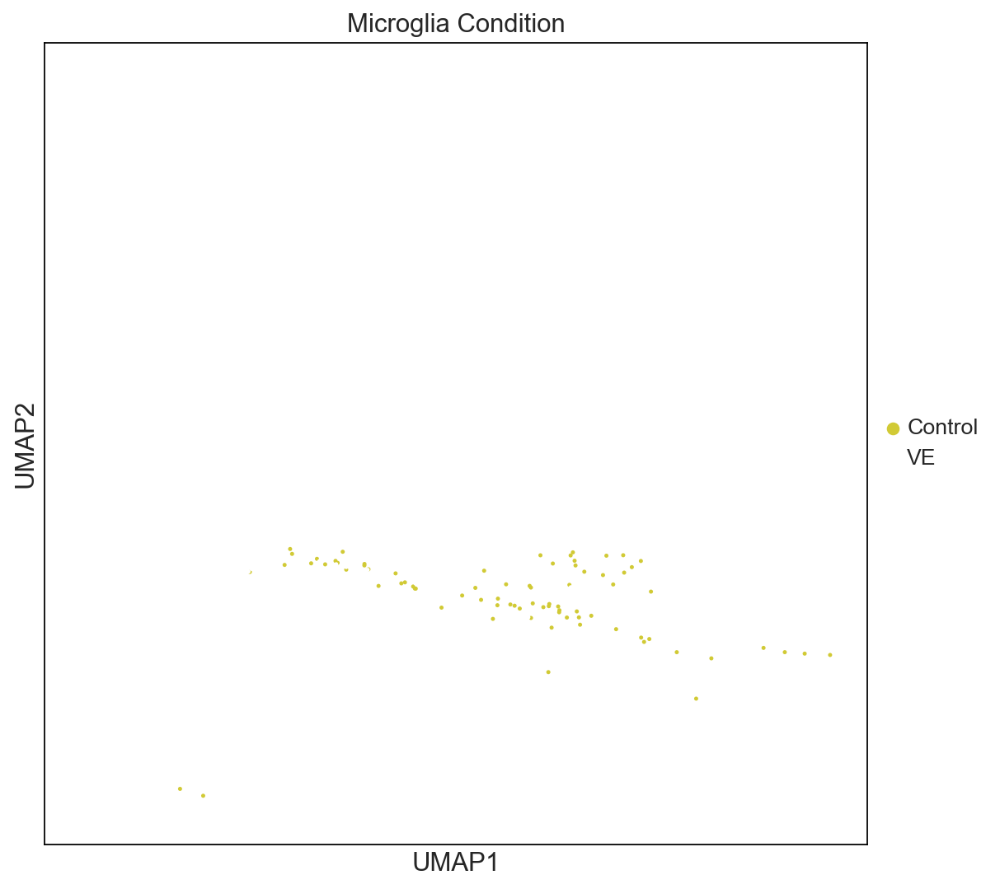

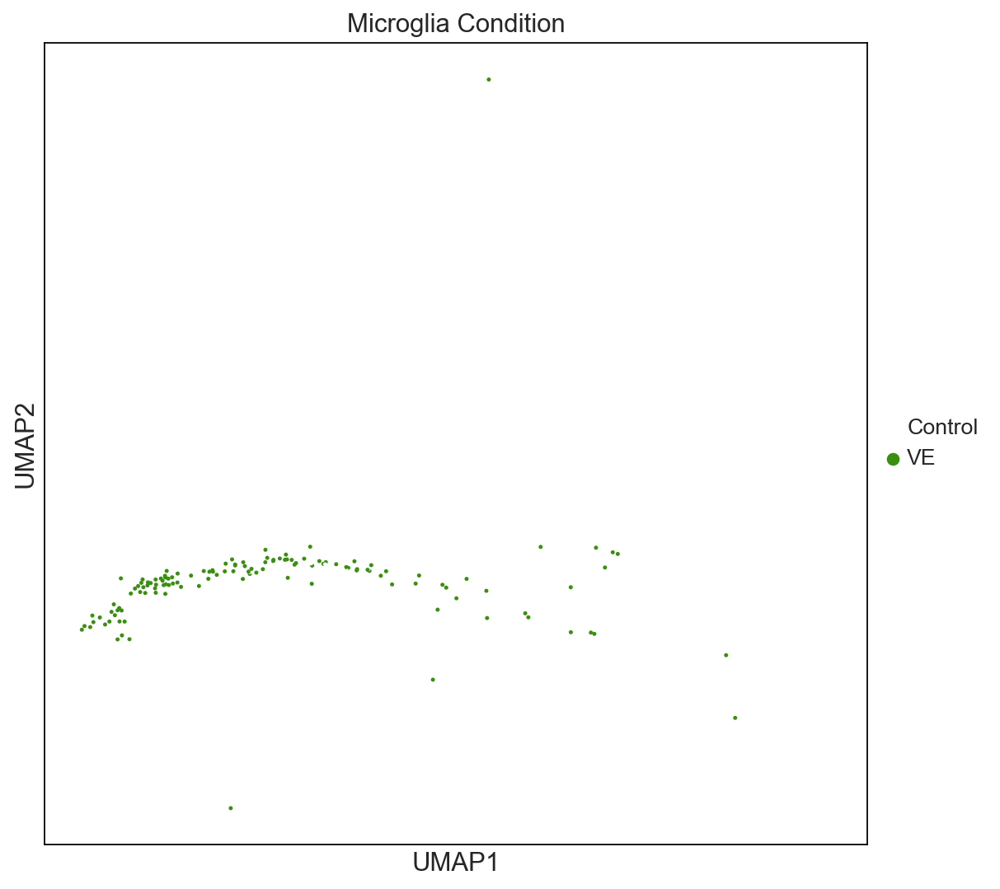

In [30]:
sc.pl.umap(adata_microglia_cortex, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette= ['#D1CA35','#FFFFFFFF'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Condition"])


sc.pl.umap(adata_microglia_cortex, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette= ['#FFFFFFFF','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Condition"])

In [23]:
adata_microglia_cortex.obs.Condition.value_counts()

VE         129
Control     79
Name: Condition, dtype: int64

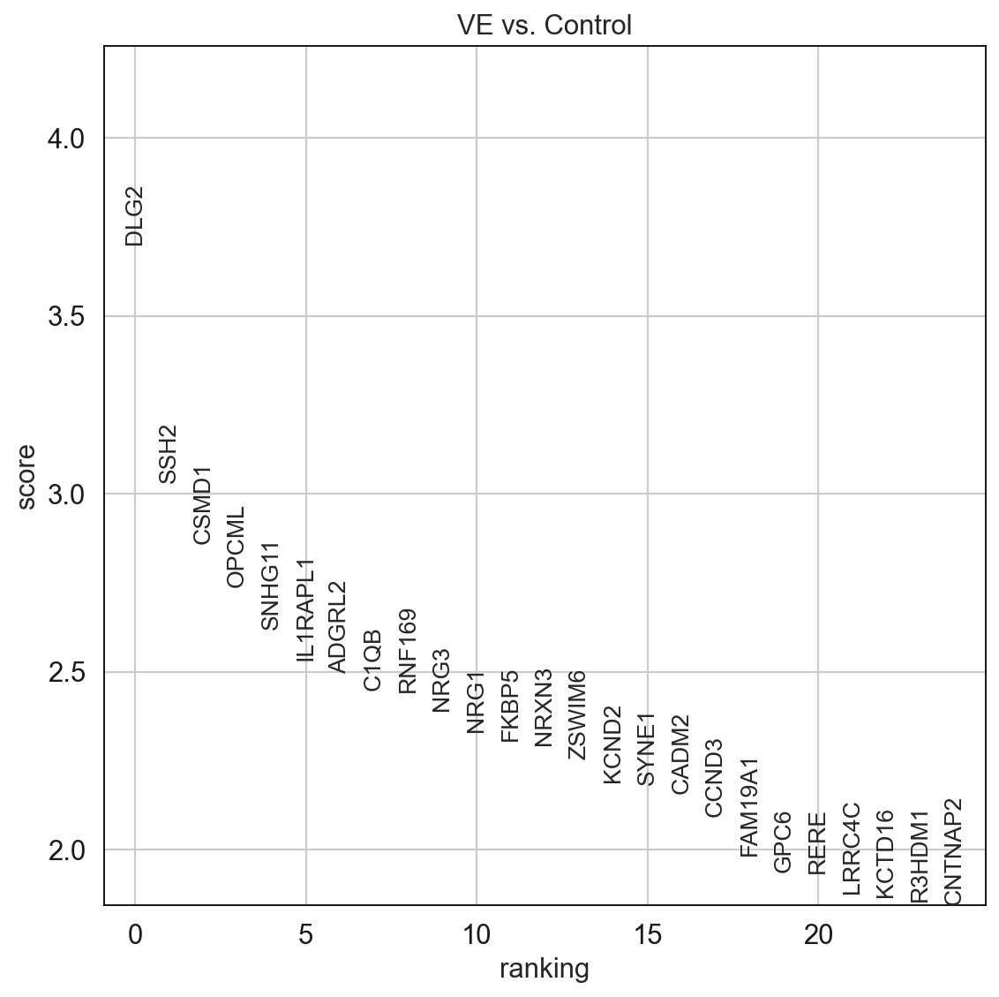

In [25]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Microglia_CORT_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_microglia_cortex, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_microglia_cortex, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_microglia_cortex.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

### BrainStem

In [31]:
adata_microglia_BS = adata_microglia.copy()
adata_microglia_BS = adata_microglia_BS[adata_microglia_BS.obs['B_region'].isin(['BrainStem']),:]
adata_microglia_BS.shape

(470, 18947)

In [27]:
adata_microglia_BS.obs.Condition.value_counts()

VE         381
Control     89
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.


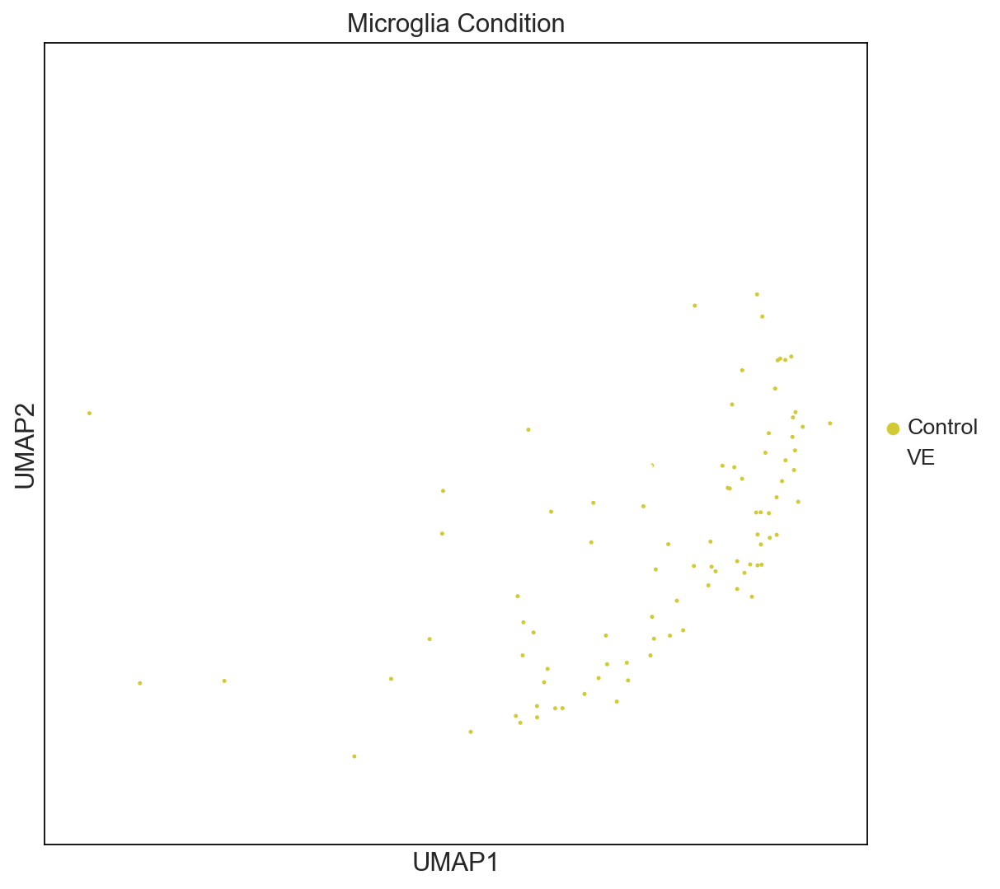

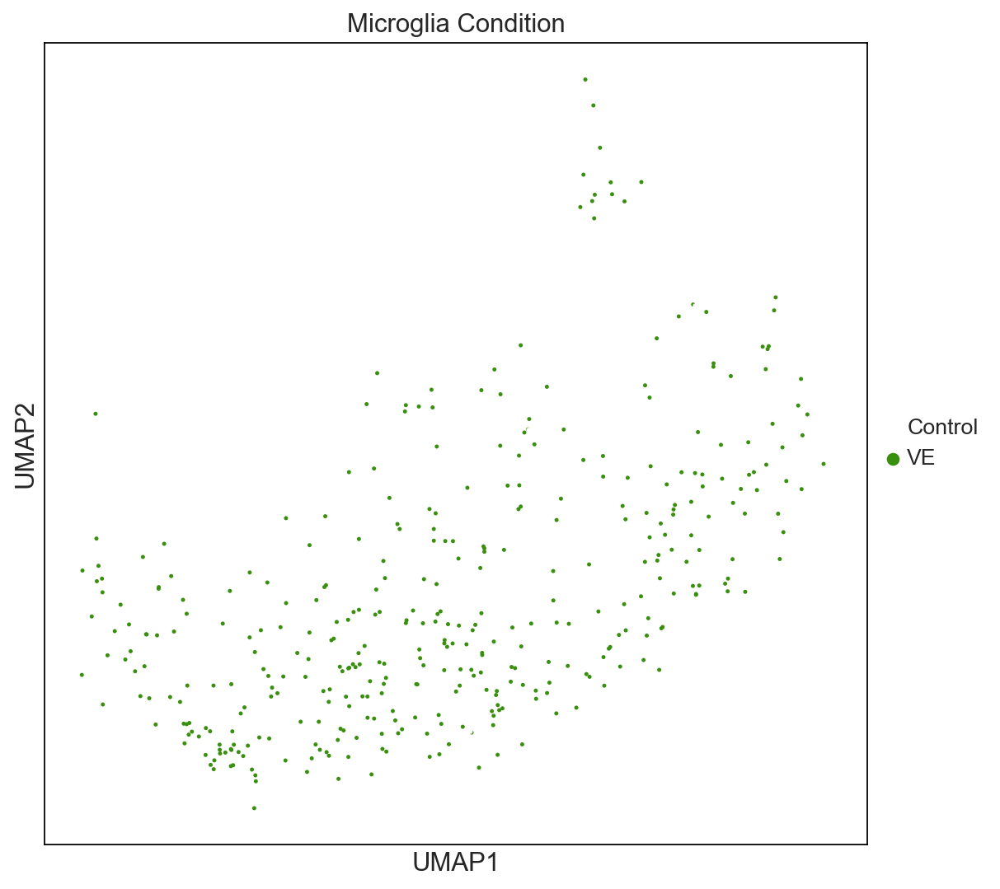

In [32]:
sc.pl.umap(adata_microglia_BS, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette= ['#D1CA35','#FFFFFFFF'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Condition"])


sc.pl.umap(adata_microglia_BS, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette= ['#FFFFFFFF','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Microglia Condition"])

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


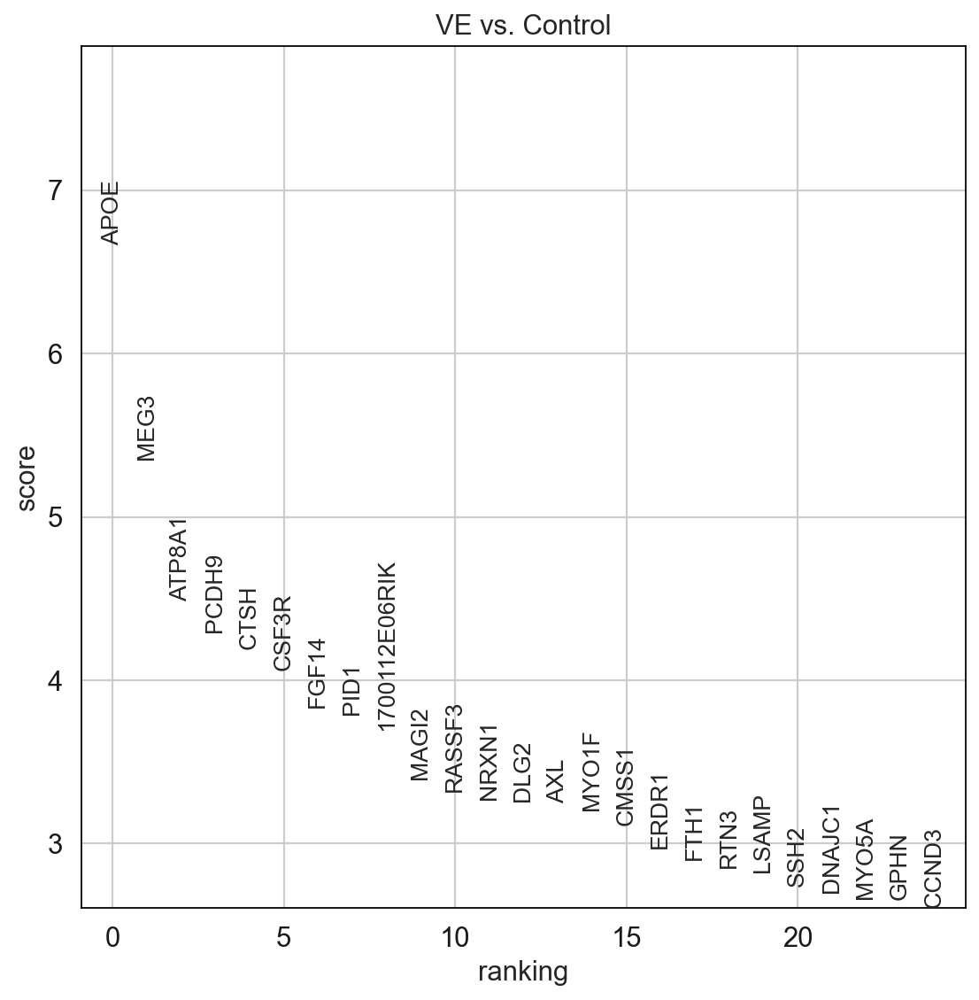

In [28]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Microglia_BS_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_microglia_BS, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_microglia_BS, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_microglia_BS.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

## Astrocytes

In [56]:
adata_astro = deepcopy(adata_final)
adata_astro = adata_astro[adata_astro.obs['final_subclusters'].isin(['Astrocytes']),:]
adata_astro.shape

(1782, 18947)

In [57]:
adata_astro.obs.Condition.value_counts()

VE         955
Control    827
Name: Condition, dtype: int64

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'B_region' as categorical


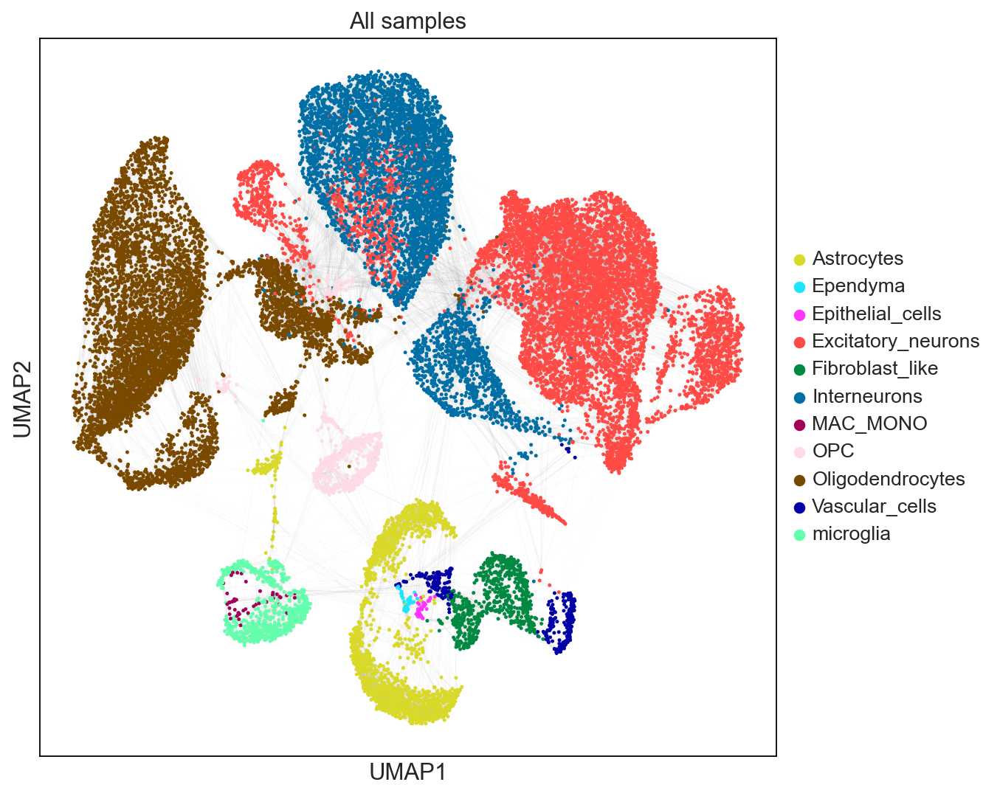

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


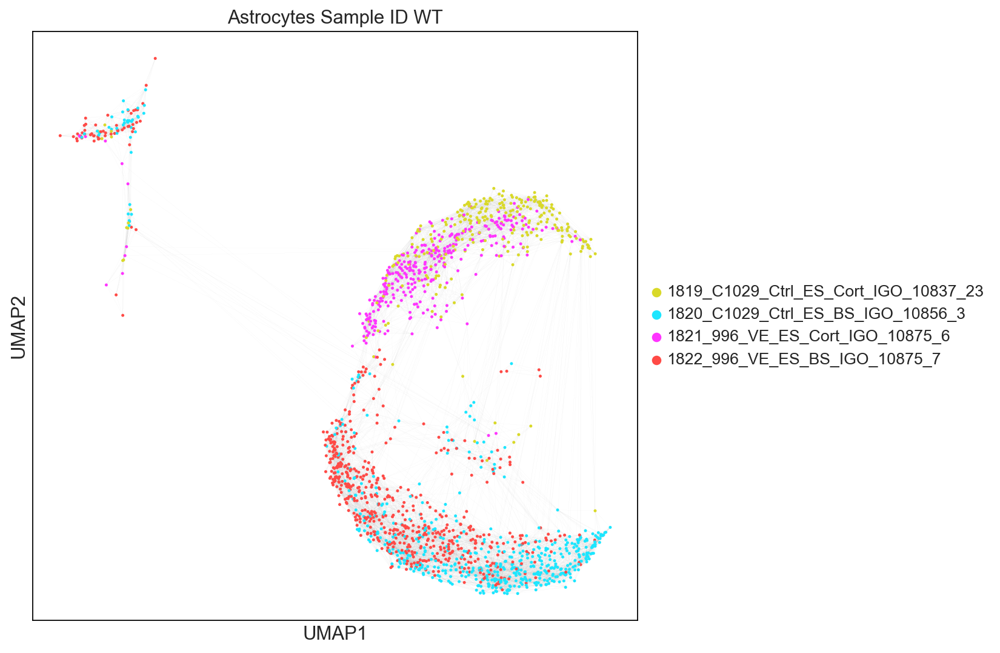

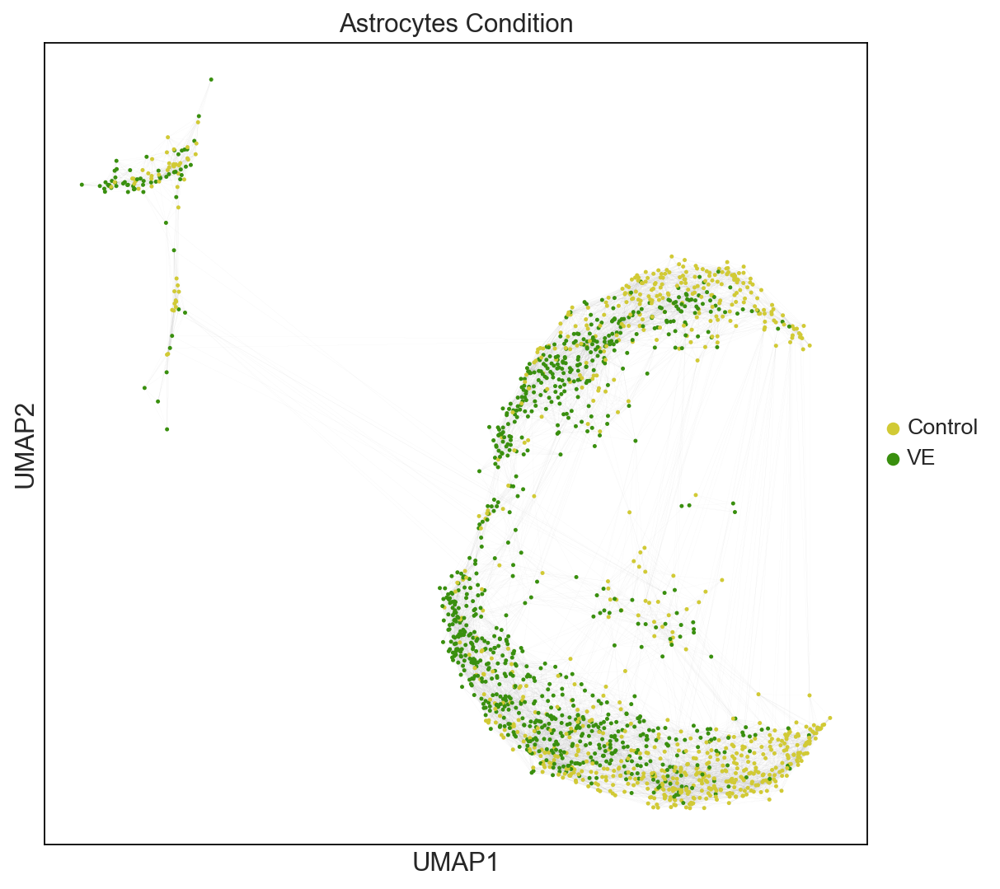

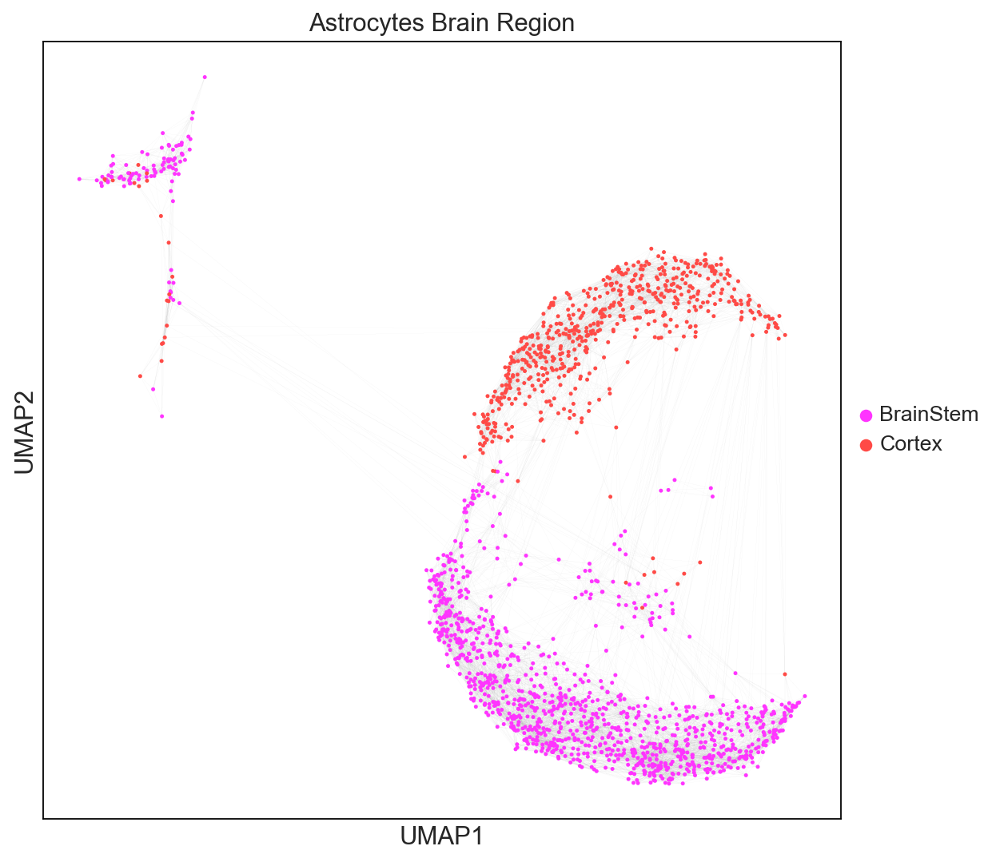

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


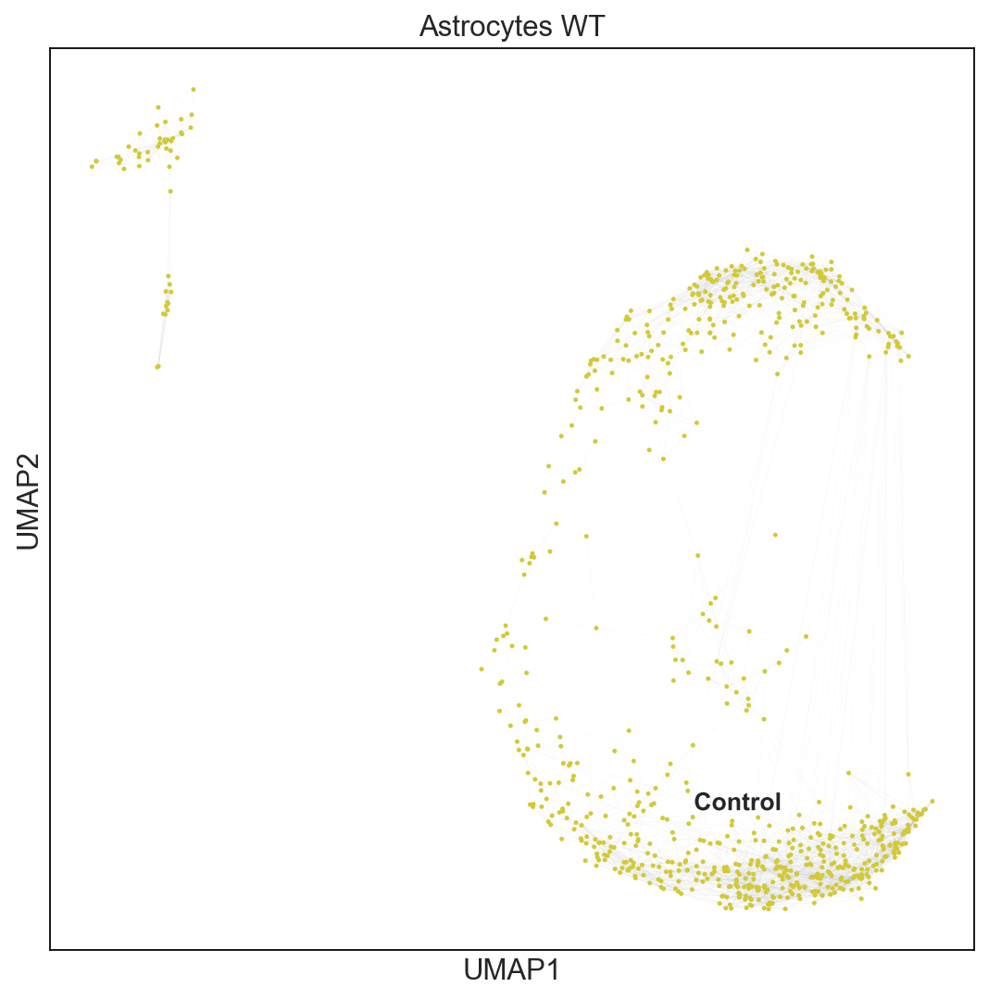

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


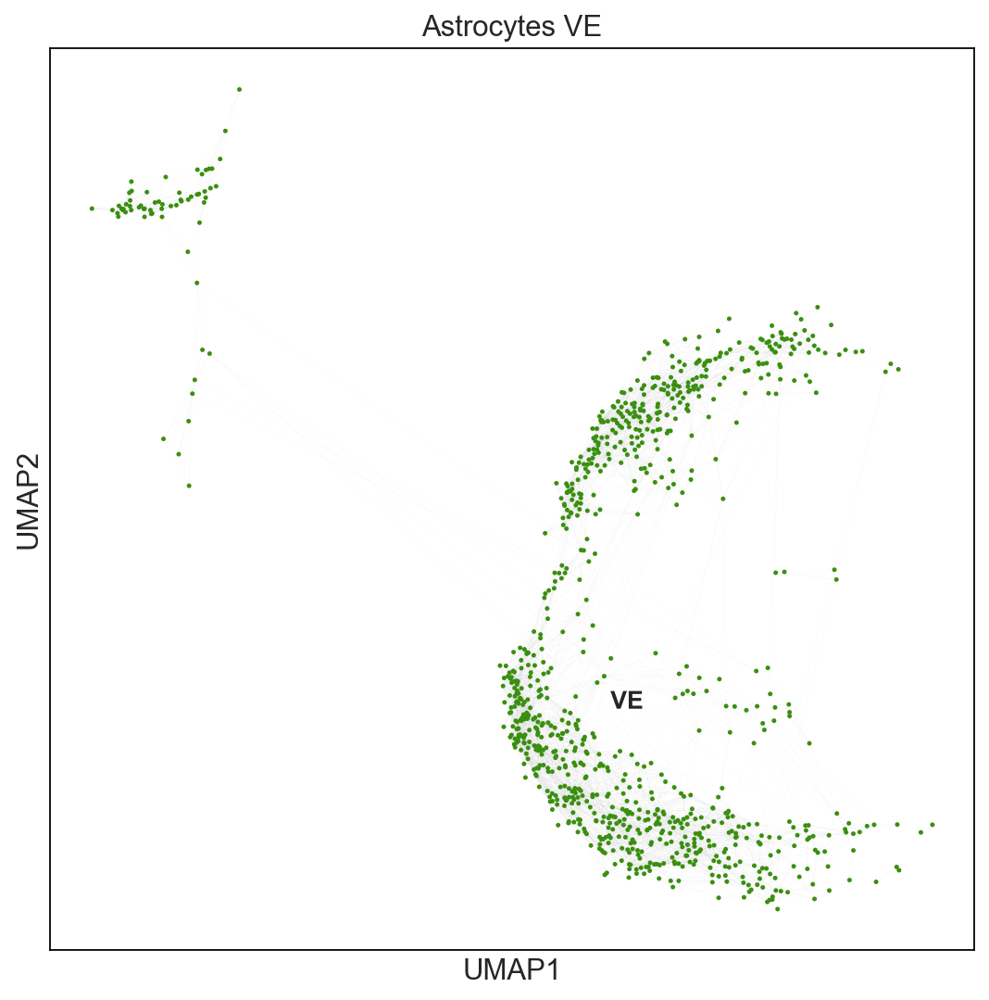

In [8]:
sc.set_figure_params(figsize=(8, 8))
adata_astro_VE = adata_astro.copy()
adata_astro_VE = adata_astro_VE[adata_astro_VE.obs.Condition == 'VE']

adata_astro_WT = adata_astro.copy()
adata_astro_WT = adata_astro_WT[adata_astro_WT.obs.Condition != 'VE']

sc.pl.umap(adata_final, 
           color= ['final_subclusters'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["All samples"])

sc.pl.umap(adata_astro, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,#['#0E8CB8', '#E52DC4'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes Sample ID WT"])

sc.pl.umap(adata_astro, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes Condition"])

sc.pl.umap(adata_astro, 
           color= ['B_region'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#FF34FF", "#FF4A46"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes Brain Region"])

sc.pl.umap(adata_astro_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes WT"])

sc.pl.umap(adata_astro_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes VE"])

### Cortex

In [31]:
adata_astro_cortex = adata_astro.copy()
adata_astro_cortex = adata_astro_cortex[adata_astro_cortex.obs['B_region'].isin(['Cortex']),:]
adata_astro_cortex.shape

(606, 18947)

In [10]:
adata_astro_cortex.obs.Condition.value_counts()

VE         324
Control    282
Name: Condition, dtype: int64

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


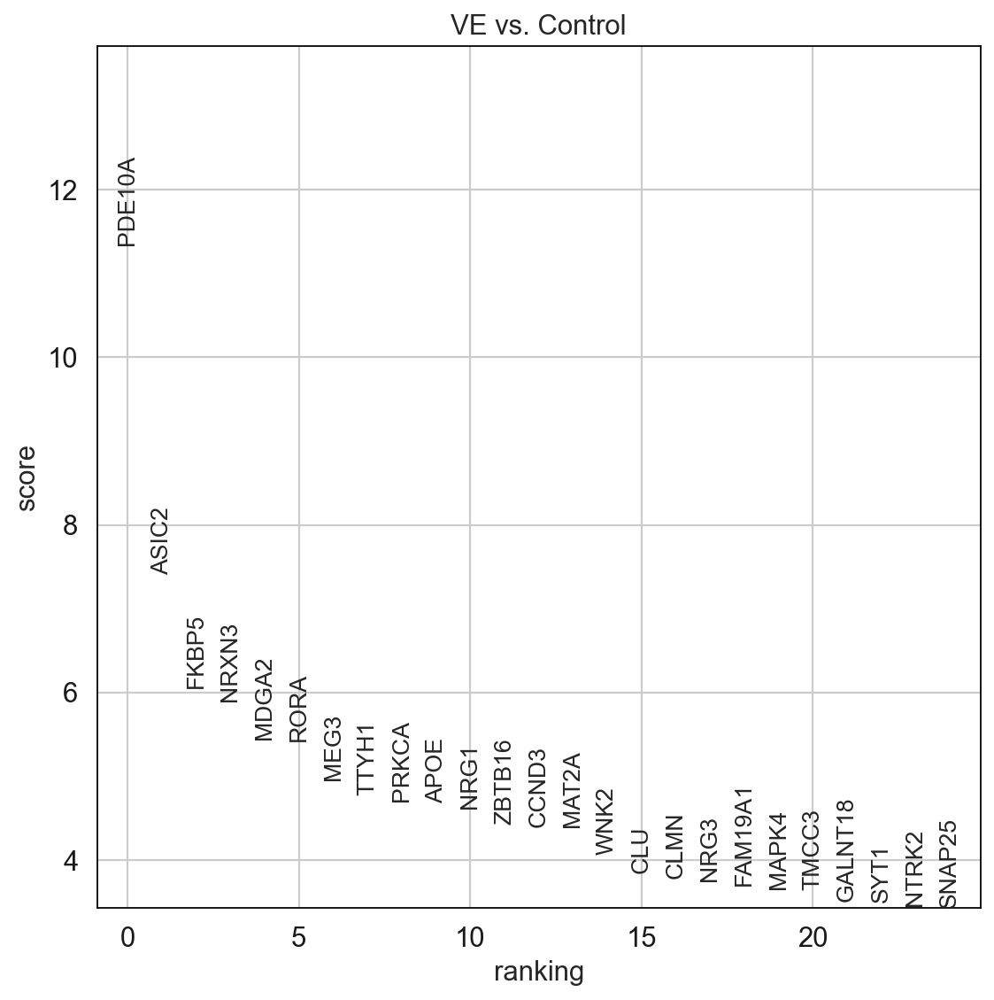

In [12]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Astrocytes_CORT_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_astro_cortex, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_astro_cortex, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_astro_cortex.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

### BrainStem

In [33]:
adata_astro_BS = adata_astro.copy()
adata_astro_BS = adata_astro_BS[adata_astro_BS.obs['B_region'].isin(['BrainStem']),:]
adata_astro_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


(1176, 18947)

In [14]:
adata_astro_BS.obs.Condition.value_counts()

VE         631
Control    545
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


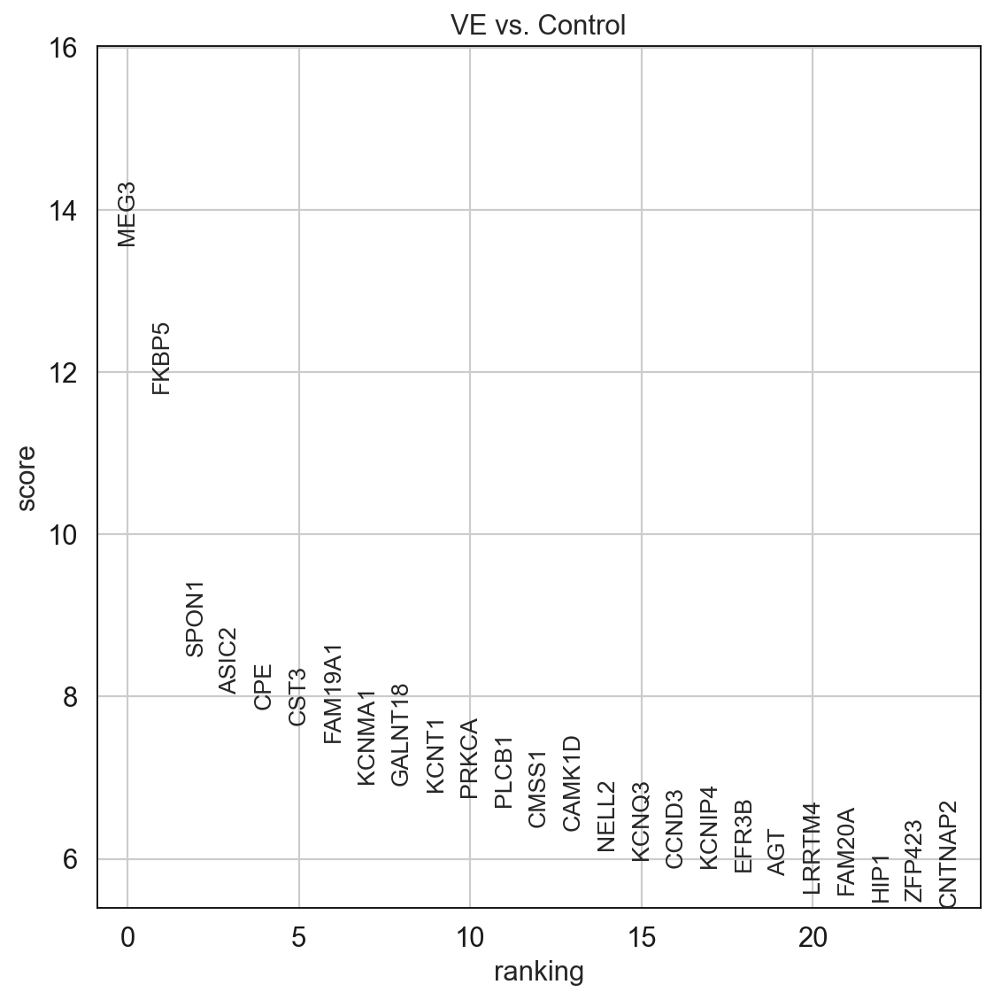

In [15]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Astrocytes_BS_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_astro_BS, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_astro_BS, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_astro_BS.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

## OPC

In [58]:
adata_opc = deepcopy(adata_final)
adata_opc = adata_opc[adata_opc.obs['final_subclusters'].isin(['OPC']),:]
adata_opc.shape

/Users/fragkogs/opt/anaconda3/envs/braf_env/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(622, 18947)

In [59]:
adata_opc.obs.Condition.value_counts()

VE         355
Control    267
Name: Condition, dtype: int64

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'B_region' as categorical


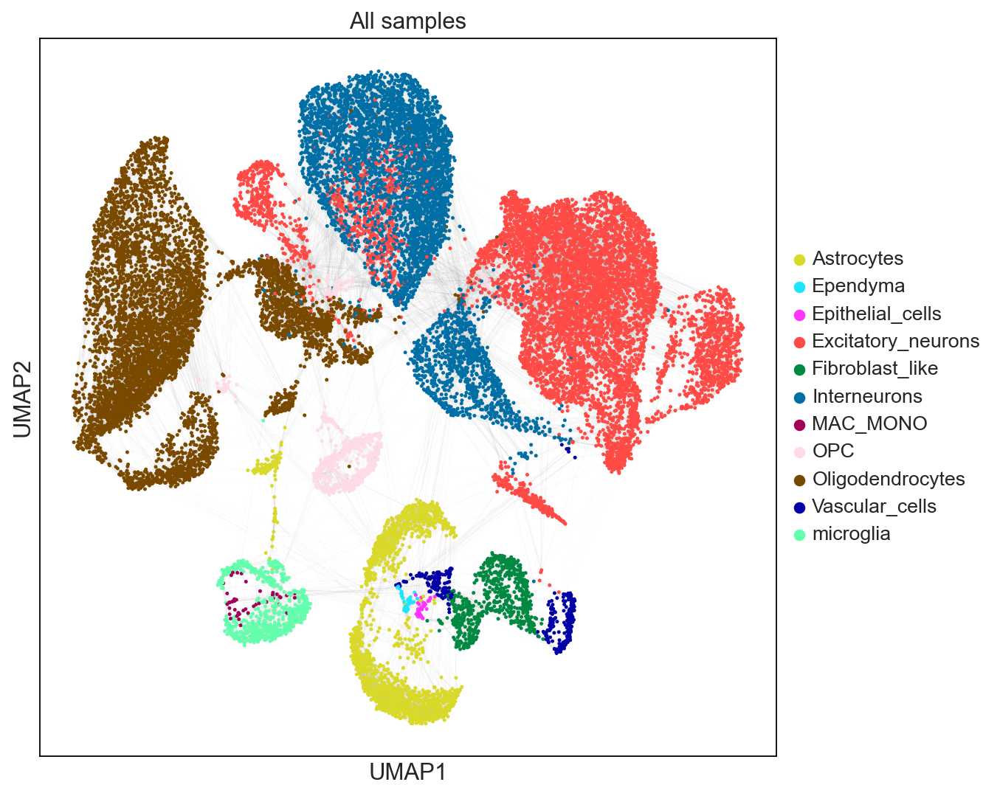

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


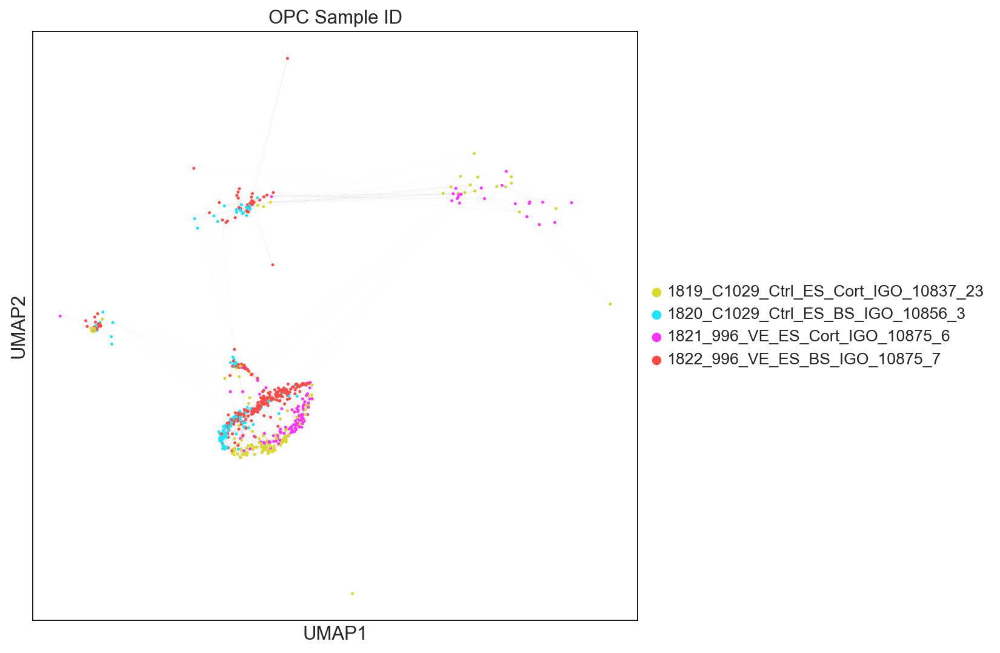

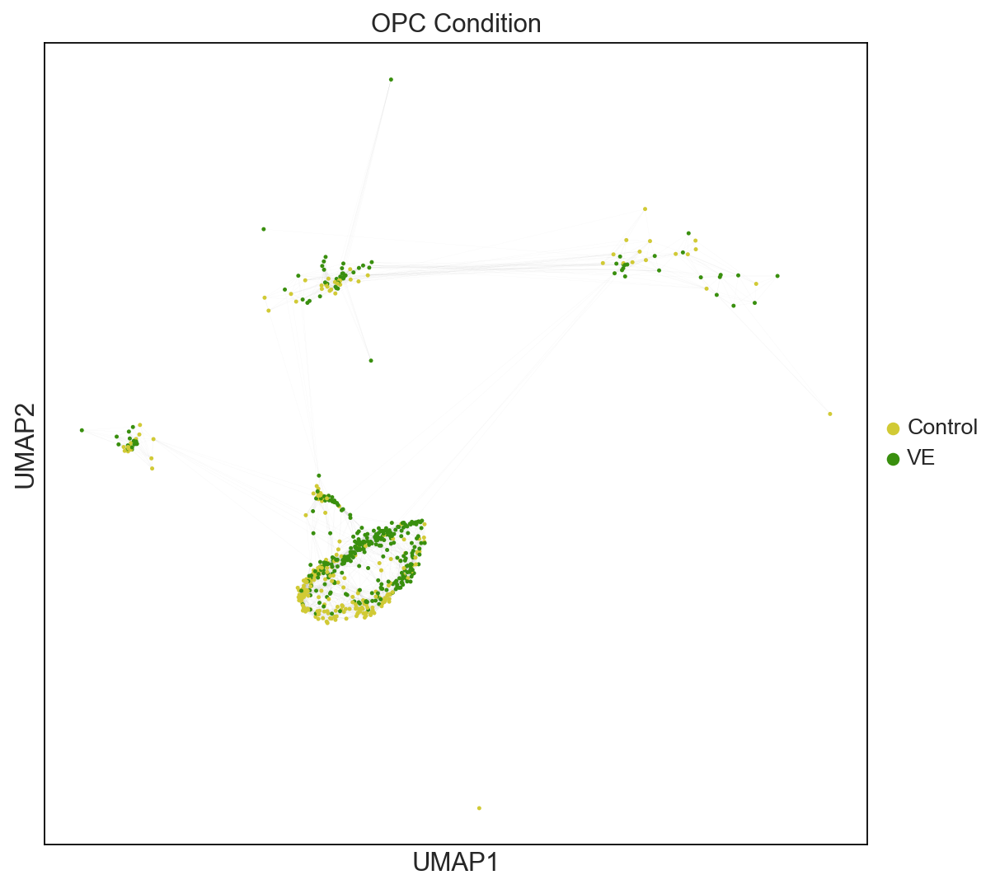

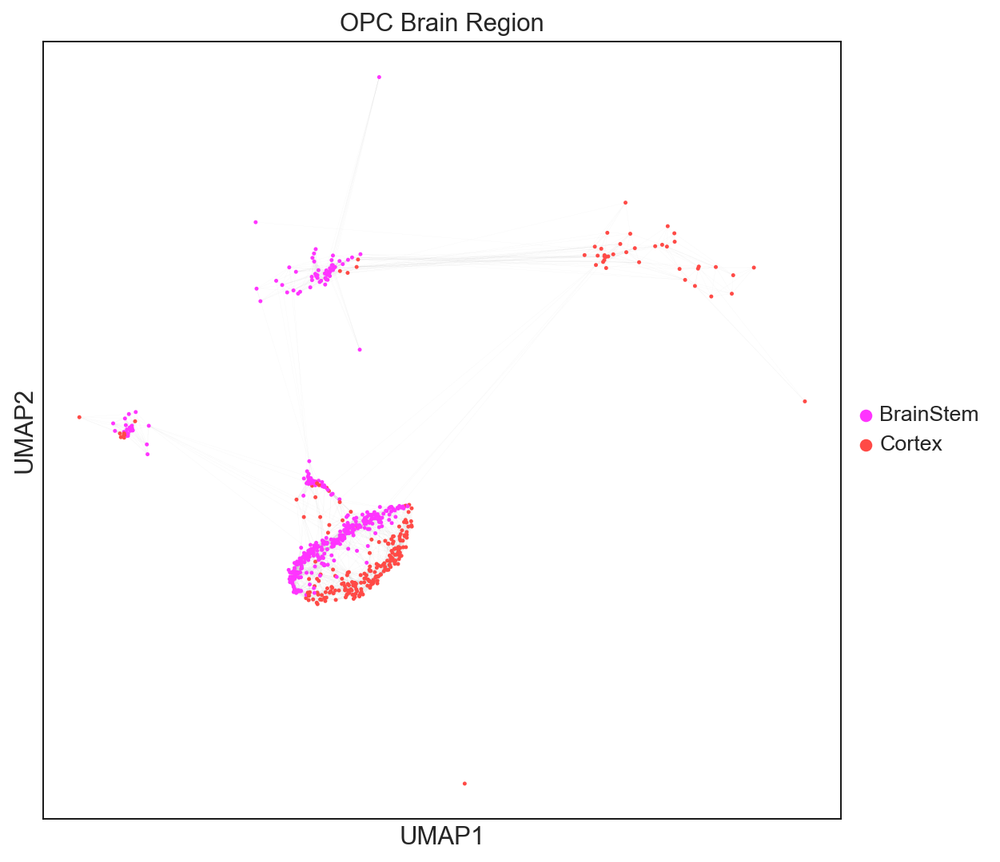

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


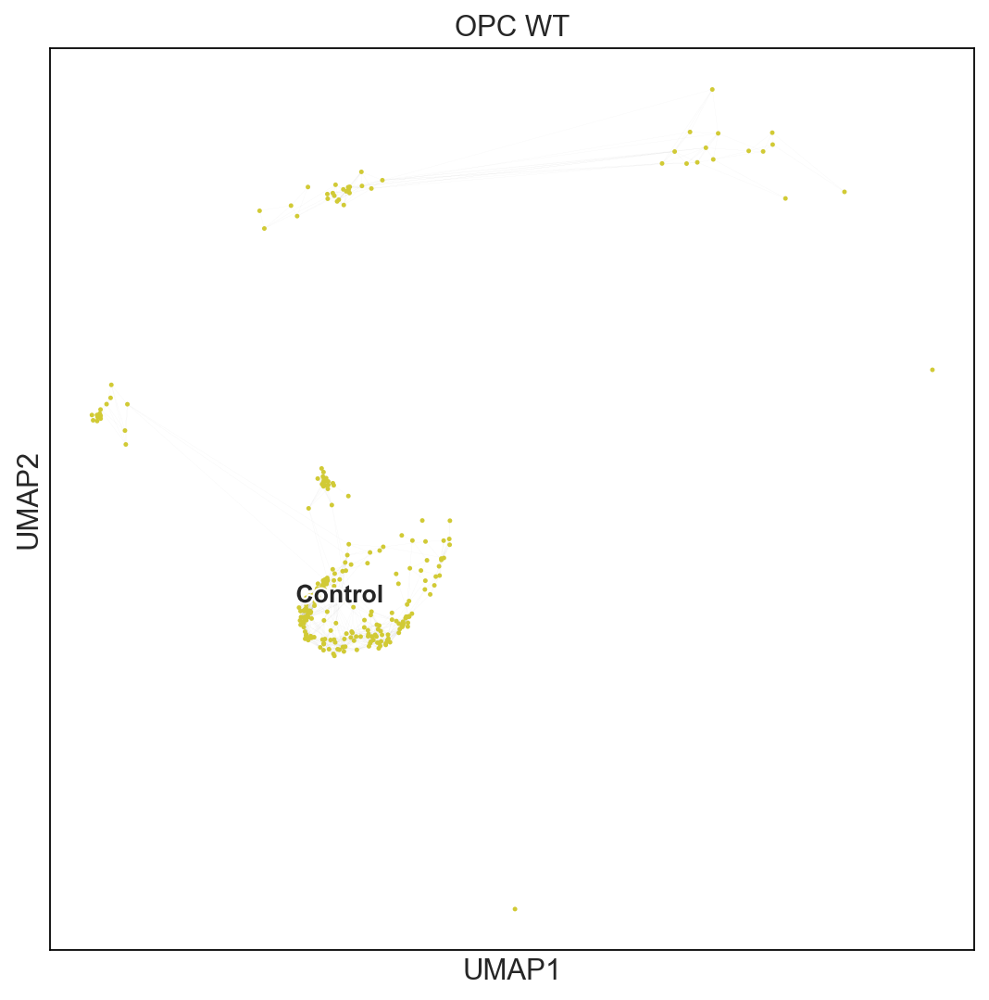

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


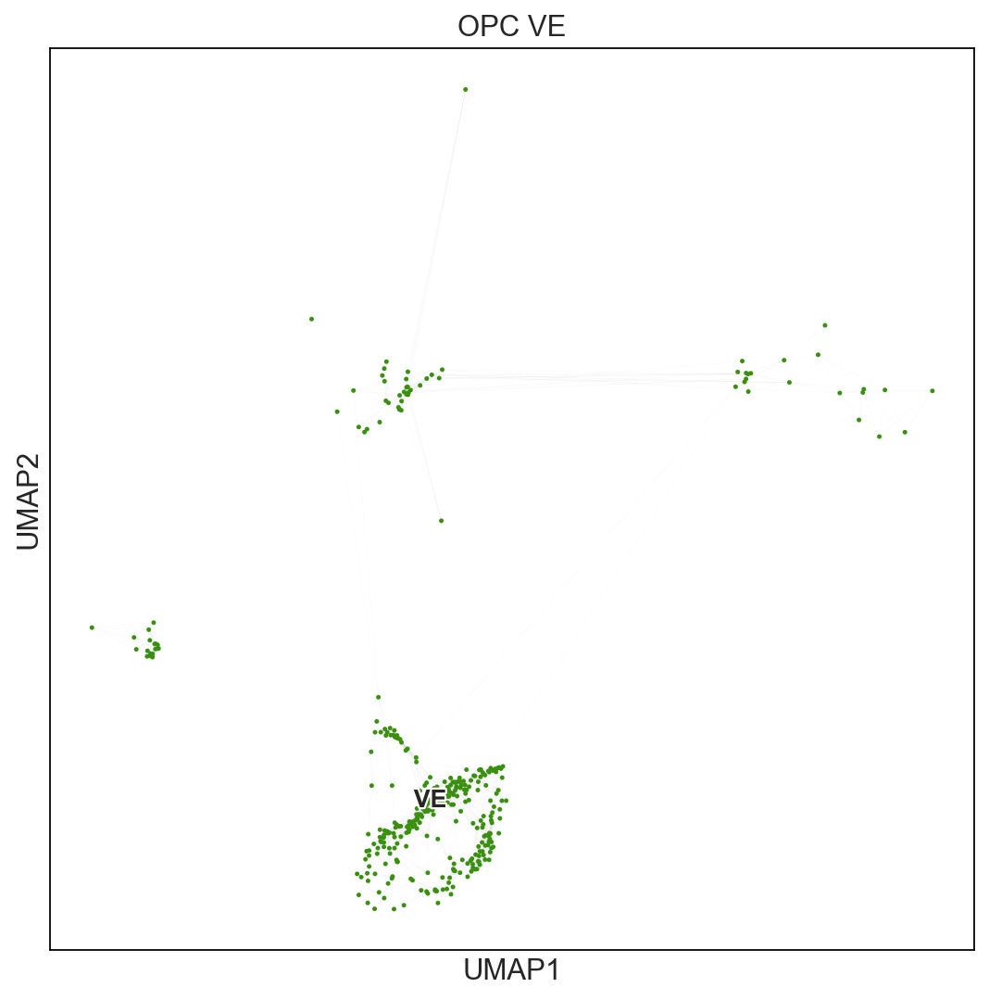

In [10]:
sc.set_figure_params(figsize=(8, 8))
adata_opc_VE = adata_opc.copy()
adata_opc_VE = adata_opc_VE[adata_opc_VE.obs.Condition == 'VE']

adata_opc_WT = adata_opc.copy()
adata_opc_WT = adata_opc_WT[adata_opc_WT.obs.Condition != 'VE']

sc.pl.umap(adata_final, 
           color= ['final_subclusters'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["All samples"])

sc.pl.umap(adata_opc, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,#['#0E8CB8', '#E52DC4'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["OPC Sample ID"])

sc.pl.umap(adata_opc, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["OPC Condition"])

sc.pl.umap(adata_opc, 
           color= ['B_region'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#FF34FF", "#FF4A46"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["OPC Brain Region"])

sc.pl.umap(adata_opc_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["OPC WT"])

sc.pl.umap(adata_opc_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["OPC VE"])

### Cortex

In [41]:
adata_opc_cortex = adata_opc.copy()
adata_opc_cortex = adata_opc_cortex[adata_opc_cortex.obs['B_region'].isin(['Cortex']),:]
adata_opc_cortex.shape

(252, 18947)

In [12]:
adata_opc_cortex.obs.Condition.value_counts()

Control    137
VE         115
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


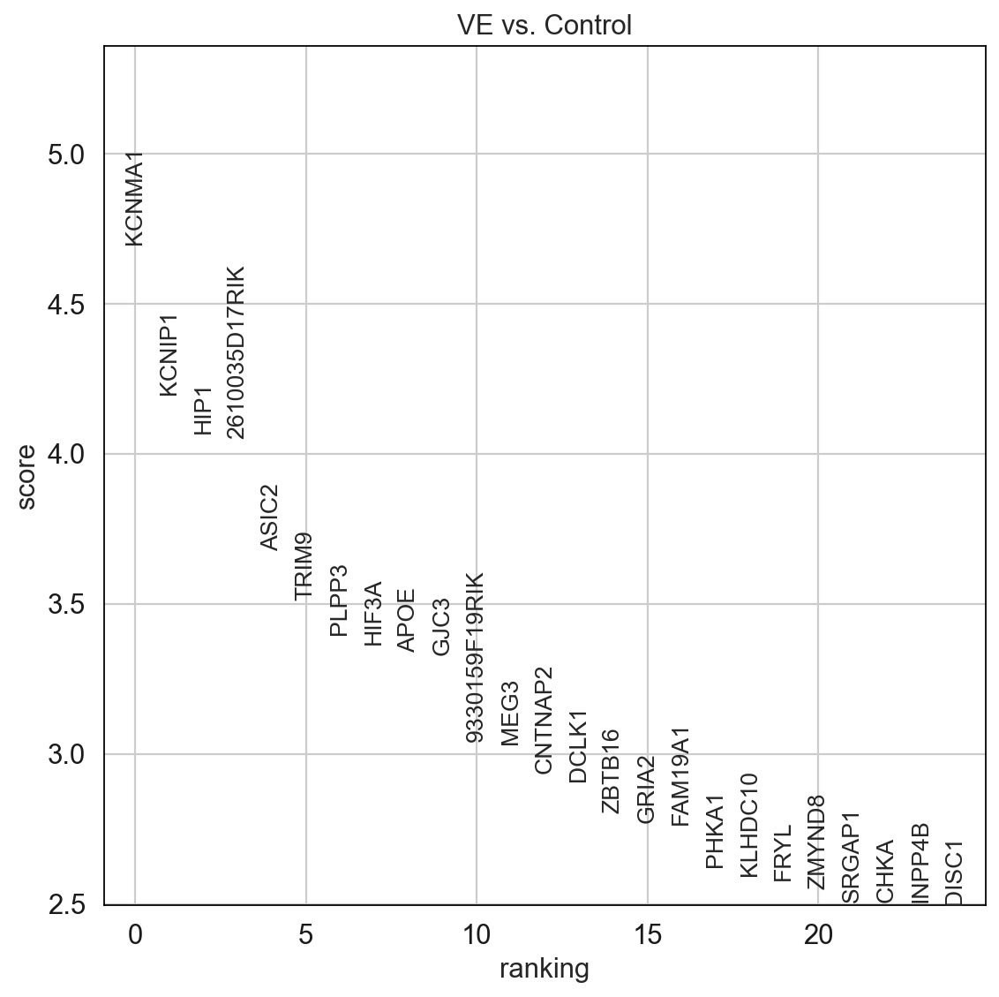

In [13]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'OPC_CORT_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_opc_cortex, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_opc_cortex, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_opc_cortex.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

### BrainStem

In [43]:
adata_opc_BS = adata_opc.copy()
adata_opc_BS = adata_opc_BS[adata_opc_BS.obs['B_region'].isin(['BrainStem']),:]
adata_opc_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


(370, 18947)

In [15]:
adata_opc_BS.obs.Condition.value_counts()

VE         240
Control    130
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


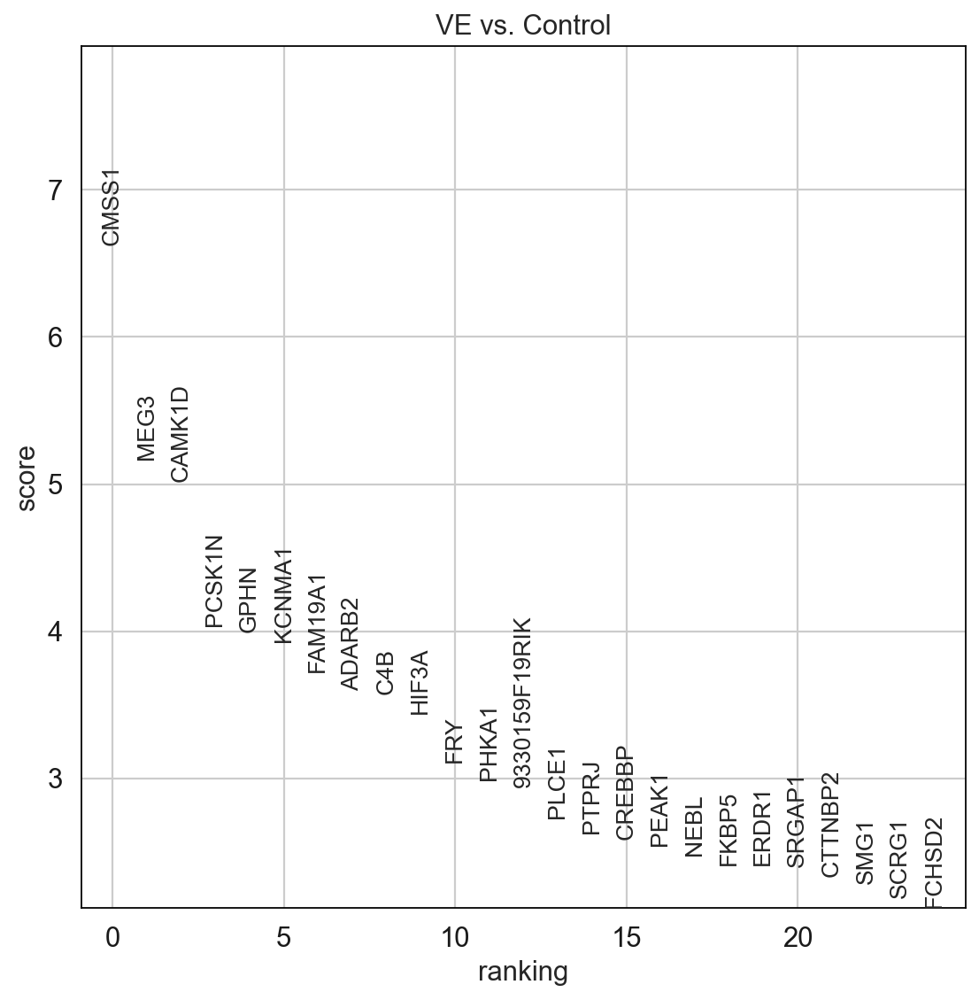

In [16]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'OPC_BS_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_opc_BS, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_opc_BS, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_opc_BS.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

## Excitatory Neurons

In [60]:
adata_exc = deepcopy(adata_final)
adata_exc = adata_exc[adata_exc.obs['final_subclusters'].isin(['Excitatory_neurons']),:]
adata_exc.shape

/Users/fragkogs/opt/anaconda3/envs/braf_env/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(7712, 18947)

In [61]:
adata_exc.obs.Condition.value_counts()

VE         4688
Control    3024
Name: Condition, dtype: int64

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


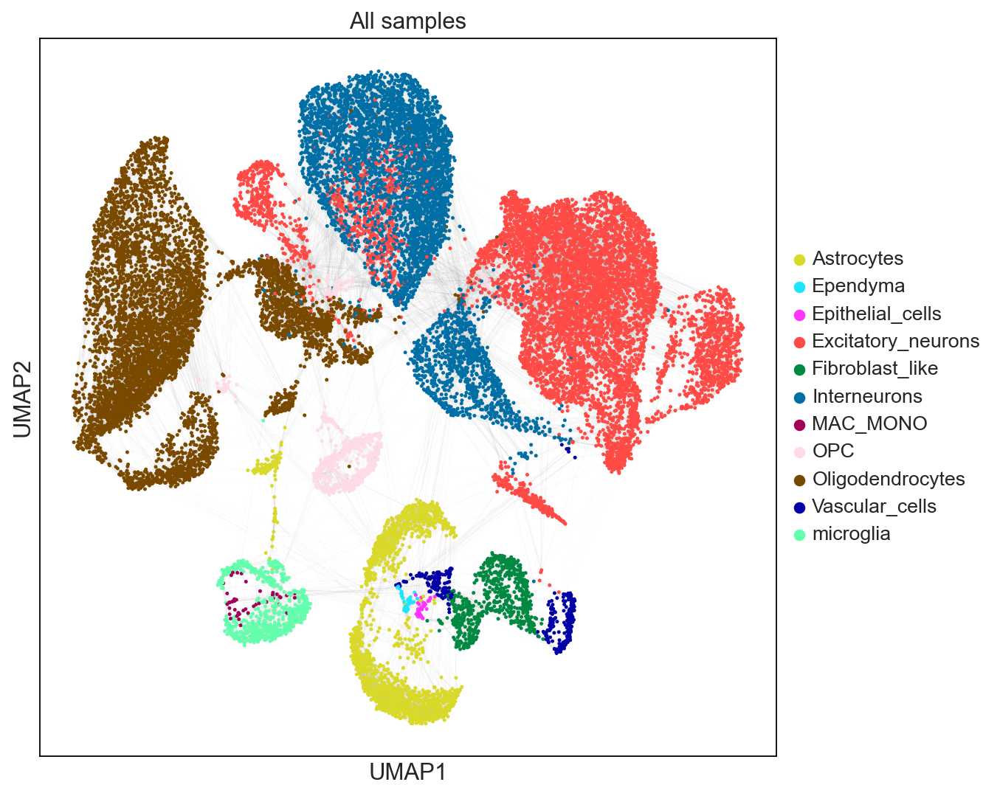

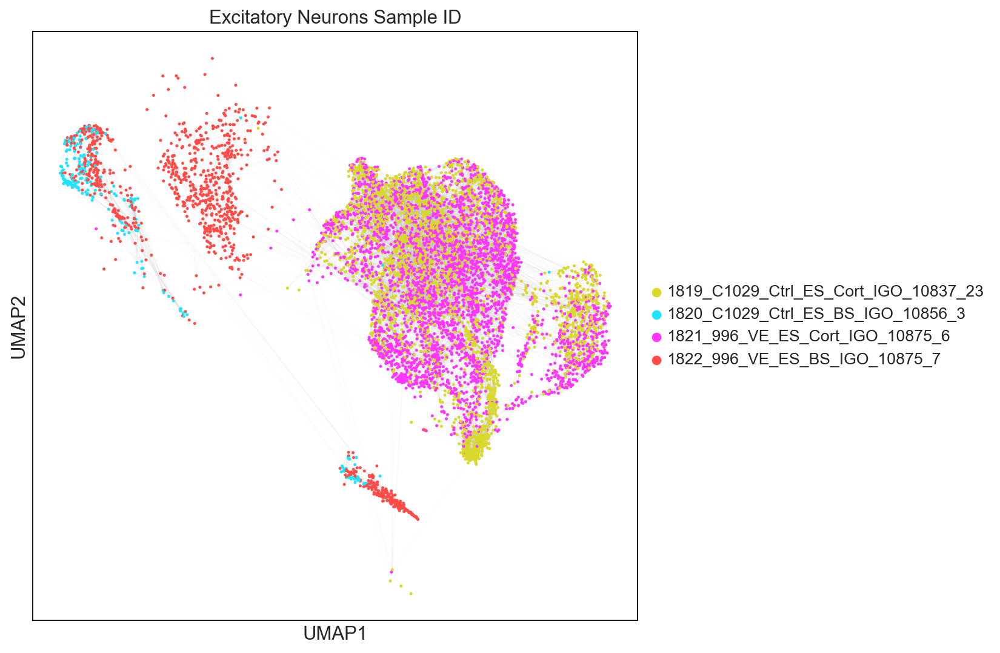

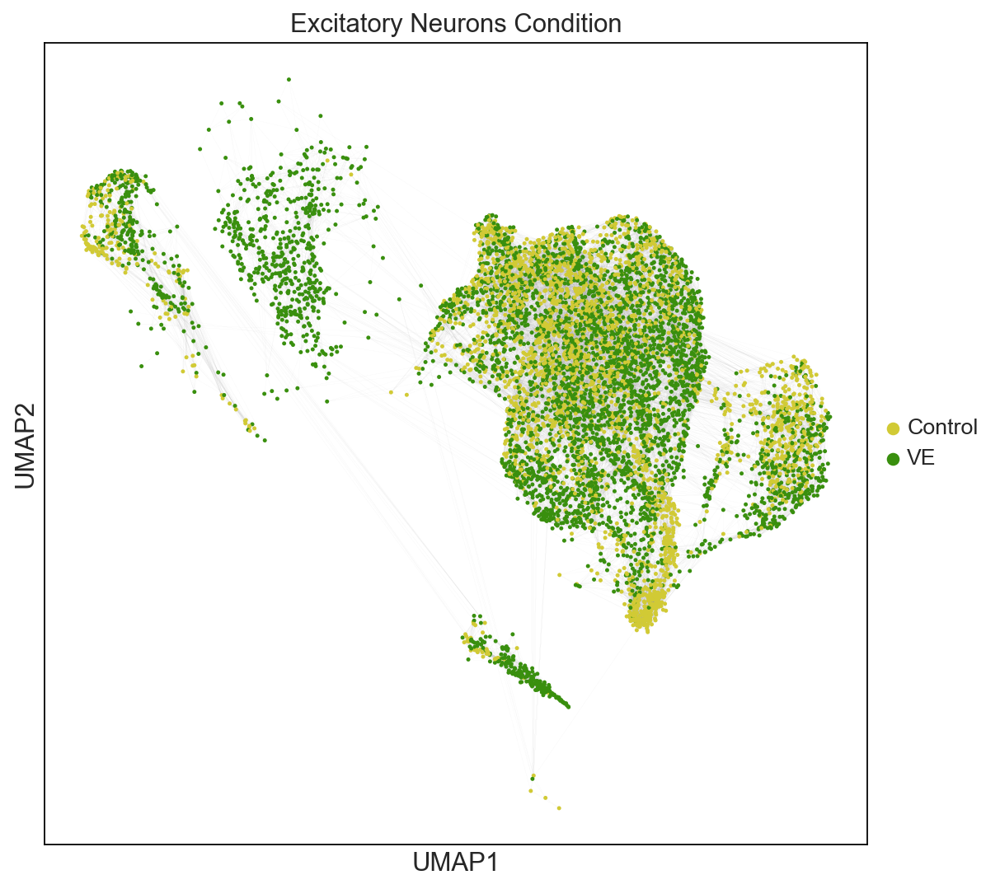

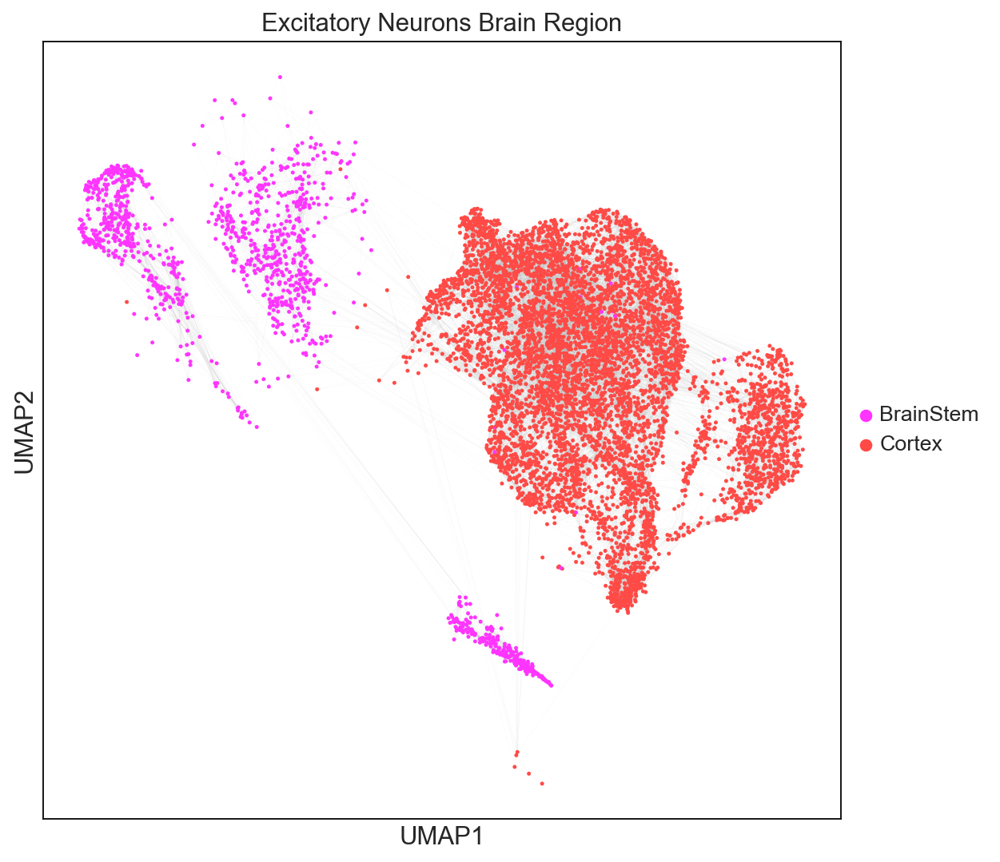

Trying to set attribute `.uns` of view, copying.


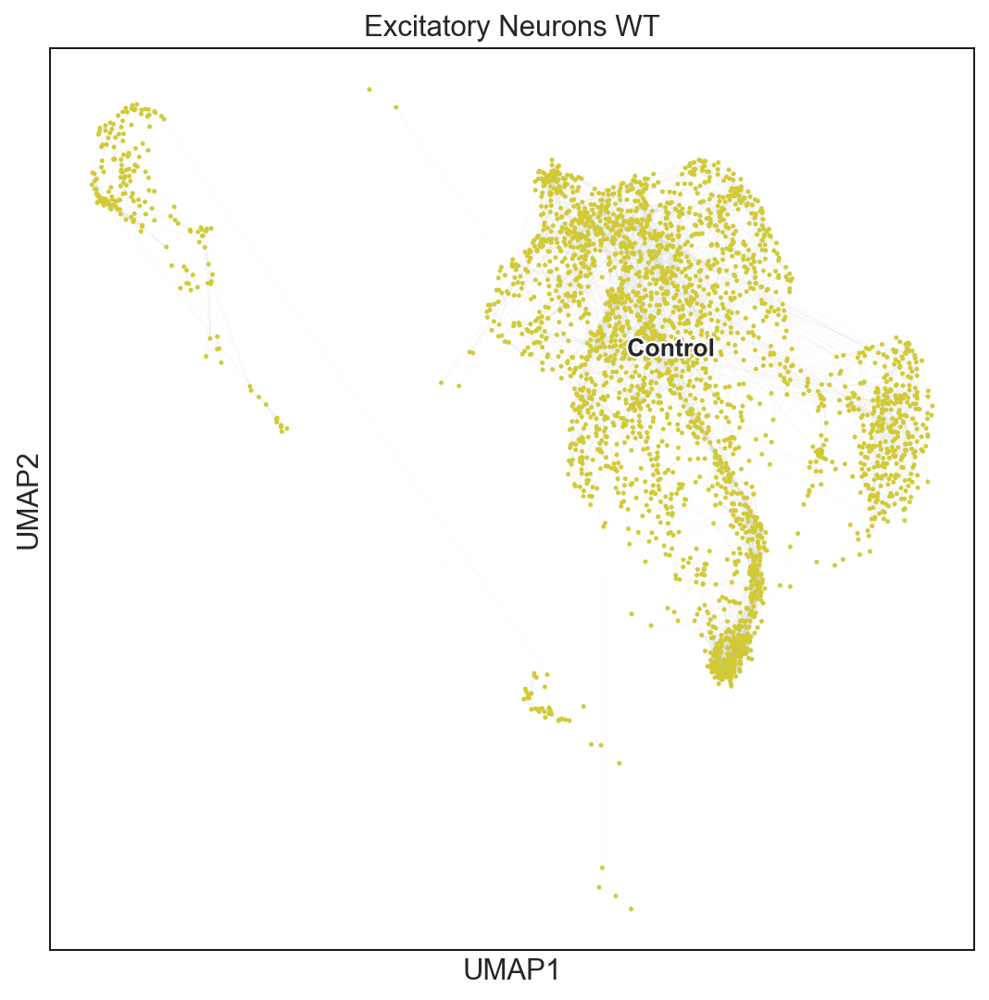

Trying to set attribute `.uns` of view, copying.


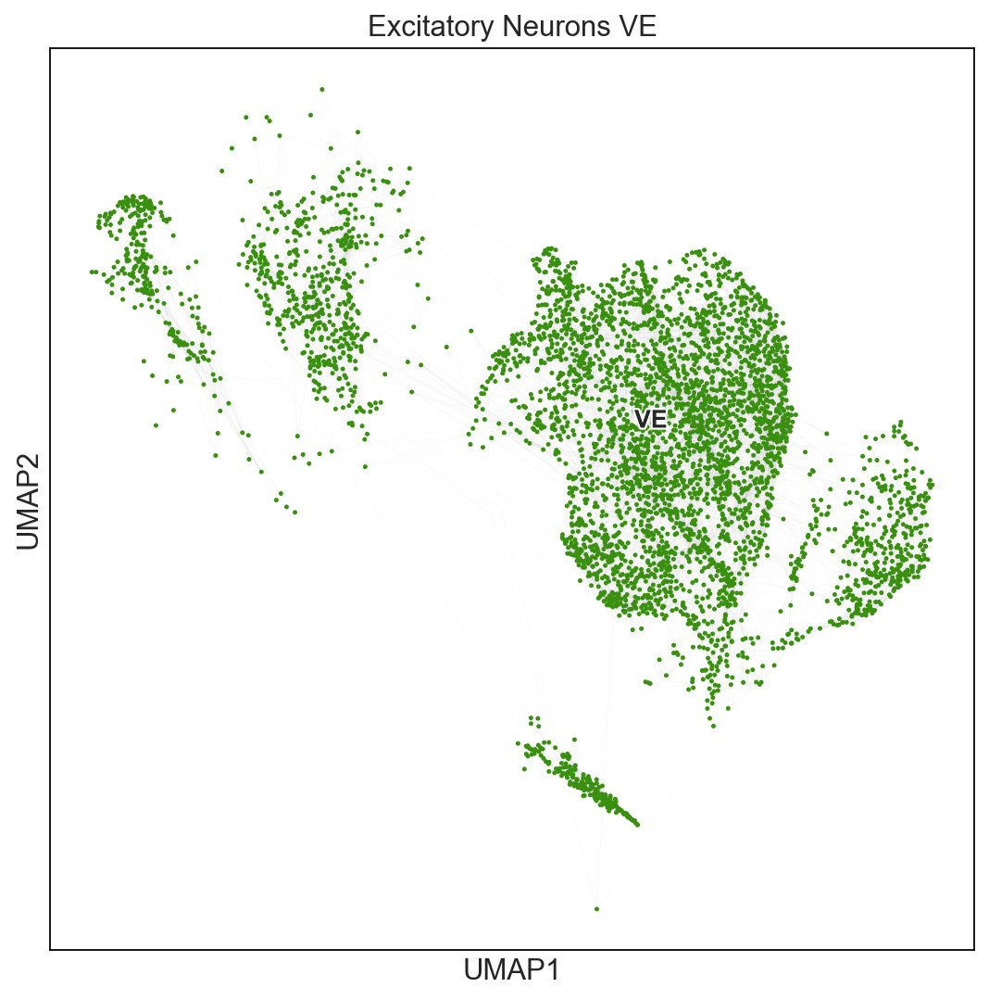

In [11]:
sc.set_figure_params(figsize=(8, 8))
adata_exc_VE = adata_exc.copy()
adata_exc_VE = adata_exc_VE[adata_exc_VE.obs.Condition == 'VE']

adata_exc_WT = adata_exc.copy()
adata_exc_WT = adata_exc_WT[adata_exc_WT.obs.Condition != 'VE']


sc.pl.umap(adata_final, 
           color= ['final_subclusters'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["All samples"])

sc.pl.umap(adata_exc, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,#['#0E8CB8', '#E52DC4'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Excitatory Neurons Sample ID"])

sc.pl.umap(adata_exc, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Excitatory Neurons Condition"])

sc.pl.umap(adata_exc, 
           color= ['B_region'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#FF34FF", "#FF4A46"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Excitatory Neurons Brain Region"])

sc.pl.umap(adata_exc_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Excitatory Neurons WT"])

sc.pl.umap(adata_exc_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Excitatory Neurons VE"])


### Cortex

In [11]:
adata_exc_cortex = adata_exc.copy()
adata_exc_cortex = adata_exc_cortex[adata_exc_cortex.obs['B_region'].isin(['Cortex']),:]
adata_exc_cortex.shape

(6455, 18947)

In [12]:
adata_exc_cortex.obs.Condition.value_counts()

VE         3656
Control    2799
Name: Condition, dtype: int64

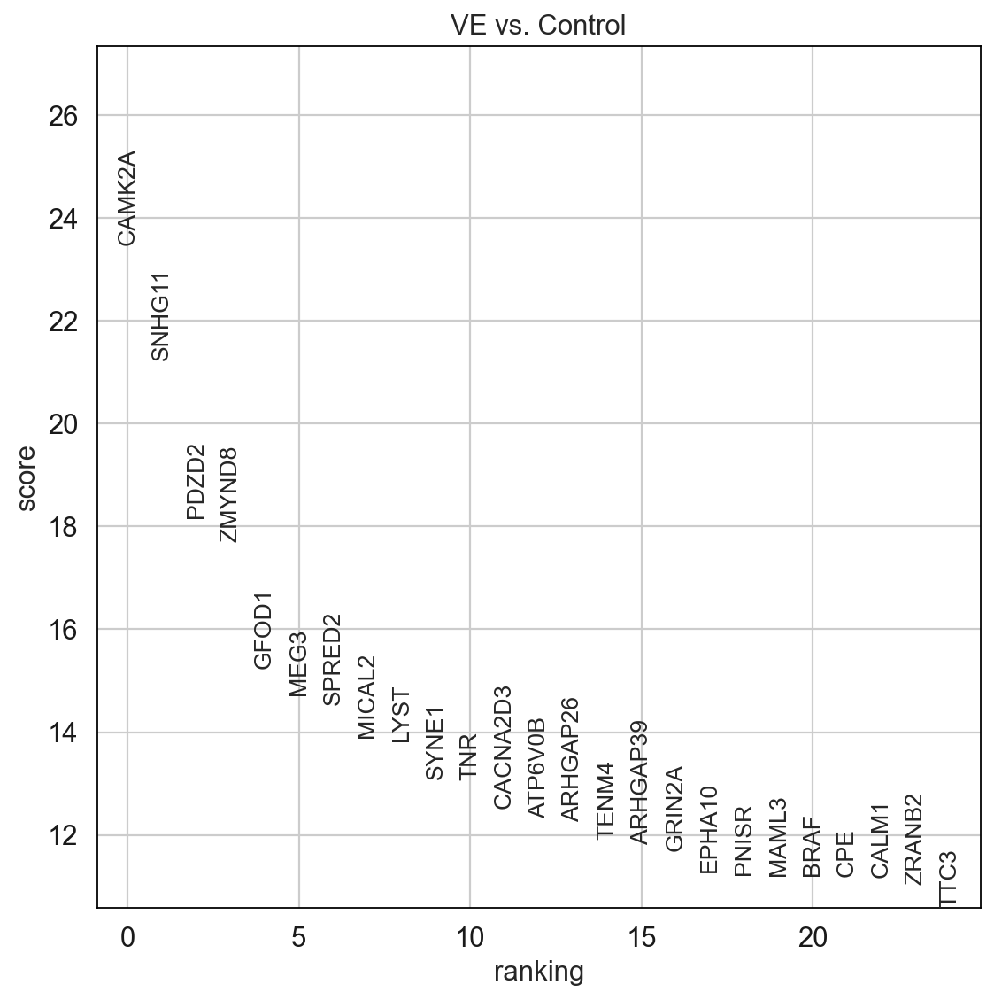

In [29]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Excitatory_CORT_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_exc_cortex, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_exc_cortex, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_exc_cortex.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

### Brainstem

In [27]:
adata_exc_BS = adata_exc.copy()
adata_exc_BS = adata_exc_BS[adata_exc_BS.obs['B_region'].isin(['BrainStem']),:]
adata_exc_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


(1257, 18947)

In [33]:
adata_exc_BS.obs.Condition.value_counts()

VE         1032
Control     225
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


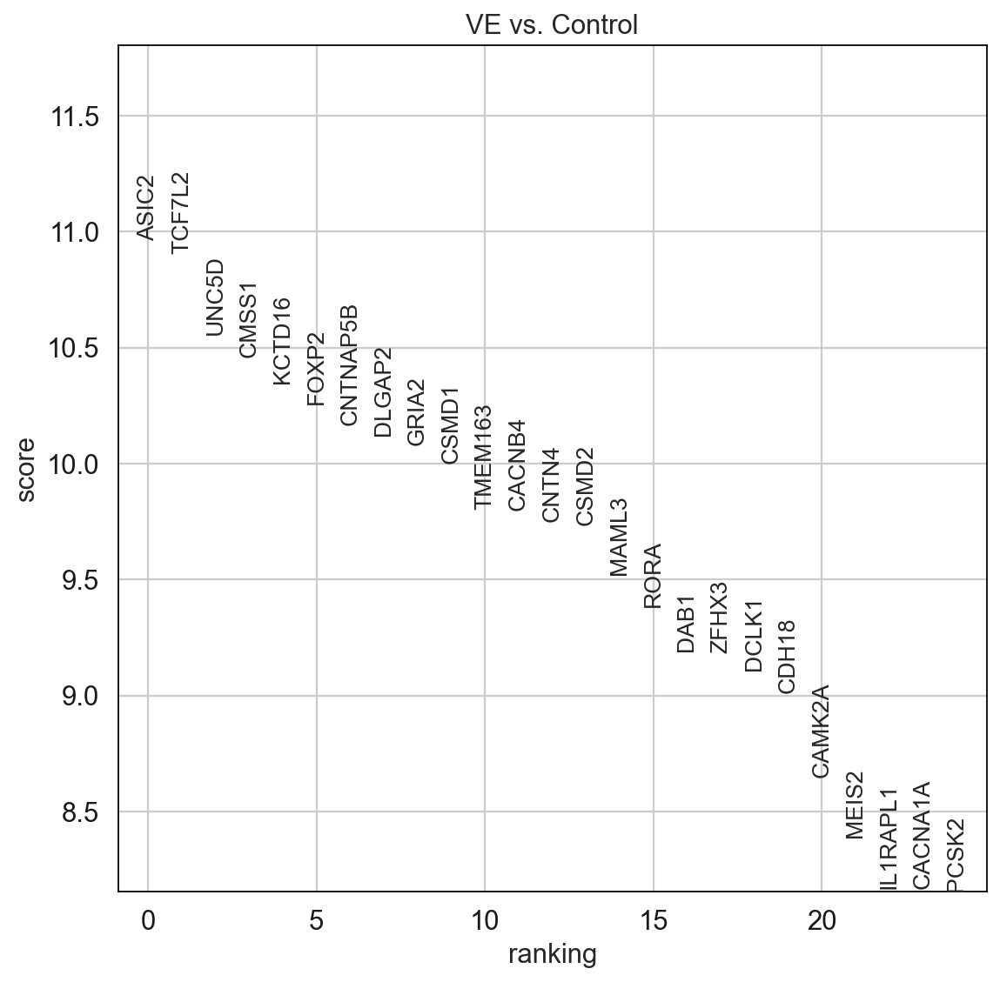

In [34]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Excitatory_BS_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_exc_BS, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_exc_BS, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_exc_BS.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

## Interneurons

In [62]:
adata_inter = deepcopy(adata_final)
adata_inter = adata_inter[adata_inter.obs['final_subclusters'].isin(['Interneurons']),:]
adata_inter.shape

(5034, 18947)

In [63]:
adata_inter.obs.Condition.value_counts()

VE         2922
Control    2112
Name: Condition, dtype: int64

/Users/fragkogs/opt/anaconda3/envs/braf_env/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


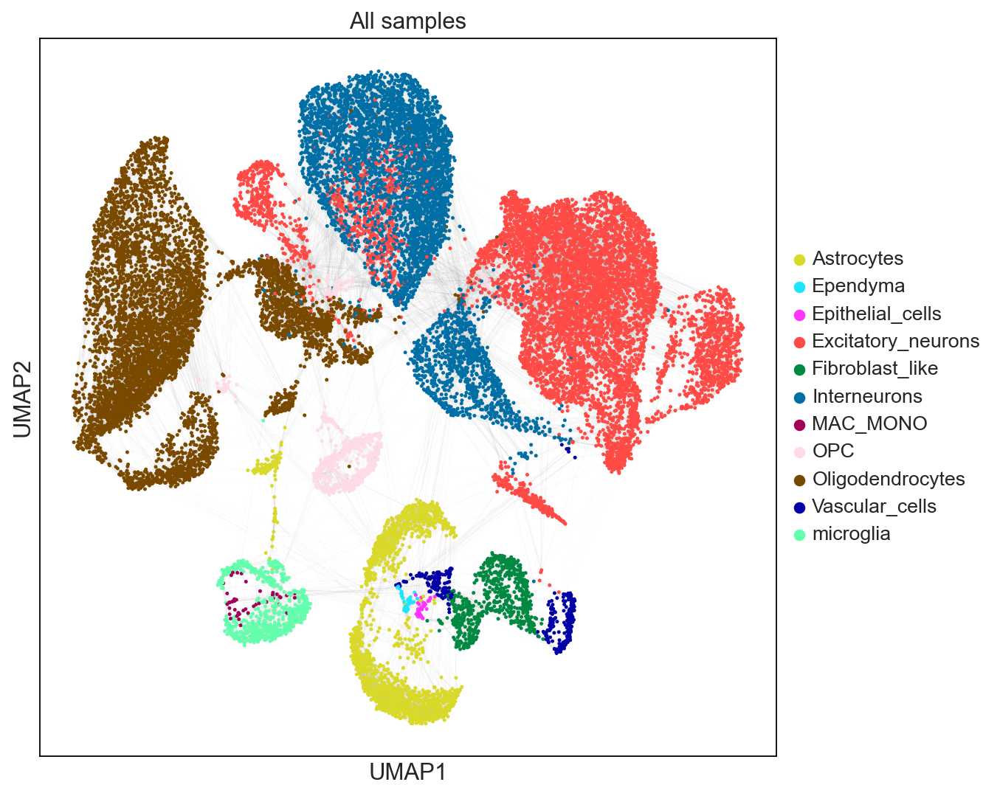

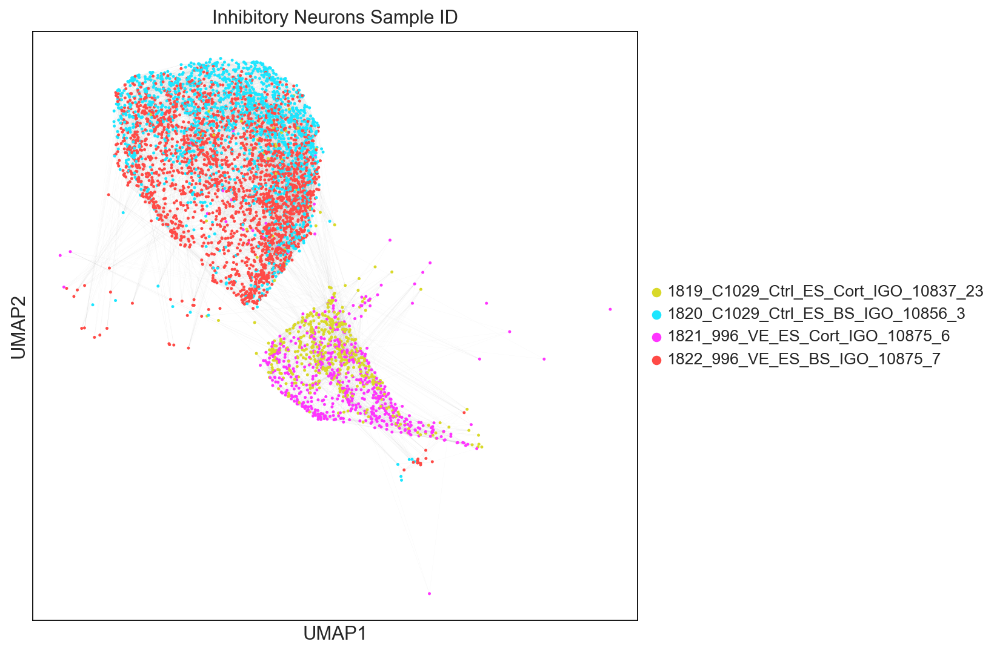

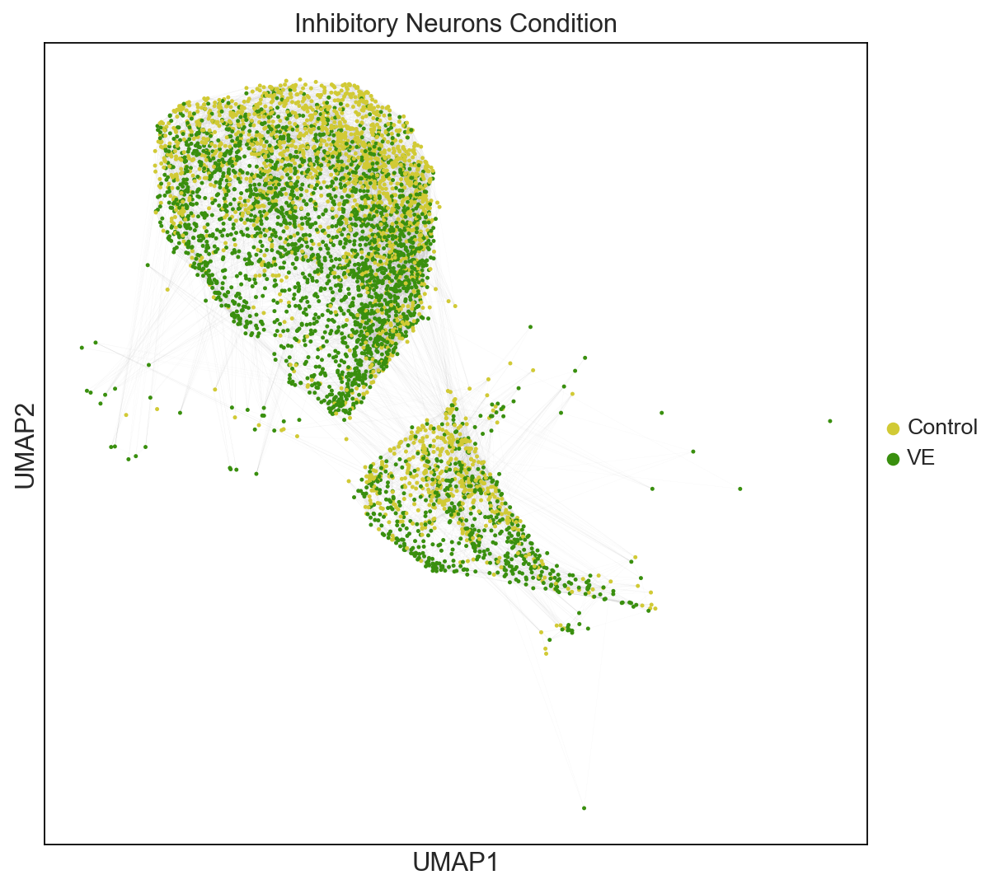

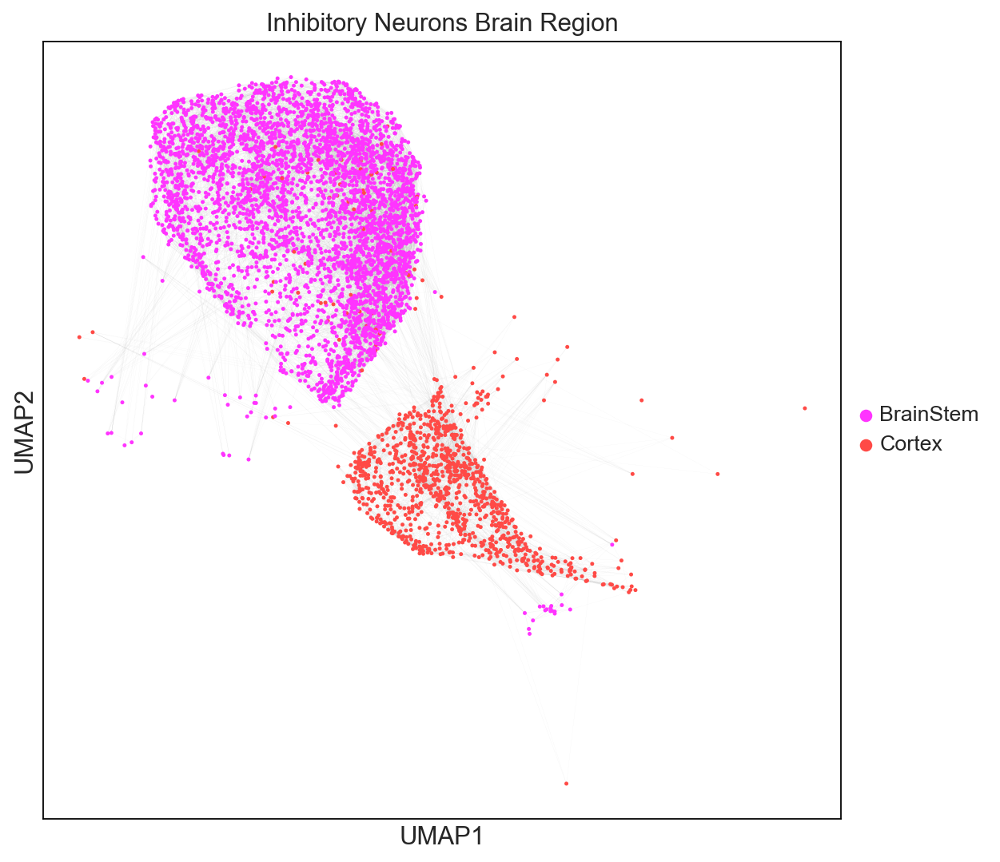

Trying to set attribute `.uns` of view, copying.


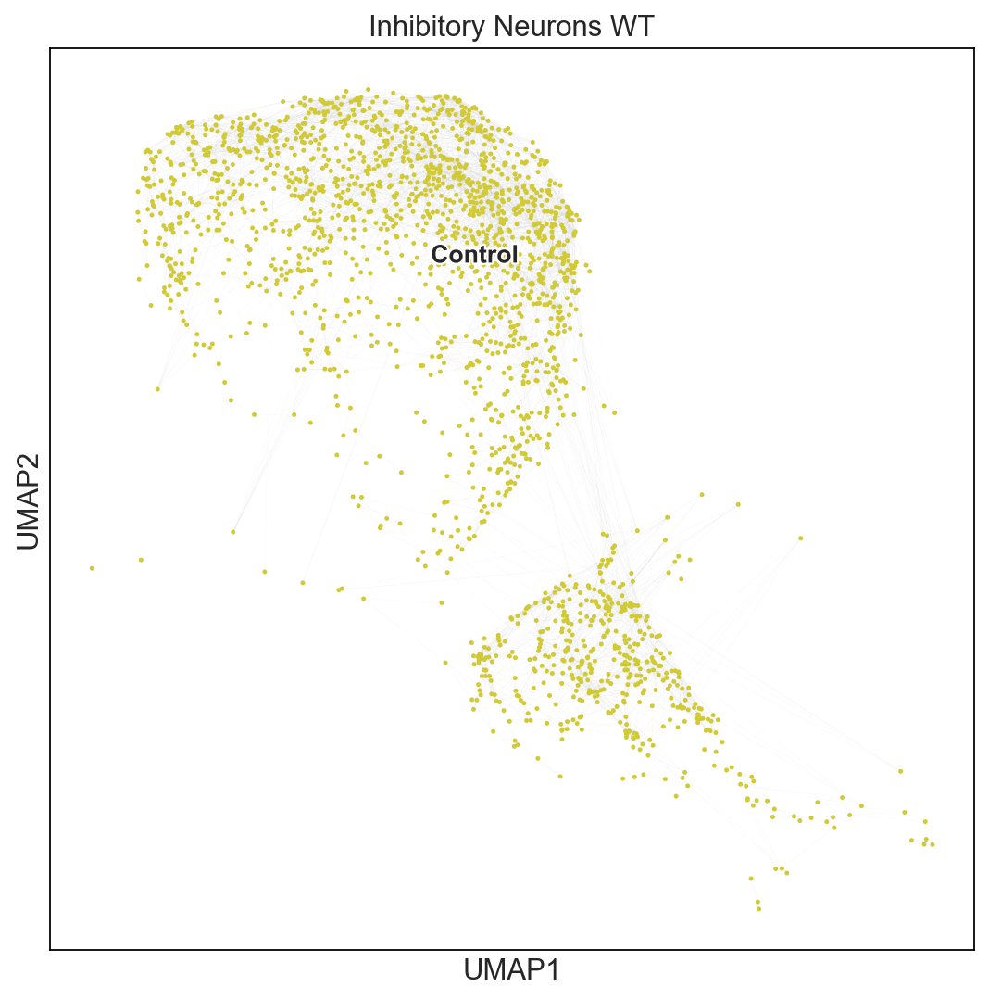

Trying to set attribute `.uns` of view, copying.


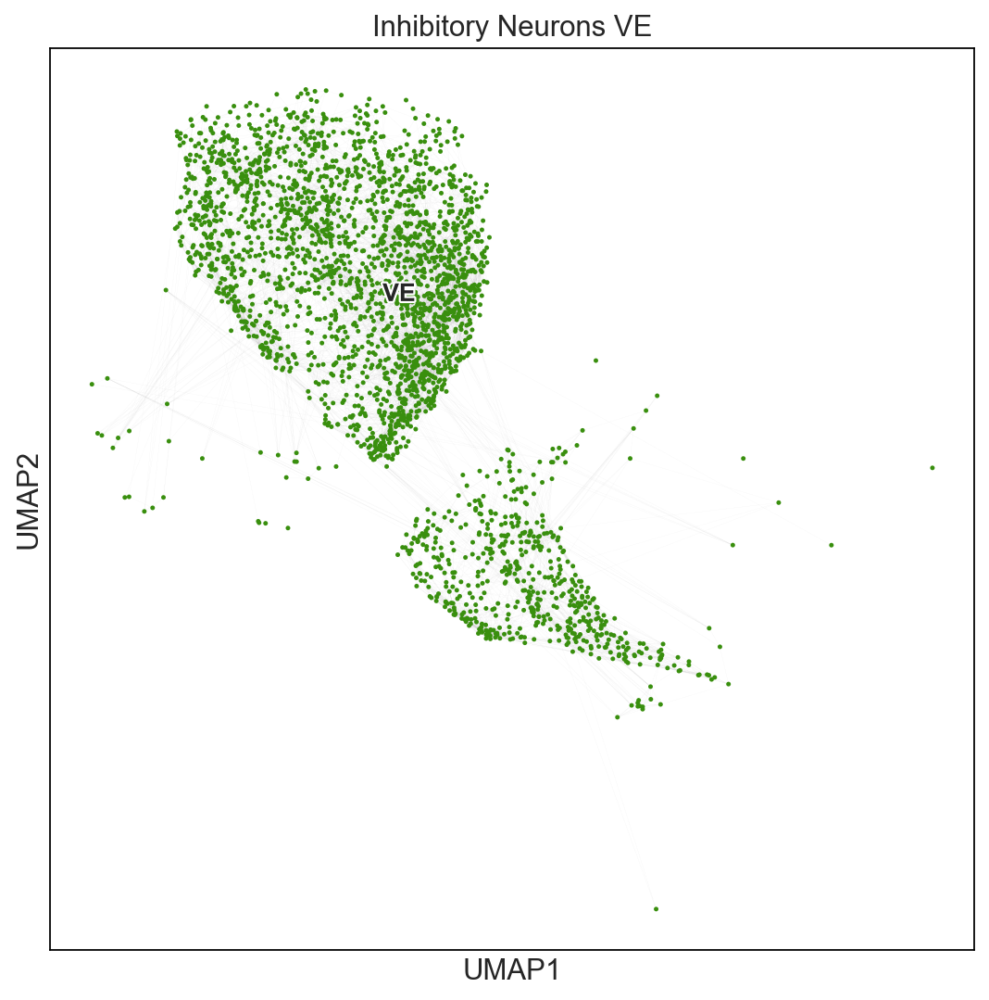

In [20]:
sc.set_figure_params(figsize=(8, 8))
adata_inter_VE = adata_inter.copy()
adata_inter_VE = adata_inter_VE[adata_inter_VE.obs.Condition == 'VE']

adata_inter_WT = adata_inter.copy()
adata_inter_WT = adata_inter_WT[adata_inter_WT.obs.Condition != 'VE']


sc.pl.umap(adata_final, 
           color= ['final_subclusters'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["All samples"])


sc.pl.umap(adata_inter, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= godsnot_64,#['#0E8CB8', '#E52DC4'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Inhibitory Neurons Sample ID"])

sc.pl.umap(adata_inter, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35','#398F0E'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Inhibitory Neurons Condition"])

sc.pl.umap(adata_inter, 
           color= ['B_region'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#FF34FF", "#FF4A46"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Inhibitory Neurons Brain Region"])

sc.pl.umap(adata_inter_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Inhibitory Neurons WT"])

sc.pl.umap(adata_inter_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Inhibitory Neurons VE"])


### Cortex

In [23]:
adata_inter_cortex = adata_inter.copy()
adata_inter_cortex = adata_inter_cortex[adata_inter_cortex.obs['B_region'].isin(['Cortex']),:]
adata_inter_cortex.shape

(1114, 18947)

In [24]:
adata_inter_cortex.obs.Condition.value_counts()

VE         594
Control    520
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


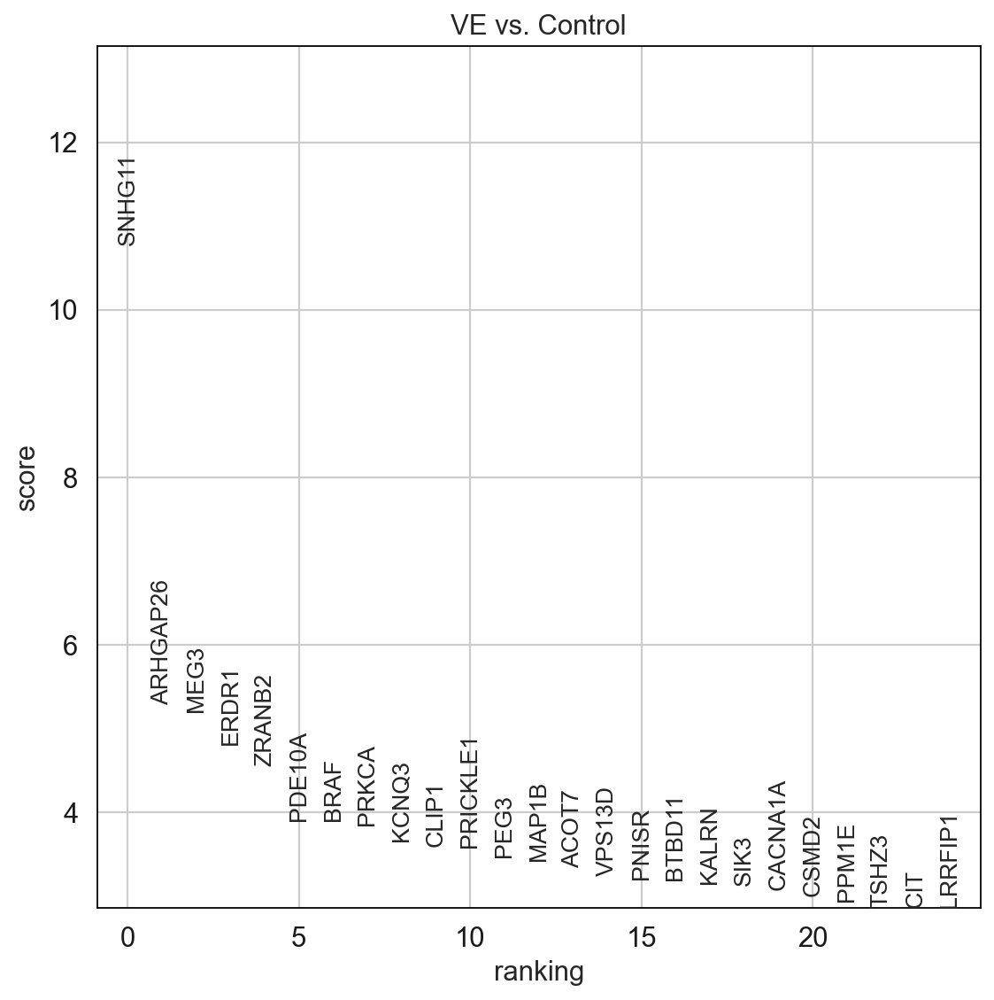

In [40]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Inhibitory_CORT_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_inter_cortex, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_inter_cortex, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_inter_cortex.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

### Brainstem

In [28]:
adata_inter_BS = adata_inter.copy()
adata_inter_BS = adata_inter_BS[adata_inter_BS.obs['B_region'].isin(['BrainStem']),:]
adata_inter_BS.shape

(3920, 18947)

In [42]:
adata_inter_BS.obs.Condition.value_counts()

VE         2328
Control    1592
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


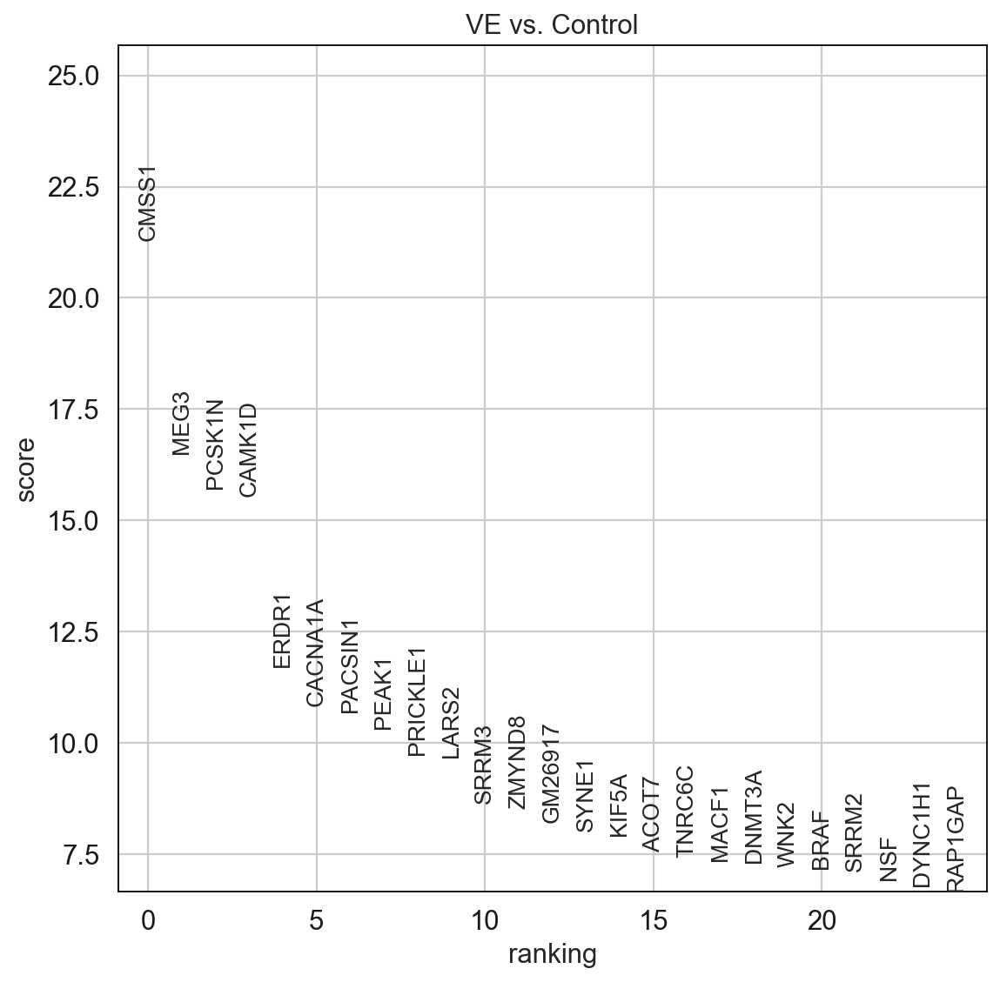

In [43]:
sc.set_figure_params(figsize=(8, 8))
n_genes = 1000
method = 'wilcoxon'
key_ad = 'Inhibitory_BS_ctr_vs_ve'
sc.tl.rank_genes_groups(adata = adata_inter_BS, groupby = 'Condition', key_added = key_ad, method = method, reference='Control')
sc.pl.rank_genes_groups(adata_inter_BS, key = key_ad, fontsize = 12, n_genes = 25)

result = adata_inter_BS.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
pval_table.to_excel(os.path.join(outdir, key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

## Fibroblasts

In [9]:
adata_fibro = deepcopy(adata_final)
adata_fibro = adata_fibro[adata_fibro.obs['final_subclusters'].isin(['Fibroblast_like']),:]
adata_fibro.shape

/Users/fragkogs/opt/anaconda3/envs/braf_env/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(710, 18947)

In [64]:
adata_fibro.obs.Condition.value_counts()

Control    423
VE         287
Name: Condition, dtype: int64

### Cortex

In [10]:
adata_fibro_cortex = adata_fibro.copy()
adata_fibro_cortex = adata_fibro_cortex[adata_fibro_cortex.obs['B_region'].isin(['Cortex']),:]
adata_fibro_cortex.shape

(487, 18947)

In [11]:
adata_fibro_cortex.obs.Condition.value_counts()

Control    352
VE         135
Name: Condition, dtype: int64

### Brainstem

In [12]:
adata_fibro_BS = adata_fibro.copy()
adata_fibro_BS = adata_fibro_BS[adata_fibro_BS.obs['B_region'].isin(['BrainStem']),:]
adata_fibro_BS.shape

(223, 18947)

In [13]:
adata_fibro_BS.obs.Condition.value_counts()

VE         152
Control     71
Name: Condition, dtype: int64

## Vascular cells

In [65]:
adata_vasc = deepcopy(adata_final)
adata_vasc = adata_vasc[adata_vasc.obs['final_subclusters'].isin(['Vascular_cells']),:]
adata_vasc.shape

/Users/fragkogs/opt/anaconda3/envs/braf_env/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(347, 18947)

In [66]:
adata_vasc.obs.Condition.value_counts()

Control    191
VE         156
Name: Condition, dtype: int64

### Cortex

In [15]:
adata_vasc_cortex = adata_vasc.copy()
adata_vasc_cortex = adata_vasc_cortex[adata_vasc_cortex.obs['B_region'].isin(['Cortex']),:]
adata_vasc_cortex.shape

(237, 18947)

In [16]:
adata_vasc_cortex.obs.Condition.value_counts()

Control    145
VE          92
Name: Condition, dtype: int64

### Brainstem

In [17]:
adata_vasc_BS = adata_vasc.copy()
adata_vasc_BS = adata_vasc_BS[adata_vasc_BS.obs['B_region'].isin(['BrainStem']),:]
adata_vasc_BS.shape

(110, 18947)

In [18]:
adata_vasc_BS.obs.Condition.value_counts()

VE         64
Control    46
Name: Condition, dtype: int64

## Epithelial cells

In [67]:
adata_epi = deepcopy(adata_final)
adata_epi = adata_epi[adata_epi.obs['final_subclusters'].isin(['Epithelial_cells']),:]
adata_epi.shape

(44, 18947)

In [68]:
adata_epi.obs.Condition.value_counts()

Control    32
VE         12
Name: Condition, dtype: int64

In [20]:
adata_epi_cortex = adata_epi.copy()
adata_epi_cortex = adata_epi_cortex[adata_epi_cortex.obs['B_region'].isin(['Cortex']),:]
adata_epi_cortex.shape

(0, 18947)

In [16]:
adata_epi_cortex.obs.Condition.value_counts()

Control    145
VE          92
Name: Condition, dtype: int64

### Brainstem

In [21]:
adata_epi_BS = adata_epi.copy()
adata_epi_BS = adata_epi_BS[adata_epi_BS.obs['B_region'].isin(['BrainStem']),:]
adata_epi_BS.shape

(44, 18947)

In [22]:
adata_epi_BS.obs.Condition.value_counts()

Control    32
VE         12
Name: Condition, dtype: int64

## Ependyma cells

In [69]:
adata_ependyma= deepcopy(adata_final)
adata_ependyma = adata_ependyma[adata_ependyma.obs['final_subclusters'].isin(['Ependyma']),:]
adata_ependyma.shape

(34, 18947)

In [70]:
adata_ependyma.obs.Condition.value_counts()

Control    31
VE          3
Name: Condition, dtype: int64

In [24]:
adata_ependyma_cortex = adata_ependyma.copy()
adata_ependyma_cortex = adata_ependyma_cortex[adata_ependyma_cortex.obs['B_region'].isin(['Cortex']),:]
adata_ependyma_cortex.shape

(12, 18947)

In [26]:
adata_ependyma_cortex.obs.Condition.value_counts()

Control    9
VE         3
Name: Condition, dtype: int64

### Brainstem

In [27]:
adata_ependyma_BS = adata_ependyma.copy()
adata_ependyma_BS = adata_ependyma_BS[adata_ependyma_BS.obs['B_region'].isin(['BrainStem']),:]
adata_ependyma_BS.shape

(22, 18947)

In [28]:
adata_ependyma_BS.obs.Condition.value_counts()

Control    22
Name: Condition, dtype: int64

## MAC/MONO

In [71]:
adata_macmono= deepcopy(adata_final)
adata_macmono = adata_macmono[adata_macmono.obs['final_subclusters'].isin(['MAC_MONO']),:]
adata_macmono.shape

(47, 18947)

In [72]:
adata_macmono.obs.Condition.value_counts()

VE         35
Control    12
Name: Condition, dtype: int64

In [46]:
adata_macmono_cortex = adata_macmono.copy()
adata_macmono_cortex = adata_macmono_cortex[adata_macmono_cortex.obs['B_region'].isin(['Cortex']),:]
adata_macmono_cortex.shape

(12, 18947)

In [50]:
adata_macmono_cortex.obs.Condition.value_counts()

VE         9
Control    3
Name: Condition, dtype: int64

### Brainstem

In [48]:
adata_macmono_BS = adata_macmono.copy()
adata_macmono_BS = adata_macmono_BS[adata_macmono_BS.obs['B_region'].isin(['BrainStem']),:]
adata_macmono_BS.shape

(35, 18947)

In [49]:
adata_macmono_BS.obs.Condition.value_counts()

VE         26
Control     9
Name: Condition, dtype: int64

## Random plots

### excitatory neurons cortex + brainstem

In [16]:
adata_exc_cortex_VE = adata_exc_cortex.copy()
adata_exc_cortex_VE = adata_exc_cortex_VE[adata_exc_cortex_VE.obs.Condition == 'VE']

adata_exc_cortex_WT = adata_exc_cortex.copy()
adata_exc_cortex_WT = adata_exc_cortex_WT[adata_exc_cortex_WT.obs.Condition != 'VE']

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_exc_cortex_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Excitatory Neurons WT"])

sc.pl.umap(adata_exc_cortex_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX -Excitatory Neurons VE"])

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


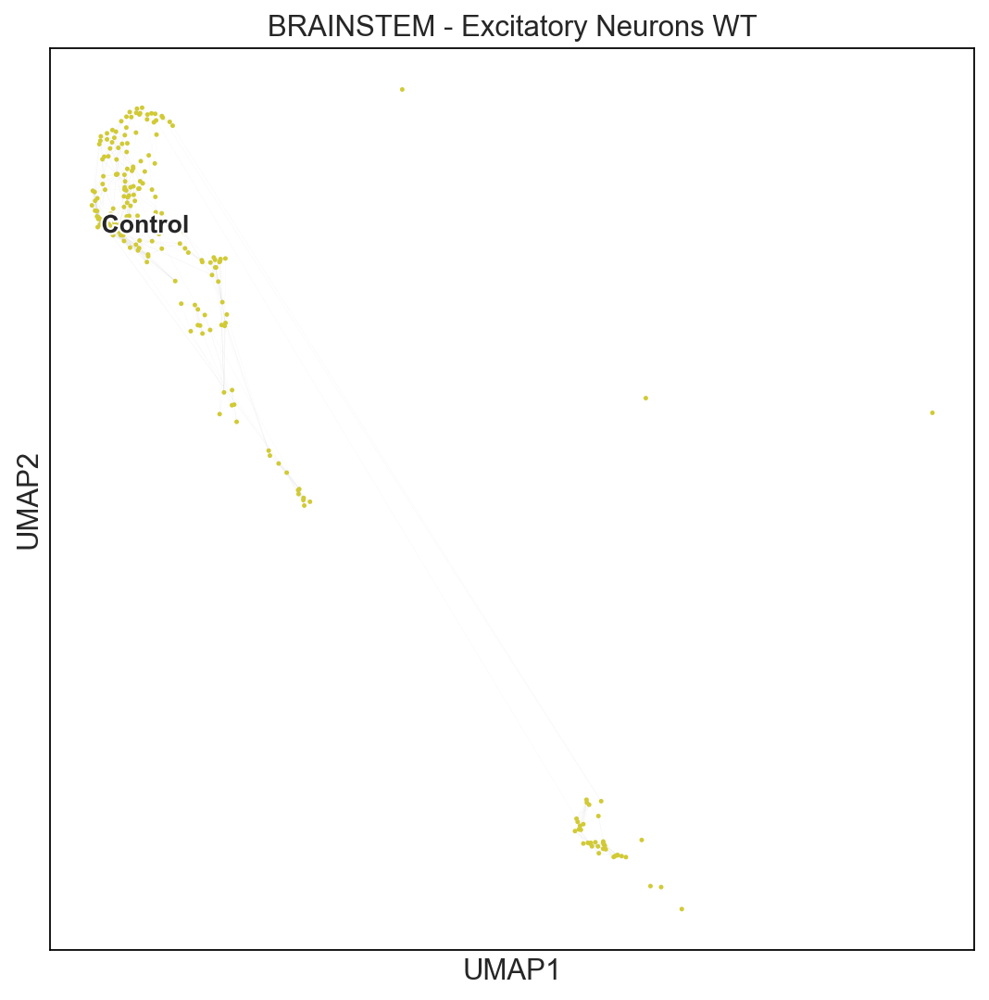

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


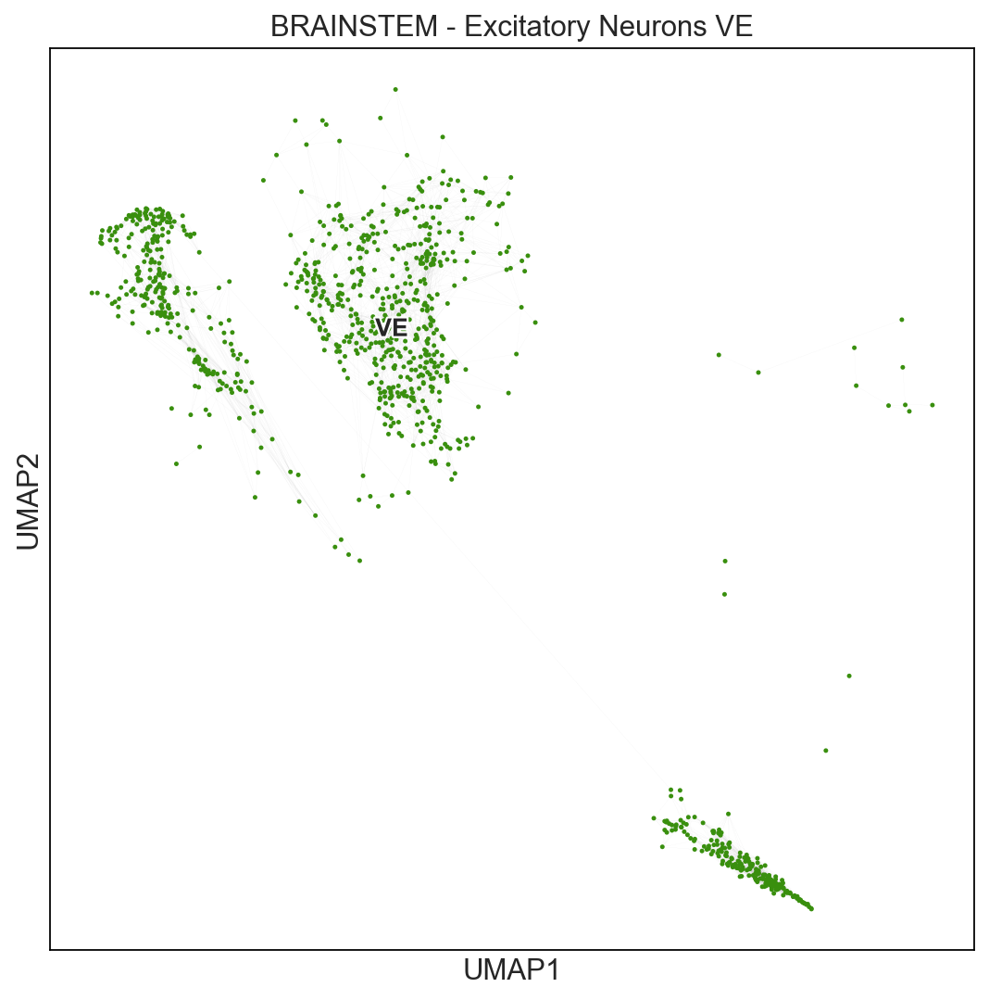

In [21]:
adata_exc_BS_VE = adata_exc_BS.copy()
adata_exc_BS_VE = adata_exc_BS_VE[adata_exc_BS_VE.obs.Condition == 'VE']

adata_exc_BS_WT = adata_exc_BS.copy()
adata_exc_BS_WT = adata_exc_BS_WT[adata_exc_BS_WT.obs.Condition != 'VE']

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_exc_BS_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM - Excitatory Neurons WT"])

sc.pl.umap(adata_exc_BS_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM - Excitatory Neurons VE"])

### Inhibitory neurons cortex + brainstem

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


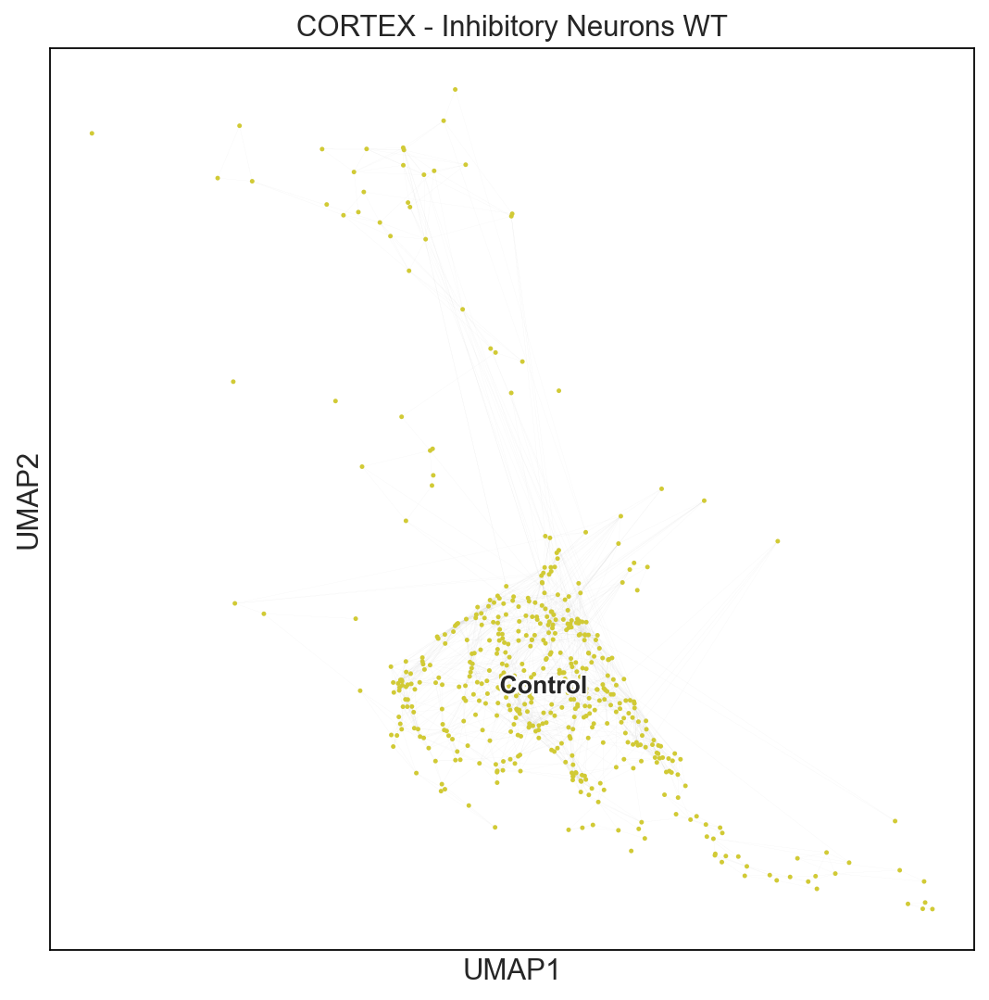

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


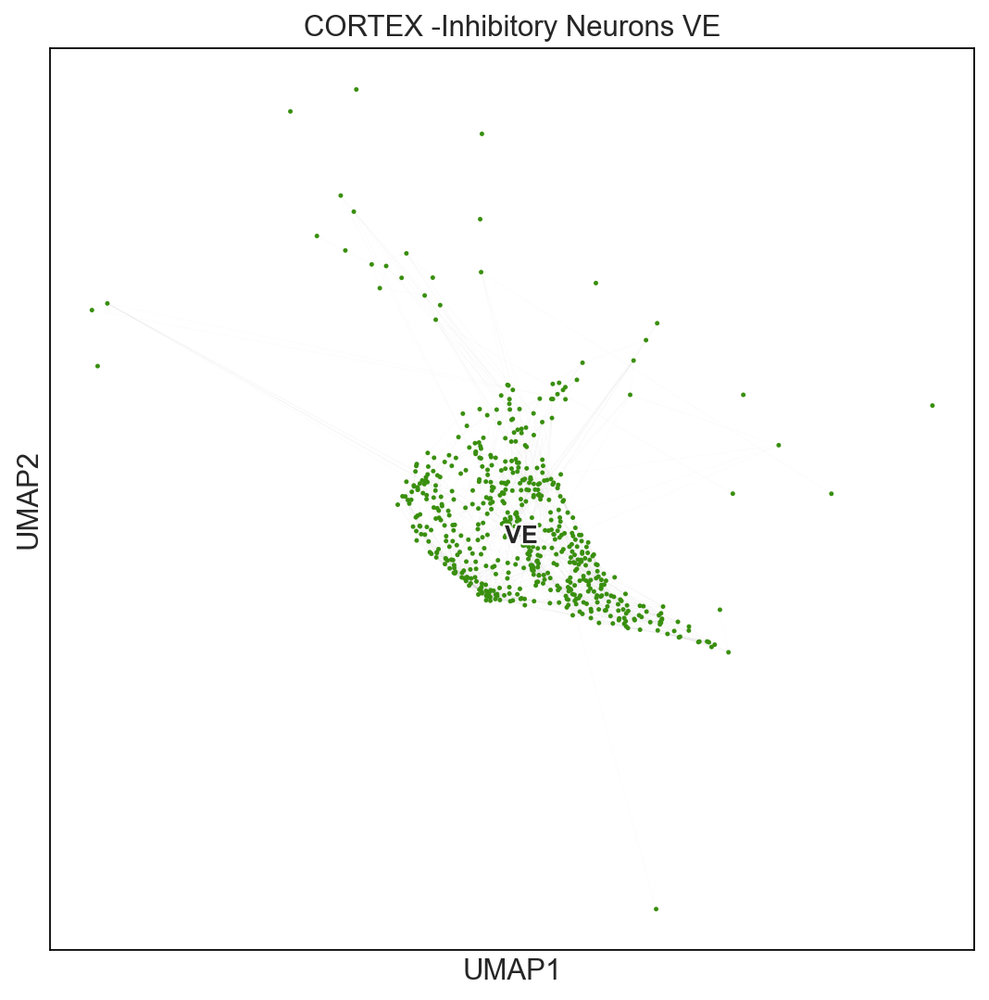

In [25]:
sc.set_figure_params(figsize=(8, 8))
adata_inter_cortex_VE = adata_inter_cortex.copy()
adata_inter_cortex_VE = adata_inter_cortex_VE[adata_inter_cortex_VE.obs.Condition == 'VE']

adata_inter_cortex_WT = adata_inter_cortex.copy()
adata_inter_cortex_WT = adata_inter_cortex_WT[adata_inter_cortex_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_inter_cortex_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Inhibitory Neurons WT"])

sc.pl.umap(adata_inter_cortex_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX -Inhibitory Neurons VE"])


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


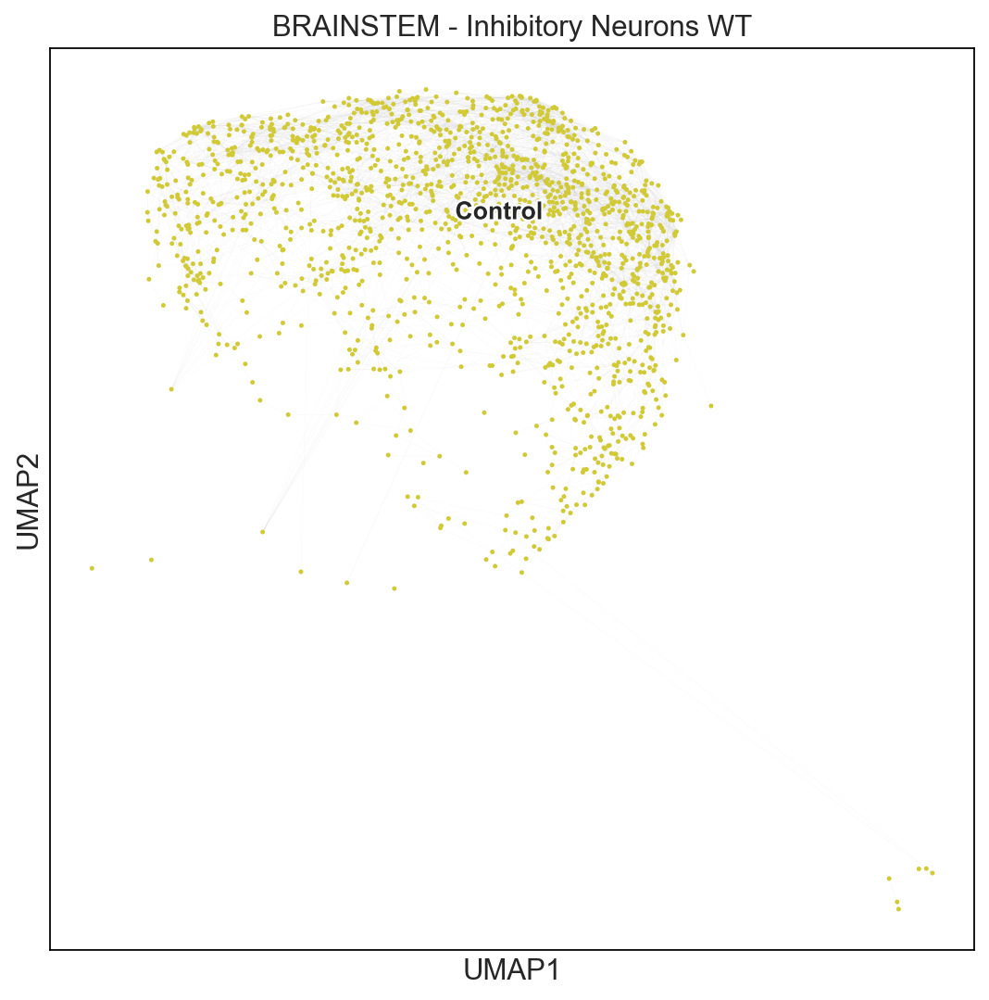

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


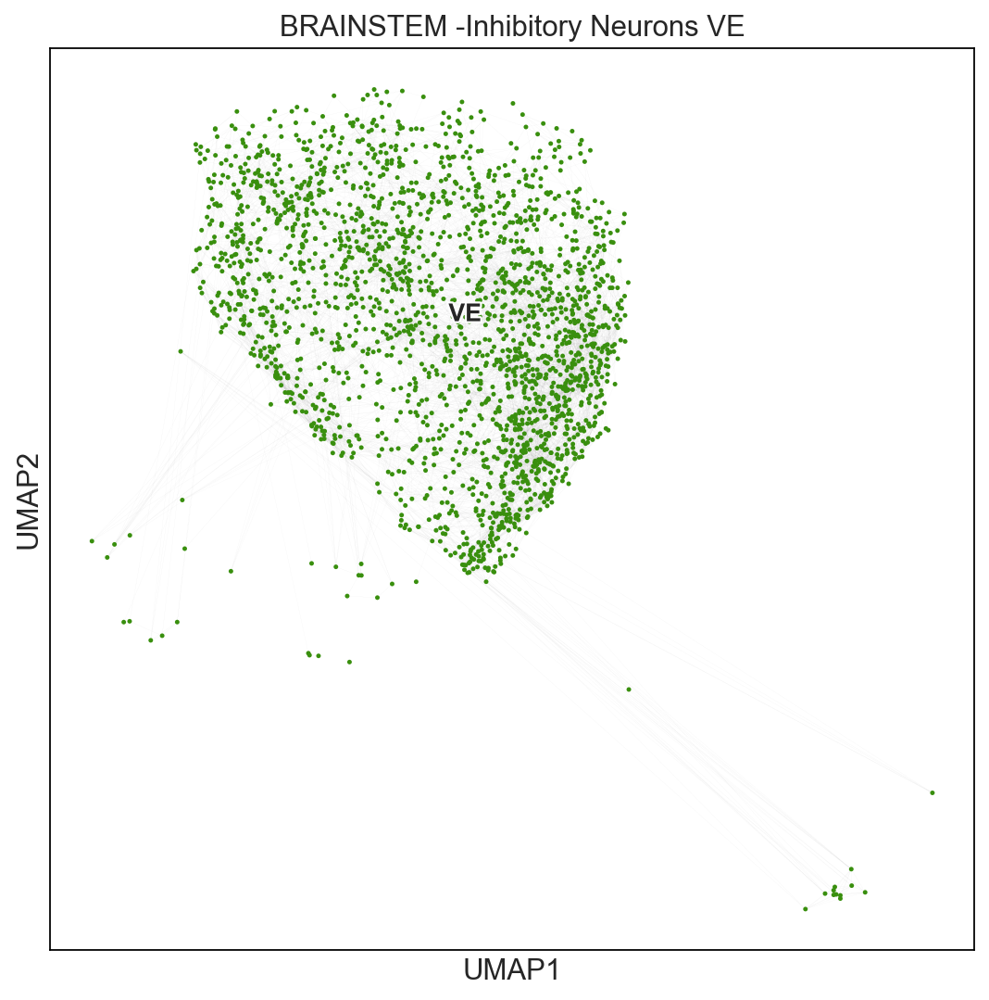

In [29]:
sc.set_figure_params(figsize=(8, 8))
adata_inter_BS_VE = adata_inter_BS.copy()
adata_inter_BS_VE = adata_inter_BS_VE[adata_inter_BS_VE.obs.Condition == 'VE']

adata_inter_BS_WT = adata_inter_BS.copy()
adata_inter_BS_WT = adata_inter_BS_WT[adata_inter_BS_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_inter_BS_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM - Inhibitory Neurons WT"])

sc.pl.umap(adata_inter_BS_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM -Inhibitory Neurons VE"])


### Astrocytes

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


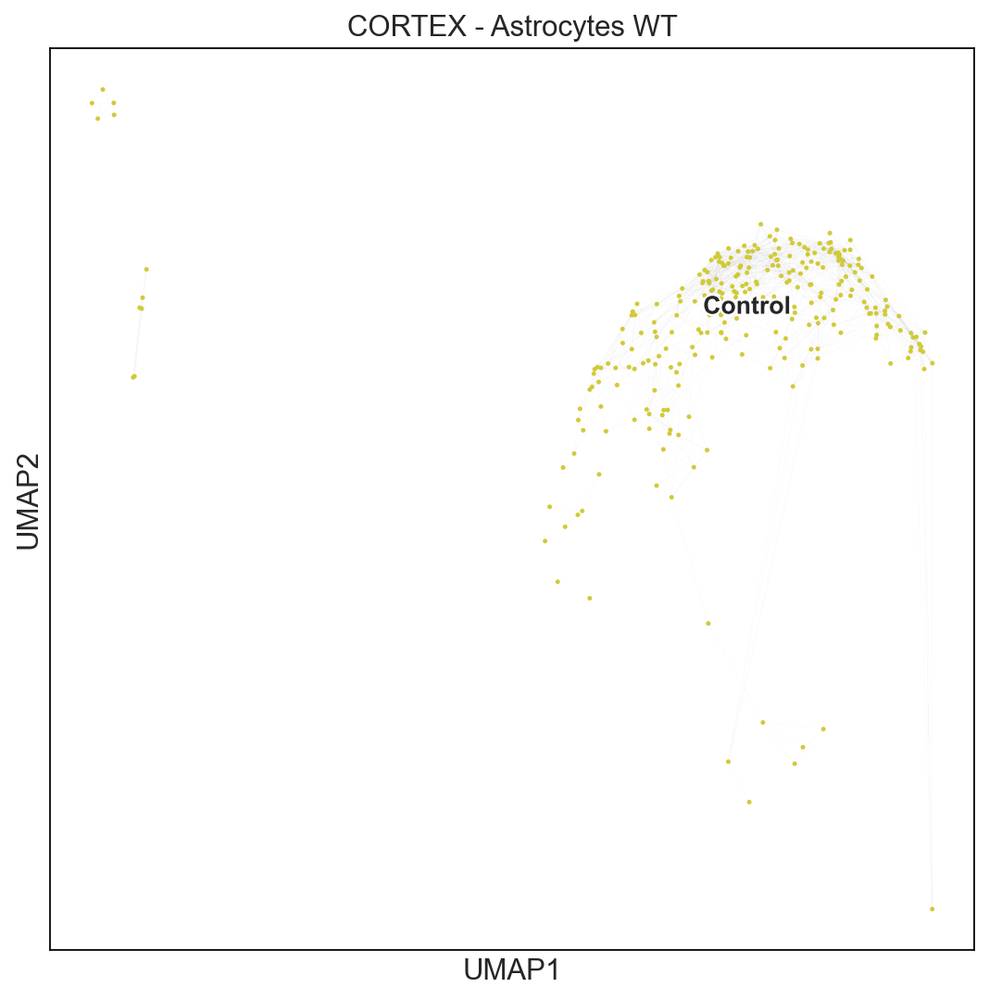

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


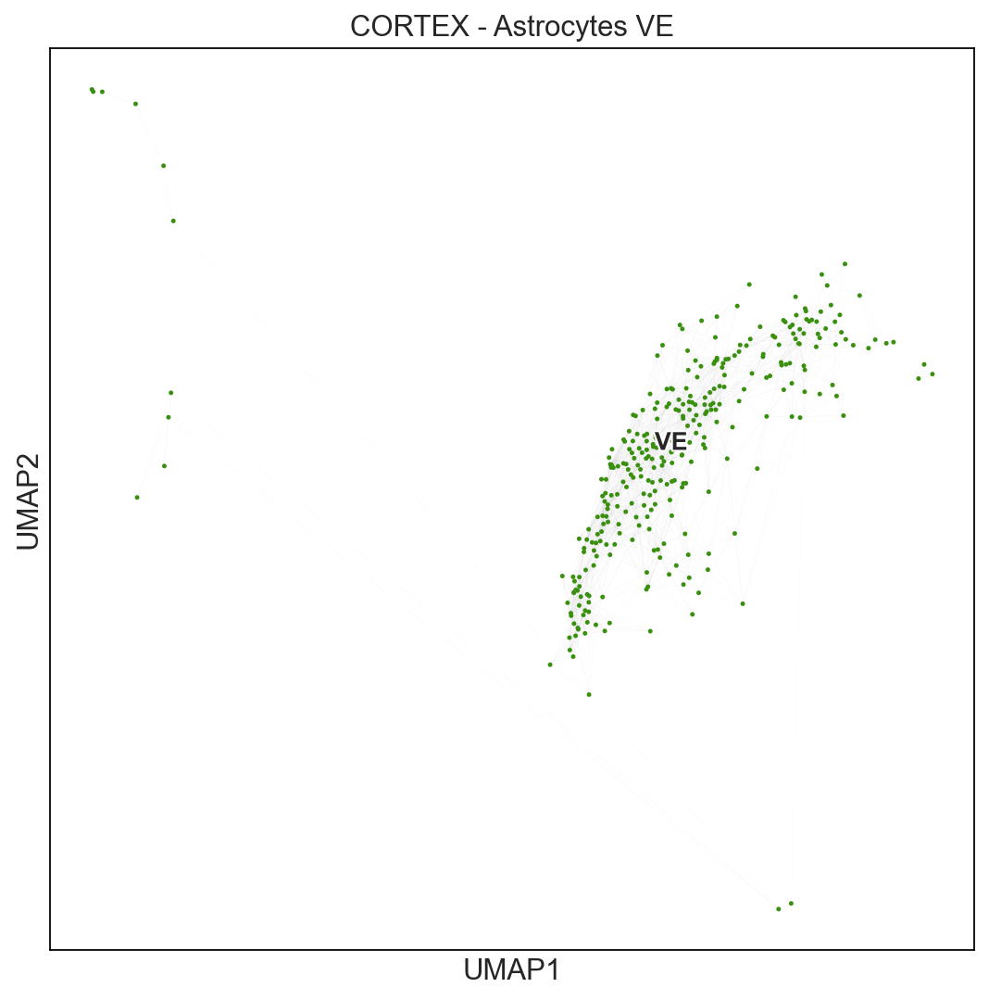

In [32]:
sc.set_figure_params(figsize=(8, 8))
adata_astro_cortex_VE = adata_astro_cortex.copy()
adata_astro_cortex_VE = adata_astro_cortex_VE[adata_astro_cortex_VE.obs.Condition == 'VE']

adata_astro_cortex_WT = adata_astro_cortex.copy()
adata_astro_cortex_WT = adata_astro_cortex_WT[adata_astro_cortex_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_astro_cortex_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Astrocytes WT"])

sc.pl.umap(adata_astro_cortex_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Astrocytes VE"])


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


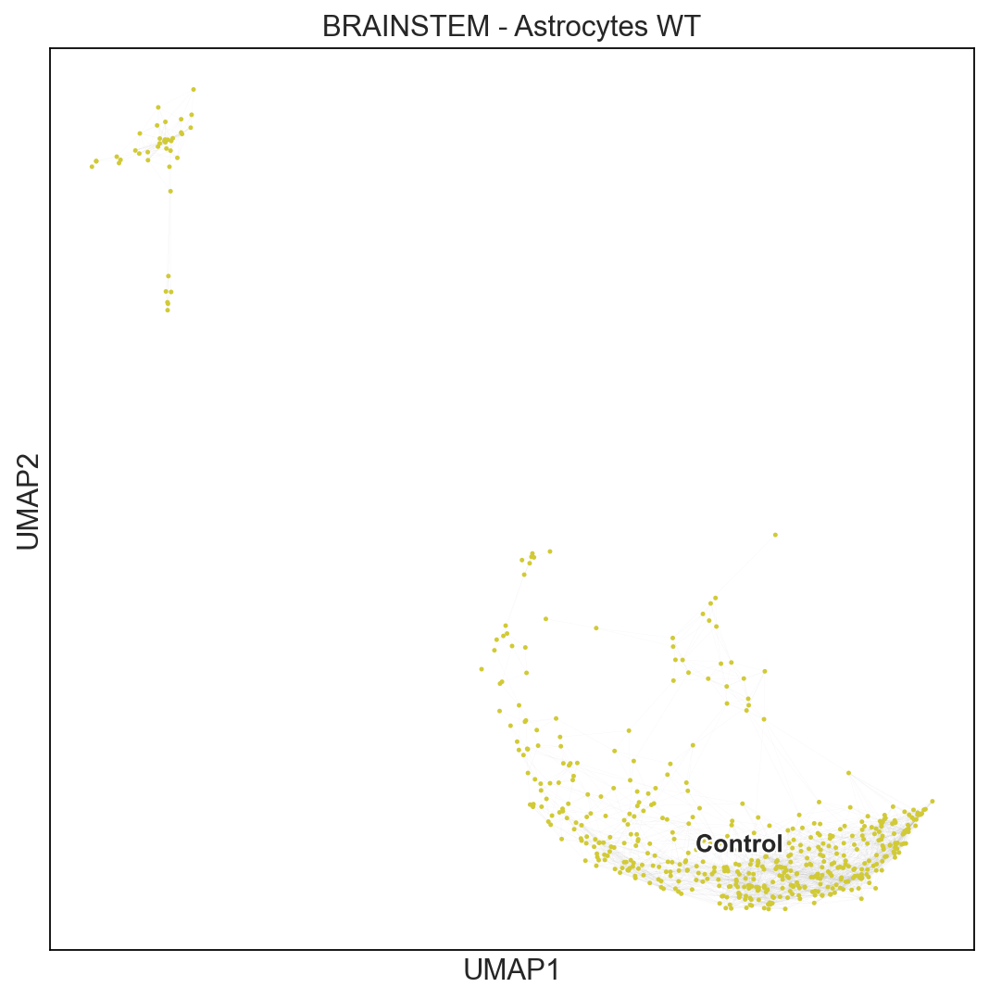

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


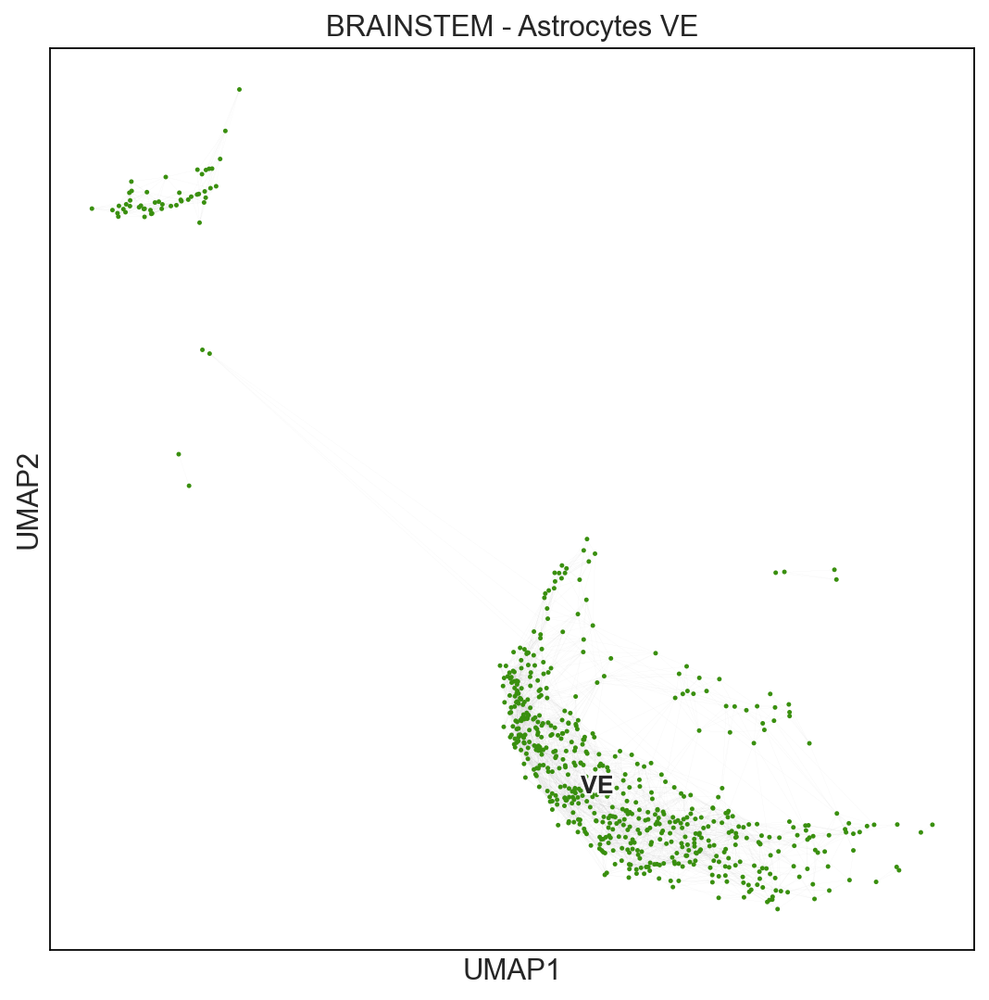

In [34]:
sc.set_figure_params(figsize=(8, 8))
adata_astro_BS_VE = adata_astro_BS.copy()
adata_astro_BS_VE = adata_astro_BS_VE[adata_astro_BS_VE.obs.Condition == 'VE']

adata_astro_BS_WT = adata_astro_BS.copy()
adata_astro_BS_WT = adata_astro_BS_WT[adata_astro_BS_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_astro_BS_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM - Astrocytes WT"])

sc.pl.umap(adata_astro_BS_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM - Astrocytes VE"])


### Oligo

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


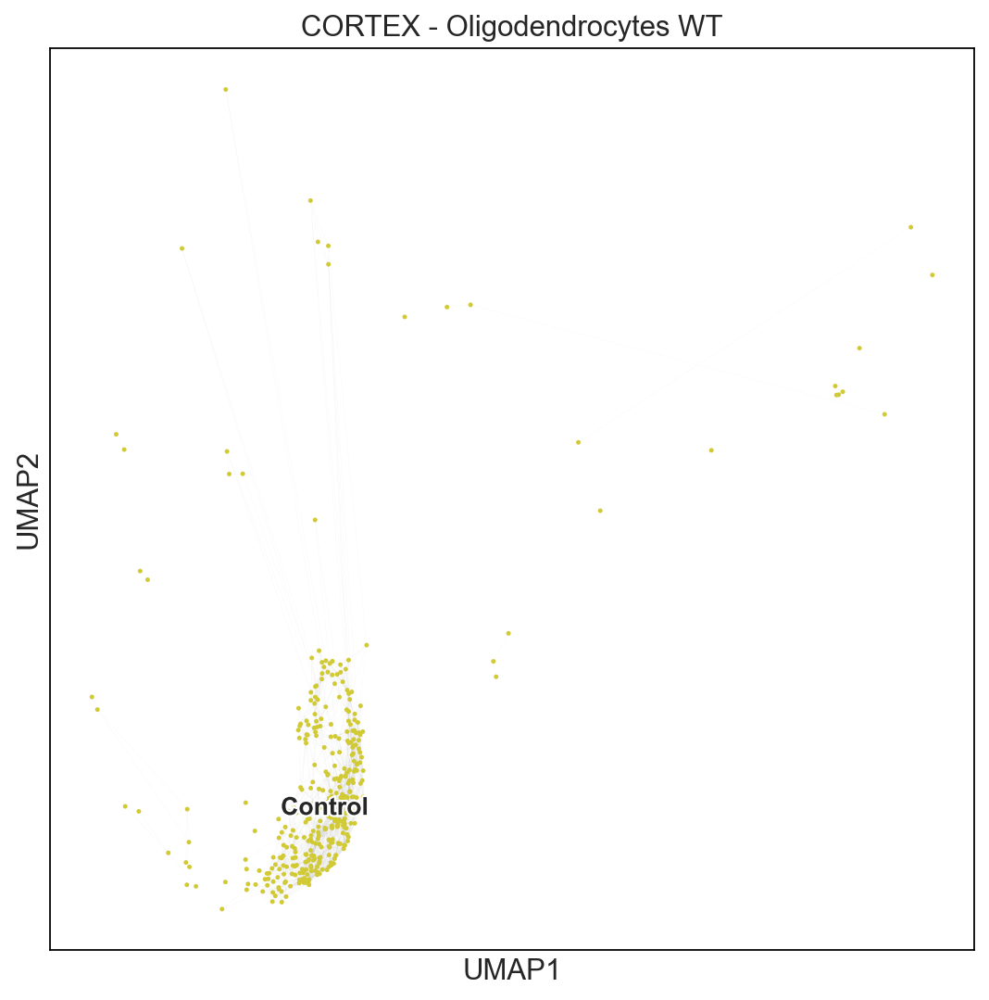

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


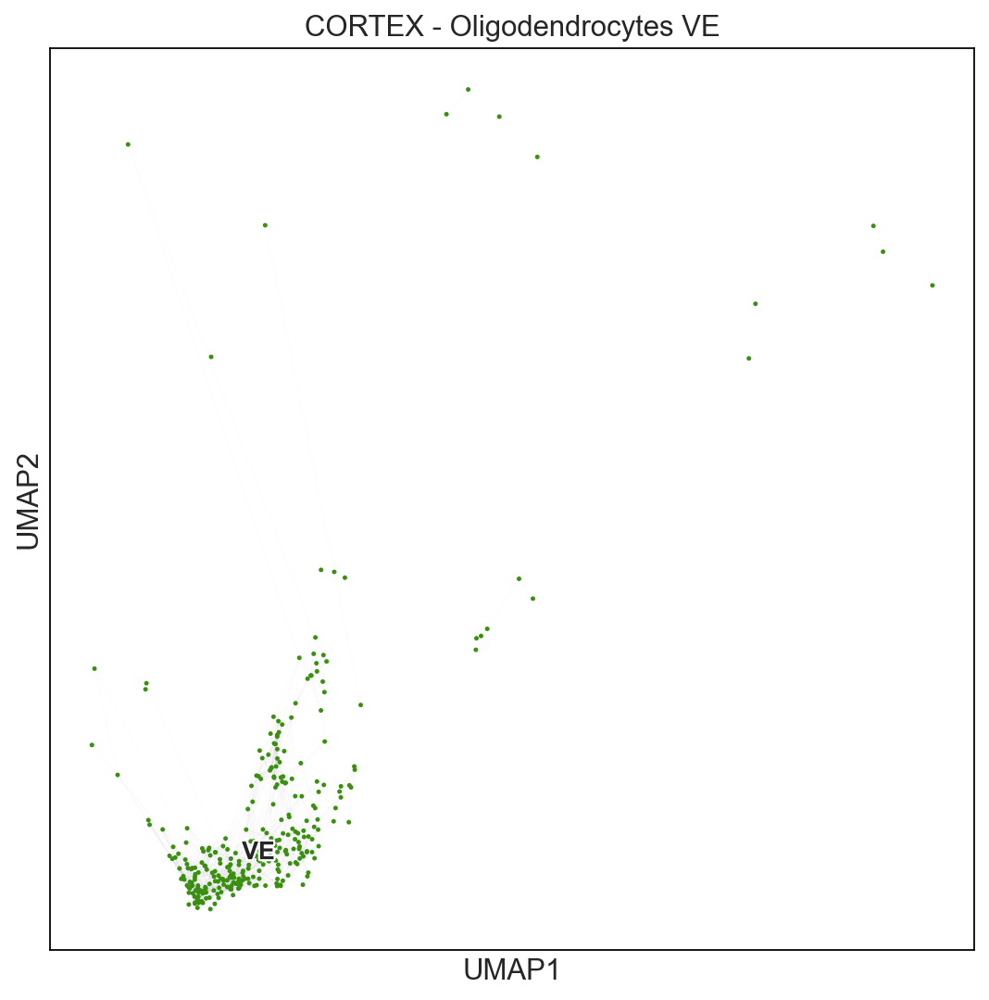

In [37]:
sc.set_figure_params(figsize=(8, 8))
adata_oligo_cortex_VE = adata_oligo_cortex.copy()
adata_oligo_cortex_VE = adata_oligo_cortex_VE[adata_oligo_cortex_VE.obs.Condition == 'VE']

adata_oligo_cortex_WT = adata_oligo_cortex.copy()
adata_oligo_cortex_WT = adata_oligo_cortex_WT[adata_oligo_cortex_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_cortex_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Oligodendrocytes WT"])

sc.pl.umap(adata_oligo_cortex_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Oligodendrocytes VE"])


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


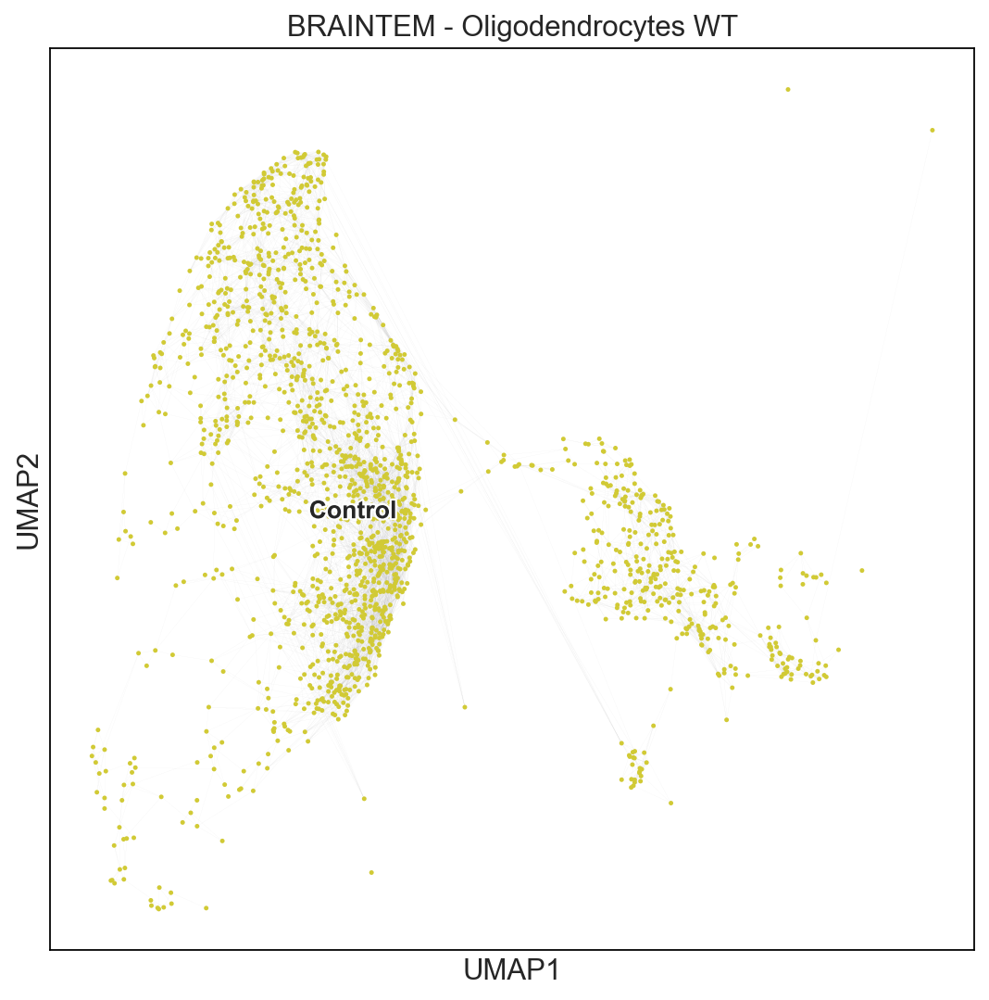

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


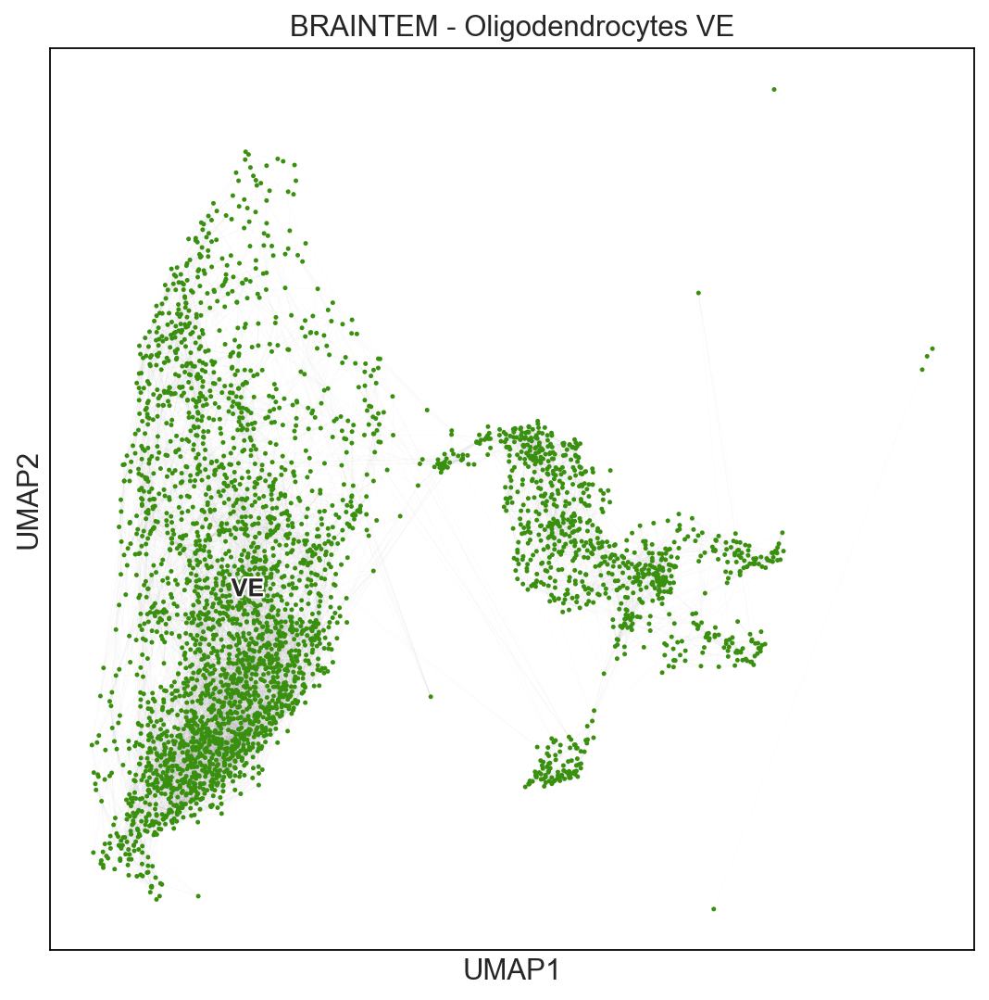

In [39]:
sc.set_figure_params(figsize=(8, 8))
adata_oligo_BS_VE = adata_oligo_BS.copy()
adata_oligo_BS_VE = adata_oligo_BS_VE[adata_oligo_BS_VE.obs.Condition == 'VE']

adata_oligo_BS_WT = adata_oligo_BS.copy()
adata_oligo_BS_WT = adata_oligo_BS_WT[adata_oligo_BS_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_BS_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINTEM - Oligodendrocytes WT"])

sc.pl.umap(adata_oligo_BS_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINTEM - Oligodendrocytes VE"])


### OPC

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


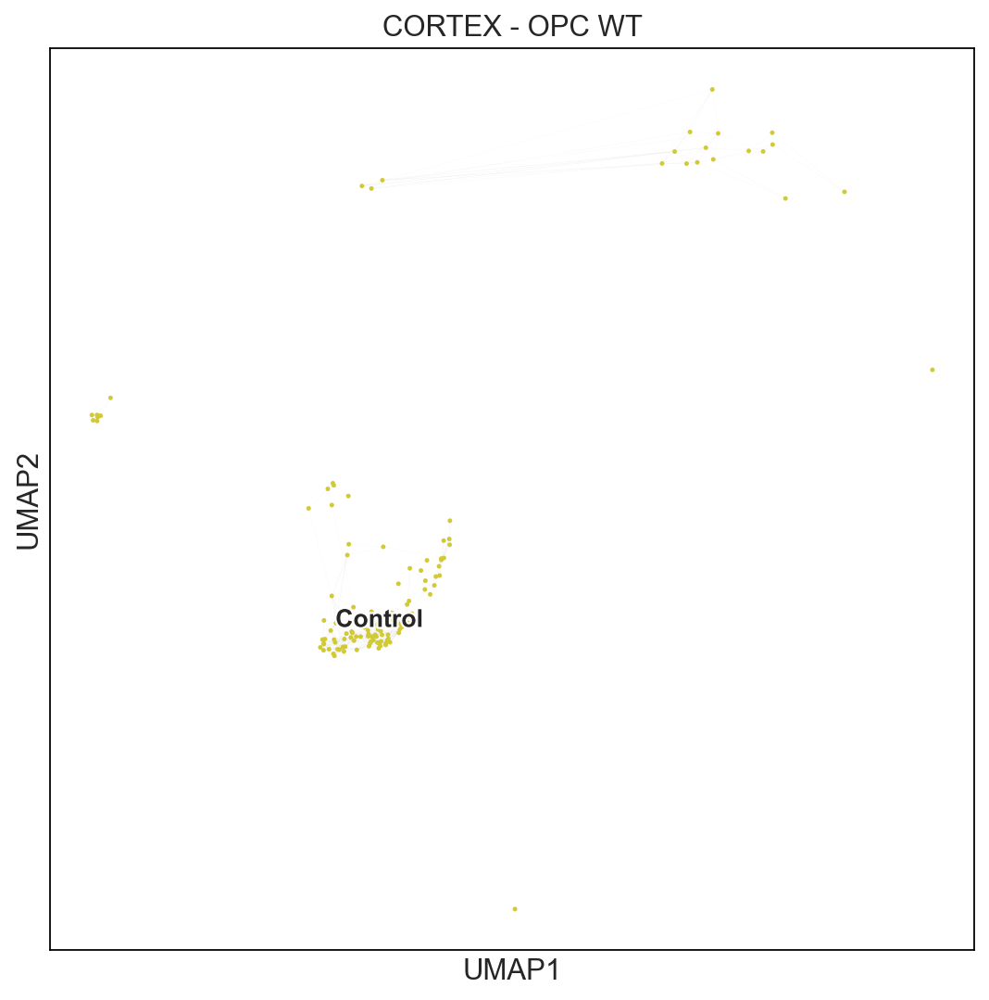

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


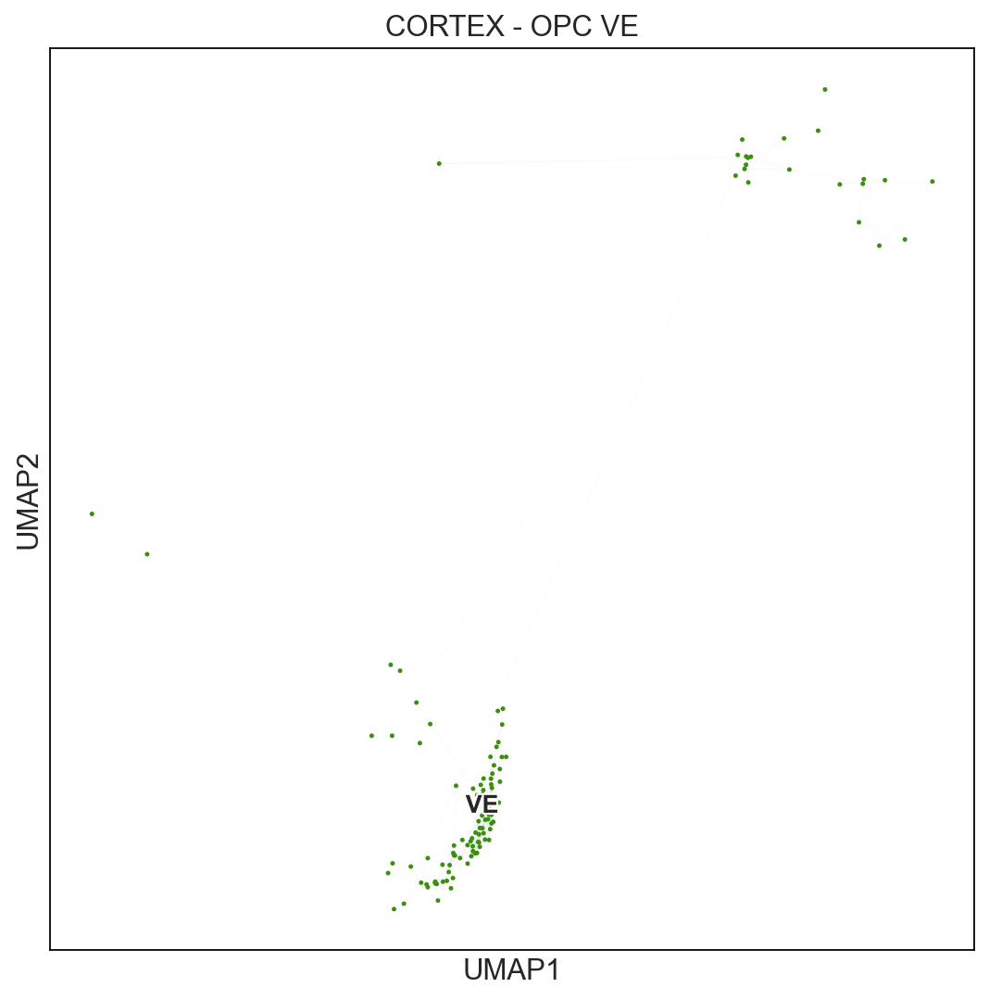

In [42]:
sc.set_figure_params(figsize=(8, 8))
adata_opc_cortex_VE = adata_opc_cortex.copy()
adata_opc_cortex_VE = adata_opc_cortex_VE[adata_opc_cortex_VE.obs.Condition == 'VE']

adata_opc_cortex_WT = adata_opc_cortex.copy()
adata_opc_cortex_WT = adata_opc_cortex_WT[adata_opc_cortex_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_opc_cortex_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - OPC WT"])

sc.pl.umap(adata_opc_cortex_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - OPC VE"])


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


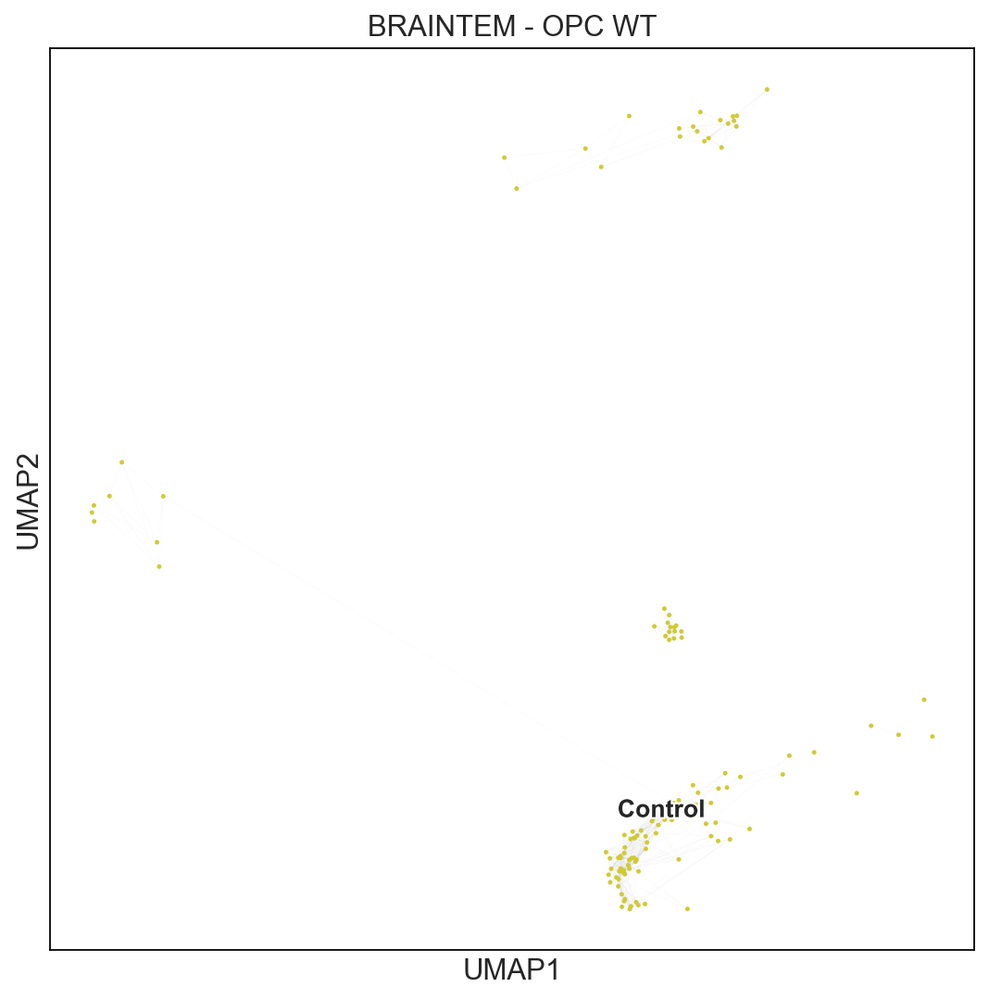

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'B_region' as categorical


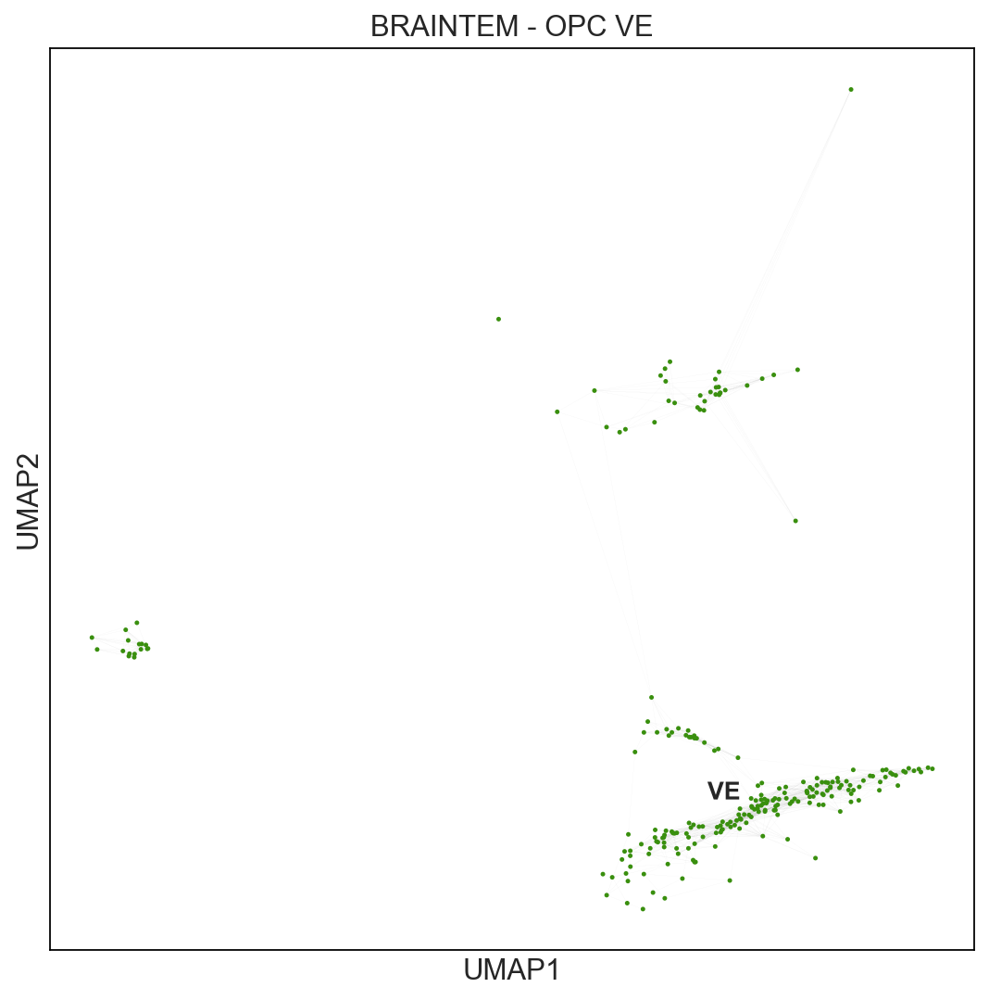

In [44]:
sc.set_figure_params(figsize=(8, 8))
adata_opc_BS_VE = adata_opc_BS.copy()
adata_opc_BS_VE = adata_opc_BS_VE[adata_opc_BS_VE.obs.Condition == 'VE']

adata_opc_BS_WT = adata_opc_BS.copy()
adata_opc_BS_WT = adata_opc_BS_WT[adata_opc_BS_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_opc_BS_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINTEM - OPC WT"])

sc.pl.umap(adata_opc_BS_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINTEM - OPC VE"])


### Microglia

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Trying to set attribute `.uns` of view, copying.


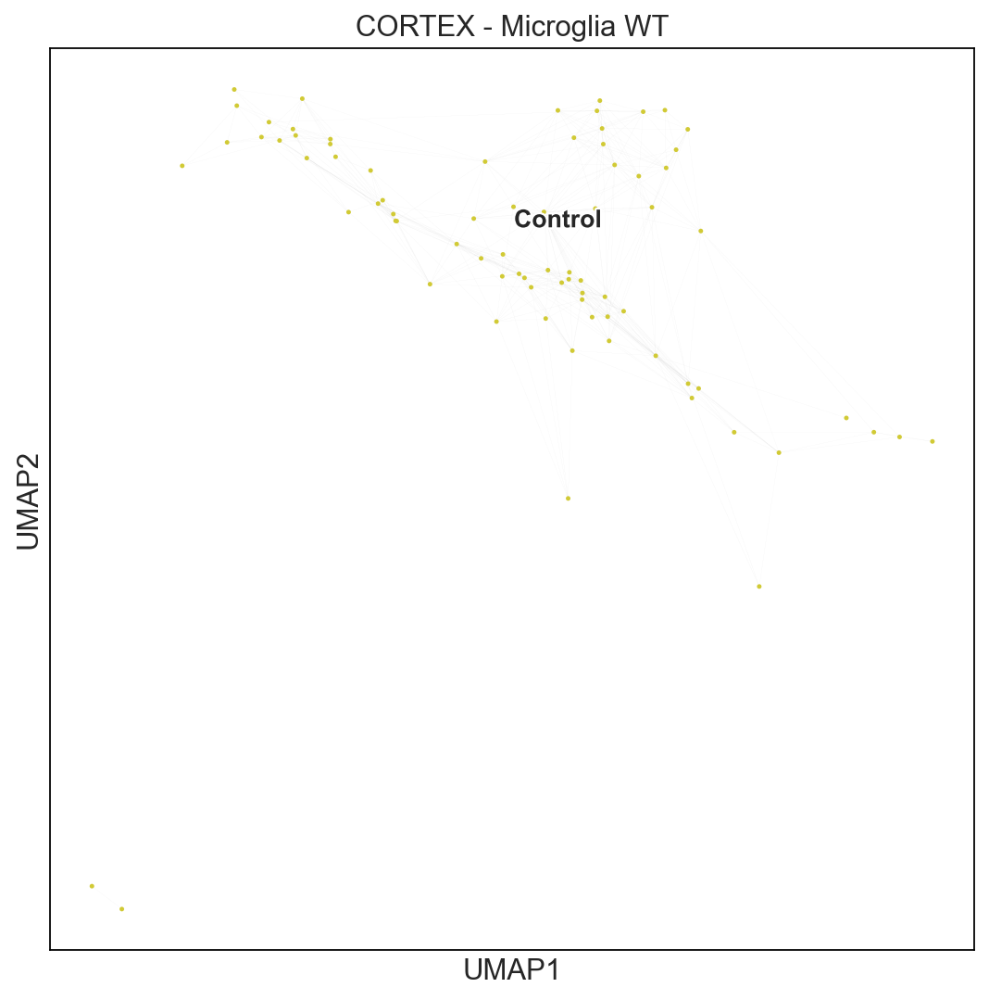

Trying to set attribute `.uns` of view, copying.


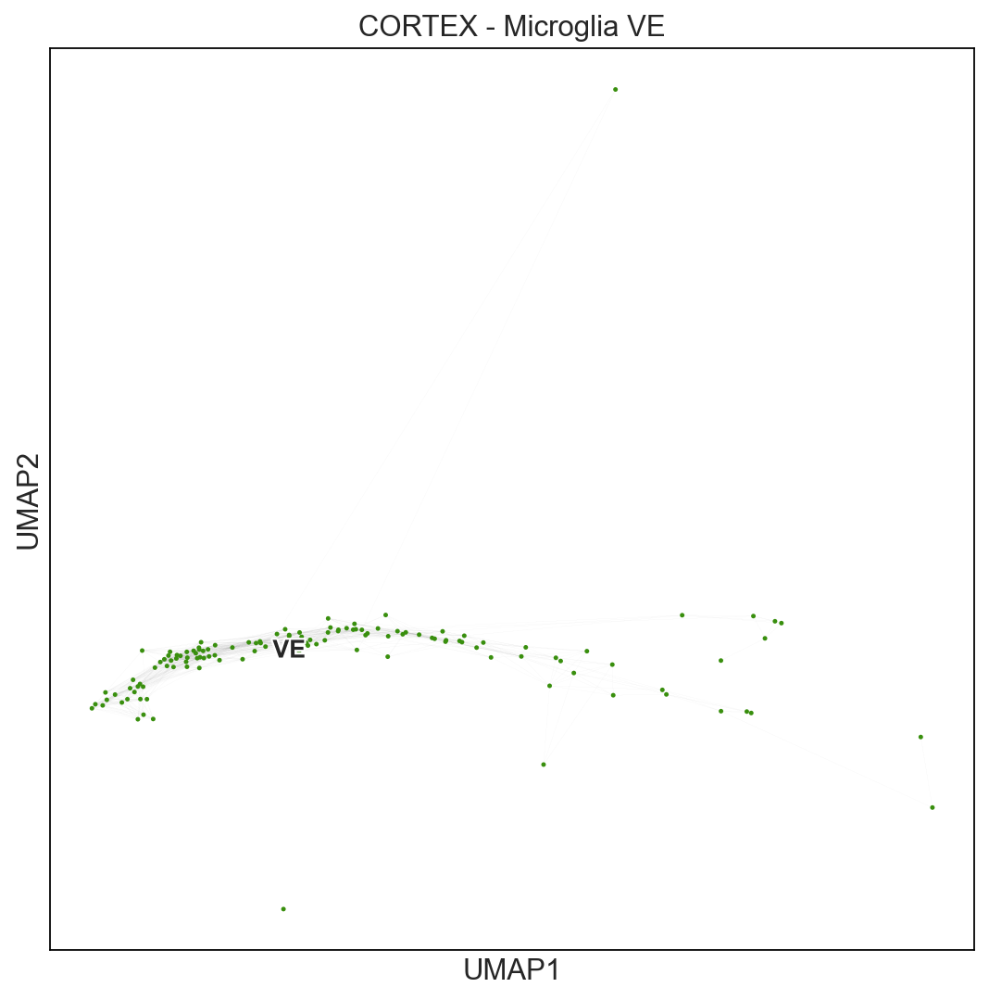

In [19]:
sc.set_figure_params(figsize=(8, 8))
adata_microglia_cortex_VE = adata_microglia_cortex.copy()
adata_microglia_cortex_VE = adata_microglia_cortex_VE[adata_microglia_cortex_VE.obs.Condition == 'VE']

adata_microglia_cortex_WT = adata_microglia_cortex.copy()
adata_microglia_cortex_WT = adata_microglia_cortex_WT[adata_microglia_cortex_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_microglia_cortex_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Microglia WT"])

sc.pl.umap(adata_microglia_cortex_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["CORTEX - Microglia VE"])


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Trying to set attribute `.uns` of view, copying.


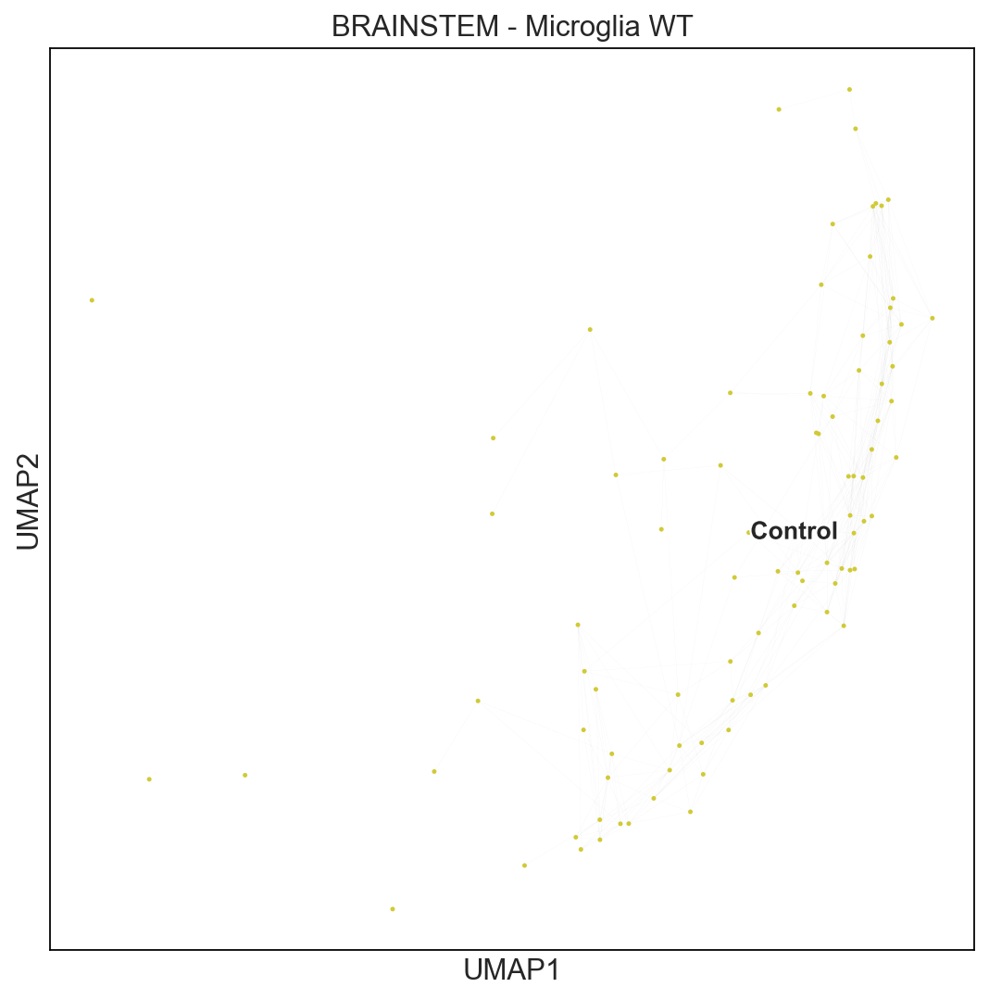

Trying to set attribute `.uns` of view, copying.


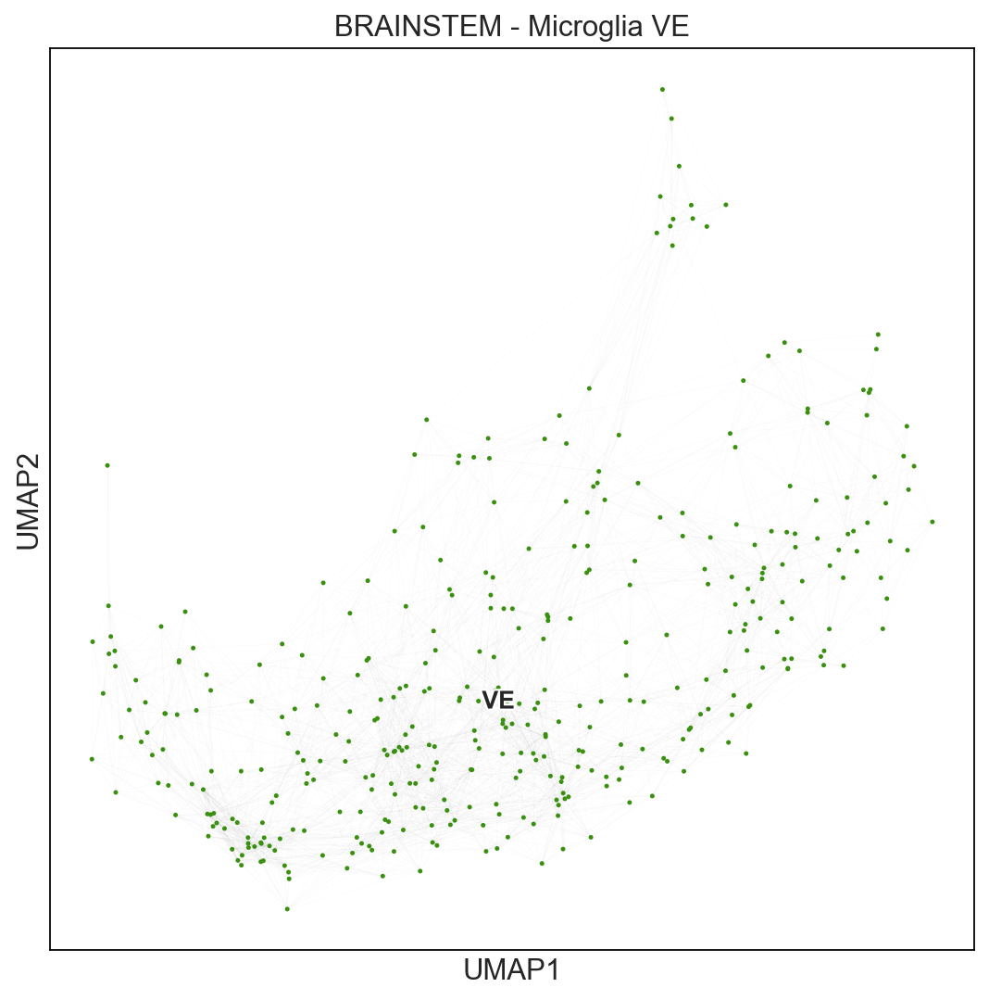

In [20]:
sc.set_figure_params(figsize=(8, 8))
adata_microglia_BS_VE = adata_microglia_BS.copy()
adata_microglia_BS_VE = adata_microglia_BS_VE[adata_microglia_BS_VE.obs.Condition == 'VE']

adata_microglia_BS_WT = adata_microglia_BS.copy()
adata_microglia_BS_WT = adata_microglia_BS_WT[adata_microglia_BS_WT.obs.Condition != 'VE']


sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_microglia_BS_WT, 
           color= ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ['#D1CA35'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM - Microglia WT"])

sc.pl.umap(adata_microglia_BS_VE, 
           color = ['Condition'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette=['#398F0E'],
           size=20, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["BRAINSTEM - Microglia VE"])
